In [5]:
## Produce a complete and harmonised f2f dataset for major 'demographic' features

# step 1 - fill in the gaps in the variables already identified (vote/turnout/age/income/housing)

In [6]:
%%time
dataset_name = "W19_only"
df_list = []

%matplotlib inline 
%run f2f_header.py {dataset_name} {df_list}
# (var_type, cat_dictionary, new_old_col_names, old_new_col_names) = get_small_files(data_subfolder, encoding)    
# get full set of inferred "cross wave" auth-lib/left-right values and ages
# pan_dataset_allr_values = pd.read_pickle(BES_small_data_files + "pan_dataset_allr_valuesW19"+".zip",compression='zip')
# # pan_dataset_allr_values = pan_dataset_allr_values.loc[BES_Panel.index].sort_index()
# pan_dataset_ages = pd.read_pickle(BES_small_data_files + "pan_dataset_ages"+".zip", compression='zip')
# pan_dataset_votes = pd.read_pickle(BES_small_data_files+"pan_dataset_votes"+".zip",compression='zip')
# del BES_Panel

Toggle code

Wall time: 3.35 s


In [12]:
BES_df_list = pickle.load( open( "E:\\BES_analysis_data\\Face_to_face\\BES_df_list.pickle", "rb" ) )
f2f_harmonised = pd.read_pickle("E:\\BES_analysis_data\\Face_to_face\\f2f_harmonised.zip", compression='zip')
BES_label_list = pickle.load( open( "E:\\BES_analysis_data\\Face_to_face\\BES_label_list.pickle", "rb" ) )
demo_var_dict = pickle.load( open( "E:\\BES_analysis_data\\Face_to_face\\demo_var_dict.pickle", "rb" ) )
var_type_dict_nonans = pickle.load( open( "E:\\BES_analysis_data\\Face_to_face\\var_type_dict_nonans.pickle", "rb" ) )

In [572]:
# BUG blank labels
# 1974_feb
BES_label_list["1974_feb"]['studyid'] = 'studyid'
BES_label_list["1974_feb"]['series'] = 'series'

# 1974_oct
BES_label_list["1974_oct"]["studyid"] = 'studyid'
BES_label_list["1974_oct"]["respno"] = 'respno'
BES_label_list["1974_oct"]["cardno"] = 'cardno'
BES_label_list["1974_oct"]["series"] = 'series'
BES_label_list["1974_oct"]["oct503"] = 'oct503'
BES_label_list["1974_oct"]["oct504"] = 'oct504'
BES_label_list["1974_oct"]["oct505"] = 'oct505'
BES_label_list["1974_oct"]["oct506"] = 'oct506'
BES_label_list["1974_oct"]["oct507"] = 'oct507'

# 1983
BES_label_list["1983"]["id1"] = 'serial number1'
BES_label_list["1983"]["id2"] = 'serial number2'
BES_label_list["1983"]["id3"] = 'serial number3'
BES_label_list["1983"]["id4"] = 'serial number4'
BES_label_list["1983"]["id5"] = 'serial number5'
BES_label_list["1983"]["id6"] = 'serial number6'
BES_label_list["1983"]["id7"] = 'serial number7'
BES_label_list["1983"]["id8"] = 'serial number8'

BES_label_list["1983"]["record1"] = 'card number1'
BES_label_list["1983"]["record2"] = 'card number2'
BES_label_list["1983"]["record3"] = 'card number3'
BES_label_list["1983"]["record4"] = 'card number4'
BES_label_list["1983"]["record5"] = 'card number5'
BES_label_list["1983"]["record6"] = 'card number6'
BES_label_list["1983"]["record7"] = 'card number7'
BES_label_list["1983"]["record8"] = 'card number8'

# 1997
# BUG
## change variable name to avoid collision
ge = "1997"
BES_label_list["1997"]['vote_bes'] = BES_label_list["1997"]['vote']
del BES_label_list["1997"]['vote']
BES_df_list["1997"]['vote_bes'] = BES_df_list["1997"]['vote']
BES_df_list["1997"].drop('vote',axis=1,inplace=True)

# 1997
BES_label_list["1997"]['rfdcan'] = 'referendum party talked to r?'
BES_label_list["1997"]['rfdphn'] = 'referendum party called at home?'

BES_label_list["1997"]['dkcan'] = "can't say from which party canvassed?"
BES_label_list["1997"]['dkphn'] = "can't say from which party called?"

BES_label_list["1997"]['othconsn'] = '1997+ parliamentary constituency  [other add] (diff format)'

ge="2019"
# BUG: Presence of "|" character in dataset
BES_df_list[ge]["a01"] = BES_df_list[ge]["a01"].cat.rename_categories({'coming out of |Europe':'coming out of Europe'})

# label collision
BES_label_list[ge]['Q23_CSES'] = "Gender(cses)"

In [ ]:
simple_dict = {"LD":"LD","LIB":"LD","ALL":"LD","UKIP":"REFUK","BXP":"REFUK","BNP":"REFUK","VOTED":"DK","OTH":"DK","TY":"DK",
 "SD":"LD","REF":"REFUK","COM":"DK"}
bloc_dict = {"CON":"Right-Auth","REFUK":"Right-Auth",
             "LAB":"Left-Lib","LD":"Left-Lib","PC":"Left-Lib","SNP":"Left-Lib","GP":"Left-Lib",
             "DNV":"Neither","DK":np.nan}
turnout_dict = {"CON":"VOTED","REFUK":"VOTED",
             "LAB":"VOTED","LD":"VOTED","PC":"VOTED","SNP":"VOTED","GP":"VOTED",
             "DNV":"DNV","DK":np.nan,
             "LIB":"VOTED","ALL":"VOTED","UKIP":"VOTED","BXP":"VOTED","BNP":"VOTED","VOTED":"VOTED","OTH":"VOTED",
             "SD":"VOTED","REF":"VOTED","COM":"VOTED",
             "TY":"CNV",
               }



In [40]:
generic_cols = f2f_harmonised.columns

def full_form_birth_year(x):
    if pd.isnull(x):
        return np.nan
    elif x>60:
        return 1800 + x
    else:
        return 1900 + x
    
def rep_char(x):
    return x.replace('[', '{').replace(']', '}').replace('<', '{').replace('>', '}')

def replace_var_names(labels):
    varname_replace_dict = {}
    replace_char_dict = {"[":"{","]":"}"}
    for col in df_simp.columns:
        if np.any([x in col for x in generic_cols]) or (col =="Age"):
            # 'age' is a problem as a common word component
            varname_replace_dict[col] = rep_char(col)
            
        elif "|" not in col:
            varname_replace_dict[col] = rep_char(labels[col])
        elif len(col.split("|"))==2:
            varname_replace_dict[col] = rep_char(labels[col.split("|")[0]])\
                +"("+ rep_char(col.split("|")[1]) +")"
        if varname_replace_dict[col]=="":
            varname_replace_dict[col] = rep_char(col)
    return varname_replace_dict

def rep_char(x):
    return x.replace('[', '{').replace(']', '}').replace('<', '{').replace('>', '}')

def replace_var_names(labels,df_simp):
    varname_replace_dict = {}
    replace_char_dict = {"[":"{","]":"}"}
    for col in df_simp.columns:
        if np.any([x in col for x in generic_cols]) or (col =="Age"):
            # 'age' is a problem as a common word component
            varname_replace_dict[col] = rep_char(col)
            
        elif "|" not in col:
            varname_replace_dict[col] = rep_char(labels[col])
        elif len(col.split("|"))==2:
            varname_replace_dict[col] = rep_char(labels[col.split("|")[0]])\
                +"("+ rep_char(col.split("|")[1]) +")"
        if varname_replace_dict[col]=="":
            varname_replace_dict[col] = rep_char(col)
    return varname_replace_dict

def prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars = [],demo_var_only=True,
        multi_class_target=False,dummy_na=True):

    if demo_var_only:
        demo_vars = demo_var_dict[ge]
    else:
        demo_vars = list(BES_label_list[ge].keys())

#     labels = BES_label_list[ge]
    df = pd.concat([BES_df_list[ge],
                            f2f_harmonised[f2f_harmonised["dataset"]==ge][harm_vars]
                           ],axis=1)
    old_demo_vars = demo_vars.copy()
    demo_vars = demo_vars+harm_vars
    demo_vars = list(set(demo_vars).intersection(df.columns))
    if drop_vars:
        demo_vars = [x for x in demo_vars if x not in drop_vars]
        old_demo_vars = [x for x in old_demo_vars if x not in drop_vars]    

    df_simp = df[demo_vars].copy()

    df_simp[target_var] = df_simp[target_var].replace(target_var_replace_dict)
    # prep nominal and ordinal as categorical to be dummied
    old_demo_vars = [x for x in old_demo_vars if var_type_dict_nonans[ge][x] in ["nominal","ordinal"]]
    scale_vars = [x for x in old_demo_vars if var_type_dict_nonans[ge][x] in ["scale"]]
        
    if not multi_class_target:
        df_simp[target_var] = df_simp[target_var].replace(target_var_replace_dict)    
        df_simp[old_demo_vars] = df_simp[old_demo_vars].astype('category')    
        df_simp[scale_vars] = df_simp[scale_vars].astype('float')
        df_simp = pd.get_dummies(df_simp,prefix_sep='|',dummy_na=dummy_na).drop(target_var_drop_list,axis=1)
        if target_var+"|nan" in df_simp.columns:
            df_simp.loc[df_simp[target_var+"|nan"]==1,var_stub]=np.nan
            df_simp.drop(target_var+"|nan",axis=1,inplace=True,)
    else:
        old_demo_vars = [x for x in old_demo_vars if x !=target_var]
        scale_vars = [x for x in scale_vars if x !=target_var]   
        df_simp[old_demo_vars] = df_simp[old_demo_vars].astype('category')    
        df_simp[scale_vars] = df_simp[scale_vars].astype('float')        
        df_simp[target_var] = df_simp[target_var].astype('category')
        target_var_drop_list = [x for x in target_var_drop_list if x in df_simp[target_var].cat.categories]
        df_simp[target_var] = df_simp[target_var].cat.remove_categories(target_var_drop_list)        
        all_but_target = [x for x in df_simp.columns if x !=target_var]
        target_temp = df_simp[target_var].copy()
        df_simp = pd.get_dummies(df_simp[all_but_target],prefix_sep='|',dummy_na=dummy_na)
        df_simp[target_temp.name] = target_temp
        

    df_simp = df_simp.rename(columns = replace_var_names( BES_label_list[ge] , df_simp ))  
    

    Treatment = var_stub+"_"+ge

    var_list = [var_stub]
    var_stub_list = [var_stub,]
    if not multi_class_target:
        df_simp = df_simp.select_dtypes('number')
        df_simp = df_simp.astype('float')
#     mask = df_simp[var_stub].notnull() & df_simp["wt"].notnull()
    return df_simp


def prep_df(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars = [],demo_var_only=True,alg=None,
           multi_class_target=False,dummy_na=True):

    # drop drop_var variables from demo_var list
    if demo_var_only:
        demo_vars = demo_var_dict[ge]
    else:
        demo_vars = list(BES_label_list[ge].keys())
        

#     labels = BES_label_list[ge]
    df = pd.concat([BES_df_list[ge],
                            f2f_harmonised[f2f_harmonised["dataset"]==ge][harm_vars]
                           ],axis=1)

    
    old_demo_vars = demo_vars.copy()
    demo_vars = demo_vars+harm_vars
    demo_vars = list(set(demo_vars).intersection(df.columns))
    # drop vars after adding harm/dropping ones not present
    if drop_vars:
        demo_vars = [x for x in demo_vars if x not in drop_vars]    
        old_demo_vars = [x for x in old_demo_vars if x not in drop_vars]    

    df_simp = df[demo_vars].copy()



    # prep nominal and ordinal as categorical to be dummied
    old_demo_vars = [x for x in old_demo_vars if var_type_dict_nonans[ge][x] in ["nominal","ordinal"]]
    scale_vars = [x for x in old_demo_vars if var_type_dict_nonans[ge][x] in ["scale"]]
    
    if not multi_class_target:
        df_simp[target_var] = df_simp[target_var].replace(target_var_replace_dict)    
        df_simp[old_demo_vars] = df_simp[old_demo_vars].astype('category')    
        df_simp[scale_vars] = df_simp[scale_vars].astype('float')
        df_simp = pd.get_dummies(df_simp,prefix_sep='|',dummy_na=dummy_na).drop(target_var_drop_list,axis=1)
        if target_var+"|nan" in df_simp.columns:
            df_simp.loc[df_simp[target_var+"|nan"]==1,var_stub]=np.nan
            df_simp.drop(target_var+"|nan",axis=1,inplace=True,)
        eval_metric='rmse'
    else:
        old_demo_vars = [x for x in old_demo_vars if x !=target_var]
        scale_vars = [x for x in scale_vars if x !=target_var]
        df_simp[old_demo_vars] = df_simp[old_demo_vars].astype('category')    
        df_simp[scale_vars] = df_simp[scale_vars].astype('float')
        df_simp[target_var] = df_simp[target_var].astype('category')
        target_var_drop_list = [x for x in target_var_drop_list if x in df_simp[target_var].cat.categories]
        df_simp[target_var] = df_simp[target_var].cat.remove_categories(target_var_drop_list)
        all_but_target = [x for x in df_simp.columns if x !=target_var]
        target_temp = df_simp[target_var].copy()
        df_simp = pd.get_dummies(df_simp[all_but_target],prefix_sep='|',dummy_na=dummy_na)
        df_simp[target_temp.name] = target_temp
        eval_metric='mlogloss'
    
    df_simp = df_simp.rename(columns = replace_var_names( BES_label_list[ge] , df_simp ))  
    

    Treatment = var_stub+"_"+ge

    var_list = [var_stub]
    var_stub_list = [var_stub,]
    
    if not multi_class_target:
        df_simp = df_simp.select_dtypes('number')
        df_simp = df_simp.astype('float')
        
    mask = df_simp[var_stub].notnull() & df_simp["wt"].notnull()
    colname = var_stub
    (explainer, shap_values, train_columns, train_index, alg,output_subfolder)=\
        xgboost_run(subdir=colname,dataset=df_simp[mask].drop("wt",axis=1),
                var_list=var_list,var_stub_list=var_stub_list,
                use_specific_weights=df_simp["wt"][mask],
                min_features = min(df_simp.shape[1]-1,min_features),verbosity=0,
                skip_bar_plot=True,dependence_plots=dependence_plots,alg=alg,eval_metric=eval_metric,                    
                title = "\n\nMore Likely to "+target_var_title_pair[0]+" <---   ---> More Likely to"+target_var_title_pair[1])
    
    return (explainer, shap_values, train_columns, train_index, alg,output_subfolder)

In [18]:
f2f_1974_feb = f2f_harmonised[f2f_harmonised["dataset"]=="1974_feb"].copy()
f2f_1974_feb.isnull().sum()

dataset                    0
uid                        0
housing_det               69
housing                    0
inc                      409
vote                       0
year                       0
wt                         0
age                       22
vote_simple                3
bloc                       0
birth_year                22
harmonised_voted           0
inc_det                 2462
vote_complete           2462
vote_complete_simple    2462
bloc_complete           2462
turnout_complete        2462
dtype: int64

In [20]:
# f2f_1974_feb[f2f_1974_feb["vote_simple"].isnull()]

# vote -> vote_simple (OTH->np.nan)

In [21]:
f2f_1974_feb[f2f_1974_feb["age"].isnull()]

# impute age vals

,dataset,uid,housing_det,housing,inc,vote,year,wt,age,vote_simple,bloc,birth_year,harmonised_voted,inc_det,vote_complete,vote_complete_simple,bloc_complete,turnout_complete
312,1974_feb,1974_feb|312,OWN,OWN,NaN,DK,1974,1.0,NaN,DK,Neither,NaN,1.0,NaN,NaN,NaN,NaN,NaN
324,1974_feb,1974_feb|324,MORT,OWN,middle 3rd,LIB,1974,1.0,NaN,LD,Left-Lib,NaN,1.0,NaN,NaN,NaN,NaN,NaN
368,1974_feb,1974_feb|368,NaN,NA,NaN,LAB,1974,1.0,NaN,LAB,Left-Lib,NaN,1.0,NaN,NaN,NaN,NaN,NaN
446,1974_feb,1974_feb|446,OWN,OWN,middle 3rd,LIB,1974,1.0,NaN,LD,Left-Lib,NaN,1.0,NaN,NaN,NaN,NaN,NaN
535,1974_feb,1974_feb|535,MORT,OWN,NaN,DK,1974,1.0,NaN,DK,Neither,NaN,1.0,NaN,NaN,NaN,NaN,NaN
748,1974_feb,1974_feb|748,MORT,OWN,NaN,CON,1974,1.0,NaN,CON,Right-Auth,NaN,1.0,NaN,NaN,NaN,NaN,NaN
987,1974_feb,1974_feb|987,RENT-LA,RENT,middle 3rd,LIB,1974,1.0,NaN,LD,Left-Lib,NaN,1.0,NaN,NaN,NaN,NaN,NaN
993,1974_feb,1974_feb|993,RENT-PR,RENT,middle 3rd,LIB,1974,1.0,NaN,LD,Left-Lib,NaN,1.0,NaN,NaN,NaN,NaN,NaN
1011,1974_feb,1974_feb|1011,OWN,OWN,NaN,CON,1974,1.0,NaN,CON,Right-Auth,NaN,1.0,NaN,NaN,NaN,NaN,NaN
1408,1974_feb,1974_feb|1408,DK,OWN,NaN,DNV,1974,1.0,NaN,DNV,Neither,NaN,0.0,NaN,NaN,NaN,NaN,NaN


In [23]:
f2f_1974_feb[f2f_1974_feb["housing_det"].isnull()]["housing"].value_counts()

# bit weird that OWN and RENT
# ah - situations where you know only OWN(mort/own) vs RENT(PR/LA) but not details!

# worth using imputation to assign these 7 cases?

OTH     53
NA       6
OWN      5
DK       3
RENT     2
Name: housing, dtype: int64

In [98]:
f2f_1974_feb[f2f_1974_feb["housing_det"].notnull()]["housing"].value_counts()

OWN     1285
RENT    1108
Name: housing, dtype: int64

In [32]:
f2f_1974_feb["housing_det"].value_counts(dropna=False)

RENT-LA    740
MORT       714
OWN        551
RENT-PR    368
NaN         69
DK          20
Name: housing_det, dtype: int64

In [33]:
f2f_1974_feb["housing"].value_counts(dropna=False)

OWN     1290
RENT    1110
OTH       53
NA         6
DK         3
Name: housing, dtype: int64

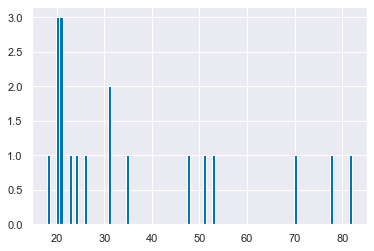

In [118]:
f2f_1974_feb[f2f_1974_feb["housing_det"]=="DK"]["age"].hist(bins=100)

# really not at all obvious what "NA" means for housing (in the process of moving?)

# DKs include a lot of v young people => prob covering 'living with family'

In [103]:
# f2f_1974_feb[f2f_1974_feb["inc"].isnull()]

In [36]:
f2f_1974_feb["inc"].value_counts(dropna=False)

upper 3rd     766
lowest 3rd    681
middle 3rd    606
NaN           409
Name: inc, dtype: int64

In [102]:
# f2f_1974_feb["inc"]

In [401]:
f2f_1974_feb["inc"]

0       middle 3rd
1       lowest 3rd
2        upper 3rd
3       lowest 3rd
4       lowest 3rd
           ...    
2457    middle 3rd
2458     upper 3rd
2459     upper 3rd
2460    lowest 3rd
2461    middle 3rd
Name: inc, Length: 2462, dtype: object

In [101]:
# alg = get_xgboost_alg(classification_problem=False)
# alg

In [48]:
inc = f2f_1974_feb["inc"].astype('category').cat.codes.replace(-1,np.nan)

In [97]:
ge = "1974_feb"
harm_vars = ["wt","age","housing_det","harmonised_voted","inc_det"]
target_var = "inc_det"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "inc_det"
min_features = 10
drop_vars = ["feb212"]

# alg = get_xgboost_alg(classification_problem=False)

# (explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
#                                                                                      target_var_drop_list,target_var_title_pair,
#        var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True,alg=alg)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
# use fitted algorithm to predict values
# inc_pred = alg.predict(df_pred[train_columns])
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [51]:
df_pred.corrwith(inc).sort_values().dropna()

family income(C)                                     -0.396623
family income(B)                                     -0.385013
family income(D)                                     -0.373170
income before or after tax(no tax paid)              -0.363854
marital status of respondent(widowed or separated)   -0.359010
                                                        ...   
feb188|mortgage                                       0.390158
housing_det|MORT                                      0.390158
resp coded job status(present job)                    0.426795
resp job status(in paid job)                          0.428097
family income(H)                                      0.467375
Length: 1299, dtype: float64

In [100]:
# feb212
# variable used to get income in the first pass

# BES_label_list["1974_feb"]["feb212"]

In [99]:
# inc = BES_df_list["1974_feb"]["feb212"].replace("7",np.nan).replace("8",np.nan).astype('category').cat.codes.replace(-1,np.nan)
# inc.value_counts()

# .astype('category')
#.cat.codes

In [71]:
df_pred.corrwith(inc).sort_values().dropna()

family income(A)                                     -0.454588
family income(B)                                     -0.417021
income before or after tax(no tax paid)              -0.402011
marital status of respondent(widowed or separated)   -0.398084
resp coded job status(permanent retired)             -0.340968
                                                        ...   
family income(J)                                      0.381127
feb188|mortgage                                       0.398337
housing_det|MORT                                      0.398337
resp coded job status(present job)                    0.454036
resp job status(in paid job)                          0.455155
Length: 1299, dtype: float64

In [79]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","inc_det"] = inc

MSE: 3.69, MAE: 1.41, EV: 0.61, R2: 0.60


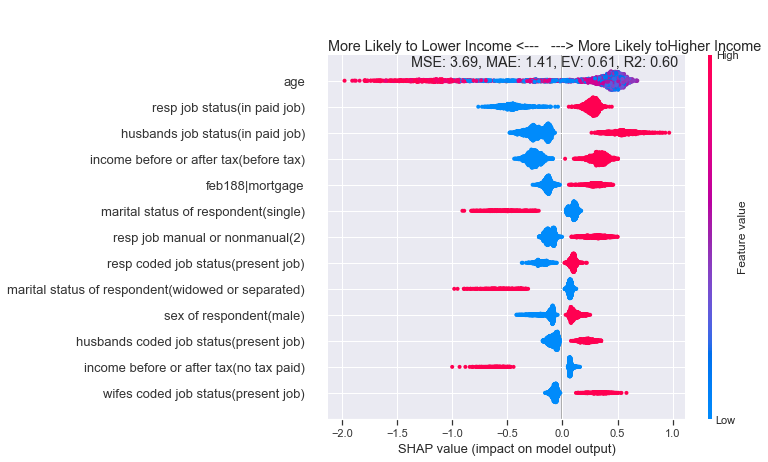

<Figure size 1152x720 with 0 Axes>

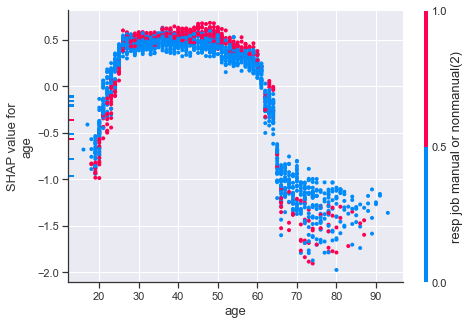

<Figure size 1152x720 with 0 Axes>

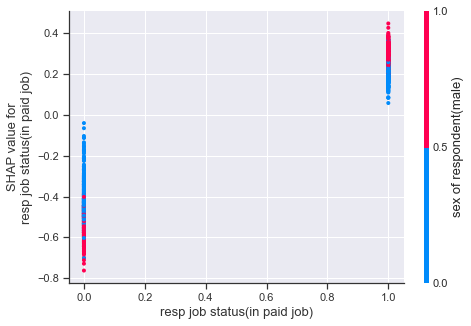

<Figure size 1152x720 with 0 Axes>

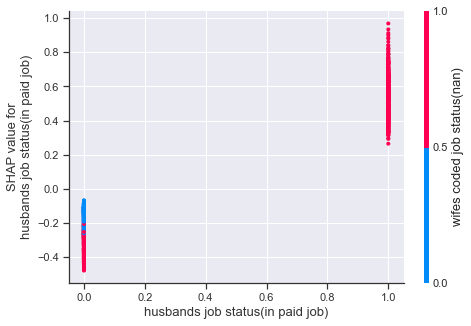

<Figure size 1152x720 with 0 Axes>

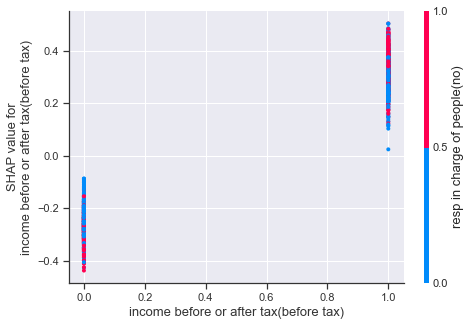

<Figure size 1152x720 with 0 Axes>

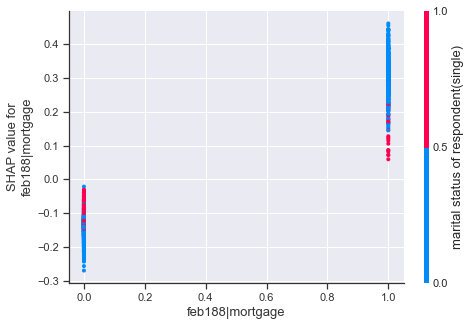

<Figure size 1152x720 with 0 Axes>

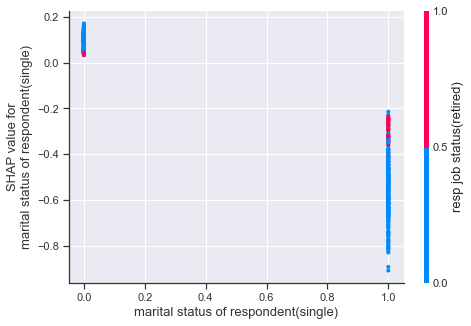

<Figure size 1152x720 with 0 Axes>

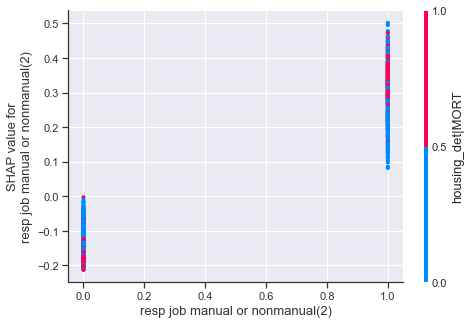

<Figure size 1152x720 with 0 Axes>

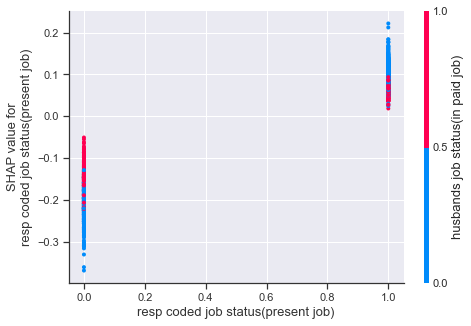

<Figure size 1152x720 with 0 Axes>

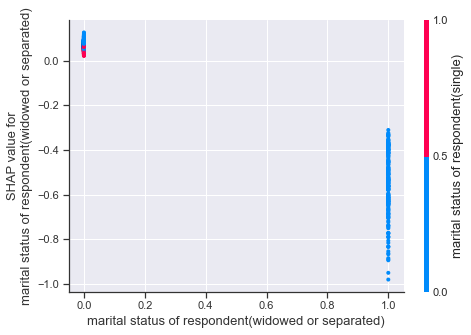

<Figure size 1152x720 with 0 Axes>

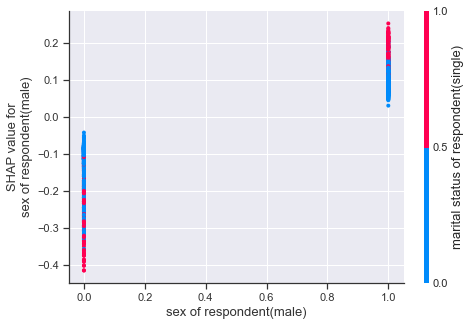

<Figure size 1152x720 with 0 Axes>

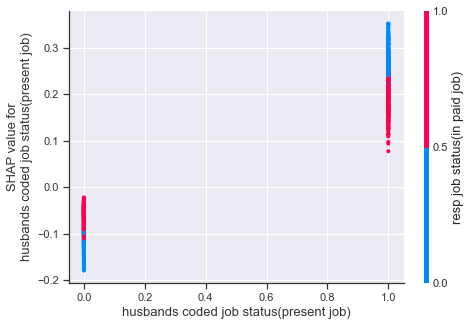

<Figure size 1152x720 with 0 Axes>

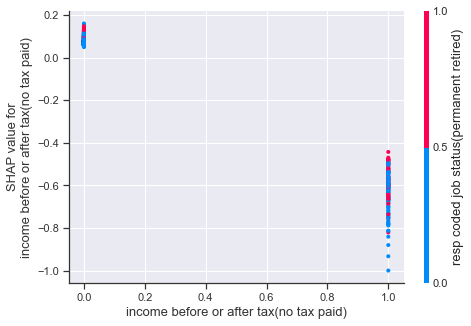

<Figure size 1152x720 with 0 Axes>

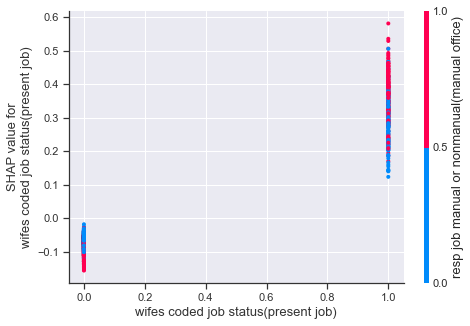

In [81]:
ge = "1974_feb"
harm_vars = ["wt","age","housing_det","harmonised_voted","inc_det"]
target_var = "inc_det"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "inc_det"
min_features = 10
drop_vars = ["feb212"]

alg = get_xgboost_alg(classification_problem=False)

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True,alg=alg)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
# use fitted algorithm to predict values
inc_pred = alg.predict(df_pred[train_columns])
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [96]:
inc.loc[inc.isnull()] = inc_pred.round()[inc.isnull()]
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","inc_det"] = inc

In [400]:
inc

0        4.0
1        1.0
2        7.0
3        1.0
4        1.0
        ... 
2457     6.0
2458     8.0
2459    10.0
2460     0.0
2461     5.0
Length: 2462, dtype: float64

ACC: 0.76,  F1: 0.76


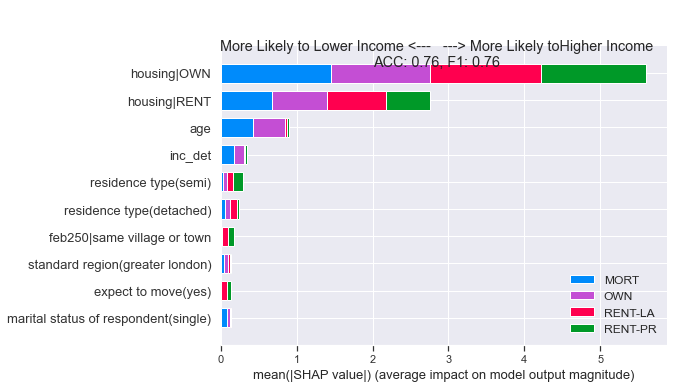

In [274]:
ge = "1974_feb"
harm_vars = ["wt","age","housing_det","harmonised_voted","inc_det","housing"]
target_var = "housing_det"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "housing_det"
min_features = 10
drop_vars = ['feb187','feb188','feb189']

alg = get_xgboost_alg(classification_problem=True)

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=True,alg=alg,multi_class_target=True)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
# use fitted algorithm to predict values
housing_pred = alg.predict(df_pred[train_columns])
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [ ]:
# df_pred.corrwith(f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","housing_det"]=="MORT").sort_values().dropna()

# #  'feb187': 'home owned or rented',
# #  'feb188': 'mode of home ownership',
# #  'feb189': 'mode of home rental',

# residence type

In [273]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","housing_det"].value_counts()

RENT-LA    743
MORT       717
OWN        553
RENT-PR    373
Name: housing_det, dtype: int64

In [275]:
housing_pred[mask]


array(['OWN', 'MORT', 'OWN', 'OWN', 'OWN', 'MORT', 'OWN', 'MORT', 'OWN',
       'OWN', 'OWN', 'OWN', 'OWN', 'MORT', 'OWN', 'OWN', 'MORT', 'MORT',
       'MORT', 'MORT'], dtype=object)

In [121]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","housing"].value_counts()

OWN     1290
RENT    1110
OTH       53
NA         6
DK         3
Name: housing, dtype: int64

In [136]:
housing = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","housing_det"].copy()

In [137]:
mask = housing.isnull() & f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","housing"].apply(lambda x: x in ["NA","OWN","RENT"])
housing.loc[mask] = pd.Series(housing_pred,index=housing.index).loc[mask]
housing = housing.replace("DK",np.nan)
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","housing_det"] = housing

In [277]:
housing.loc[mask] = housing_pred[mask]
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","housing_det"] = housing

In [265]:
housing.value_counts(dropna=False)

RENT-LA    743
MORT       717
OWN        553
RENT-PR    373
NaN         76
Name: housing_det, dtype: int64

In [268]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","housing"][housing.isnull()].value_counts(dropna=False)

OTH    53
OWN    20
DK      3
Name: housing, dtype: int64

In [269]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","housing"][housing.isnull()]

mask = housing.isnull() & (f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","housing"]=="OWN")
# mask.sum()

20

In [271]:
BES_df_list["1974_feb"][mask][["feb187",'feb188','feb189']]

,feb187,feb188,feb189
163,owned,dk,NaN
182,owned,dk,NaN
403,owned,dk,NaN
512,owned,dk,NaN
514,owned,dk,NaN
1015,owned,dk,NaN
1100,owned,dk,NaN
1253,owned,dk,NaN
1408,owned,dk,NaN
1480,owned,dk,NaN


In [278]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","housing_det"].value_counts(dropna=False)

RENT-LA    743
MORT       725
OWN        565
RENT-PR    373
NaN         56
Name: housing_det, dtype: int64

MSE: 78.79, MAE: 6.78, EV: 0.74, R2: 0.74


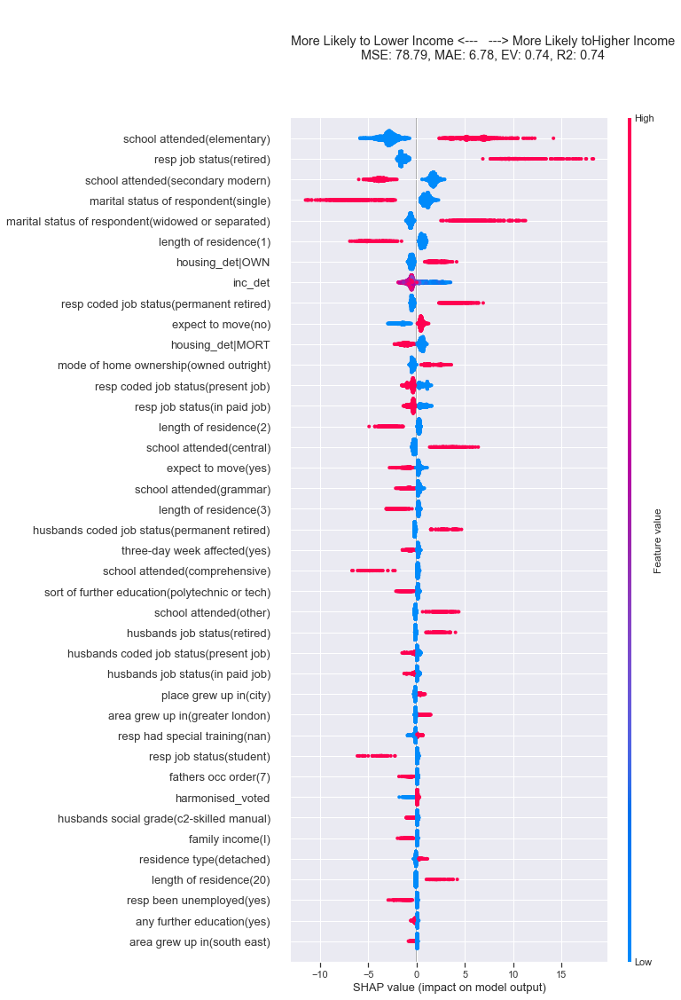

<Figure size 1152x720 with 0 Axes>

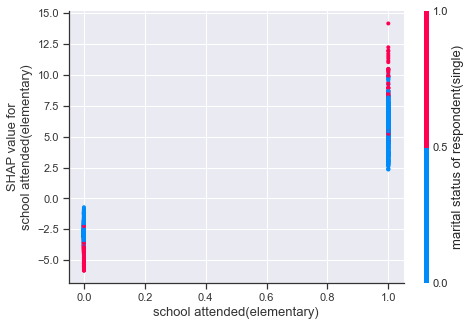

<Figure size 1152x720 with 0 Axes>

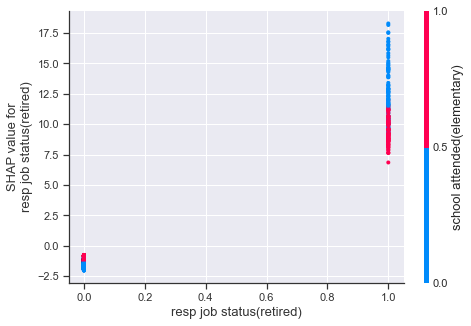

<Figure size 1152x720 with 0 Axes>

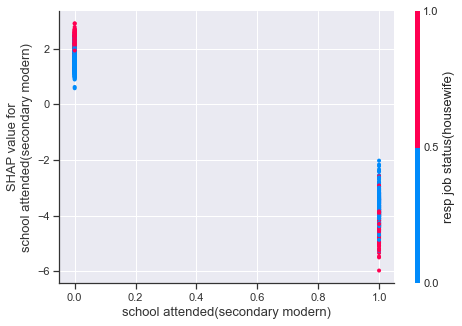

<Figure size 1152x720 with 0 Axes>

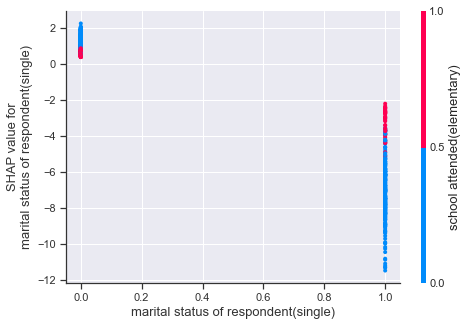

<Figure size 1152x720 with 0 Axes>

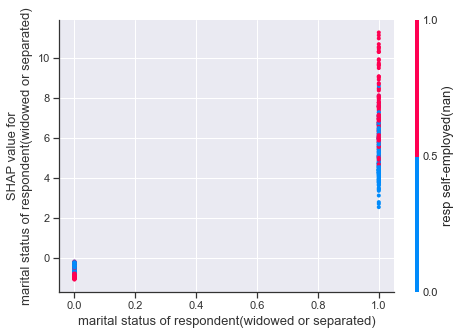

<Figure size 1152x720 with 0 Axes>

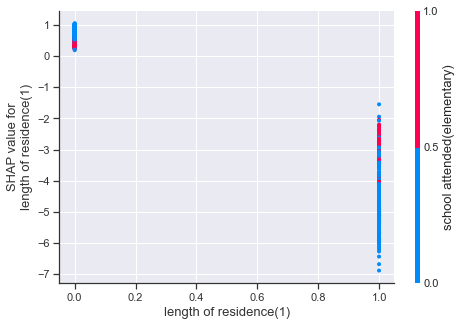

<Figure size 1152x720 with 0 Axes>

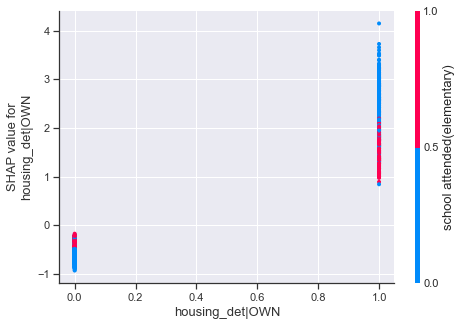

<Figure size 1152x720 with 0 Axes>

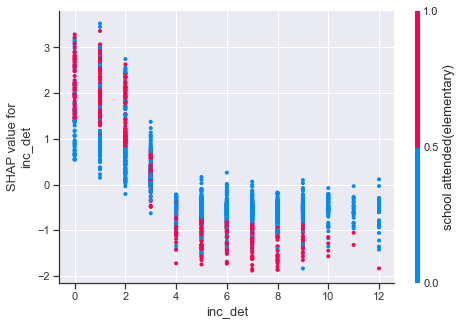

<Figure size 1152x720 with 0 Axes>

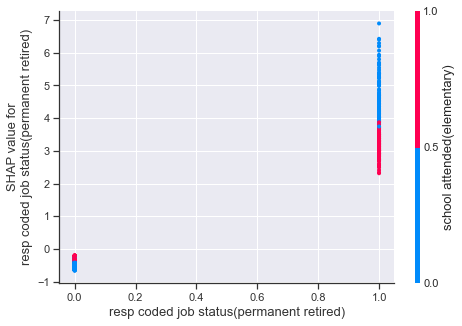

<Figure size 1152x720 with 0 Axes>

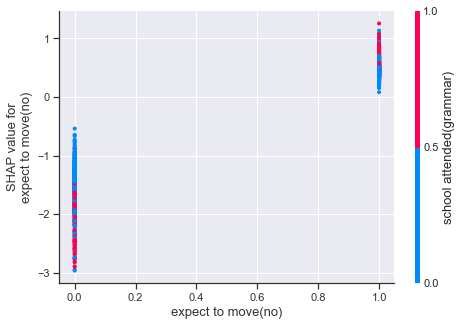

<Figure size 1152x720 with 0 Axes>

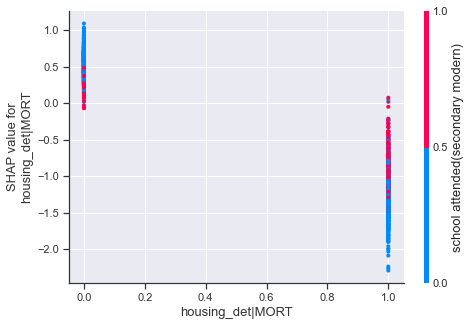

<Figure size 1152x720 with 0 Axes>

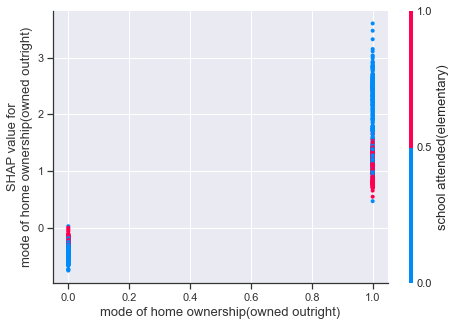

<Figure size 1152x720 with 0 Axes>

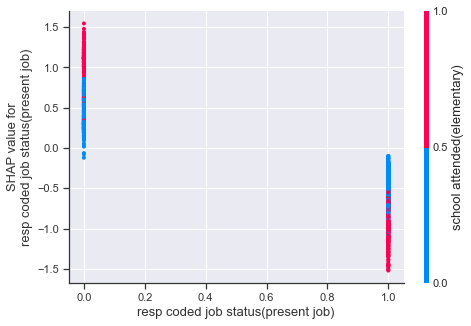

<Figure size 1152x720 with 0 Axes>

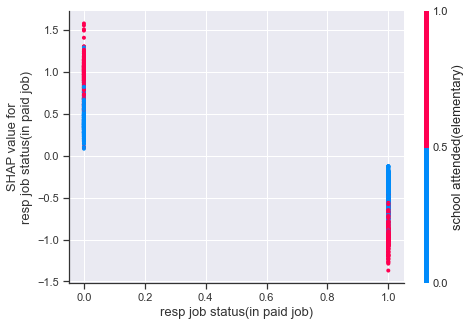

<Figure size 1152x720 with 0 Axes>

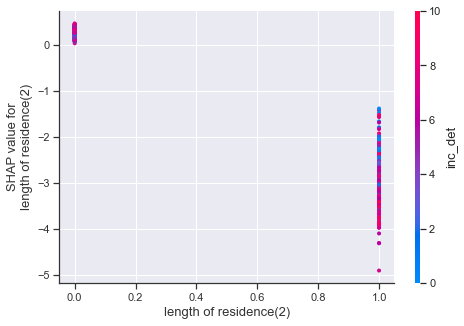

<Figure size 1152x720 with 0 Axes>

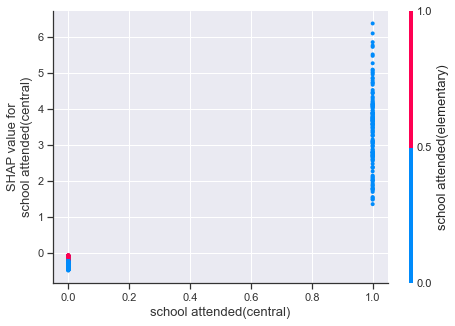

<Figure size 1152x720 with 0 Axes>

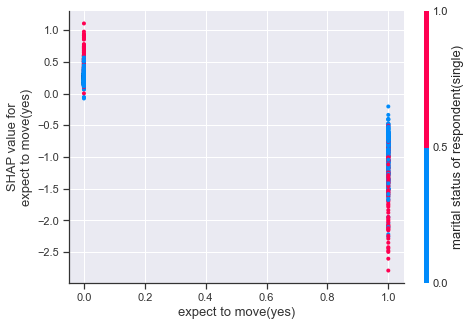

<Figure size 1152x720 with 0 Axes>

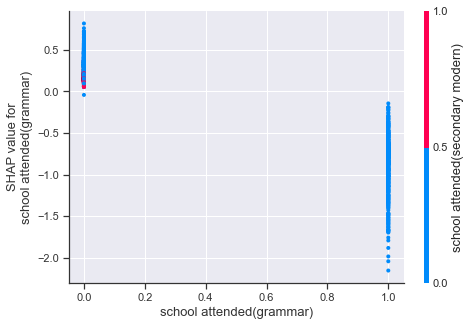

<Figure size 1152x720 with 0 Axes>

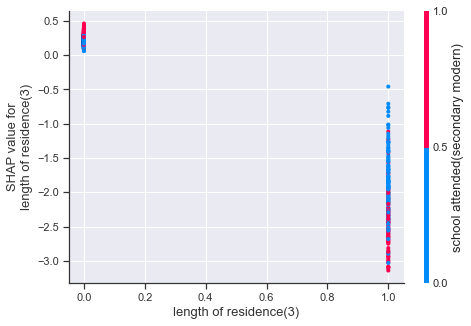

<Figure size 1152x720 with 0 Axes>

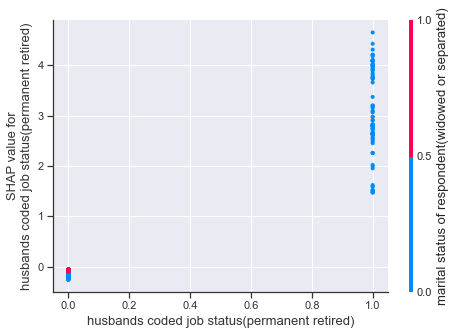

<Figure size 1152x720 with 0 Axes>

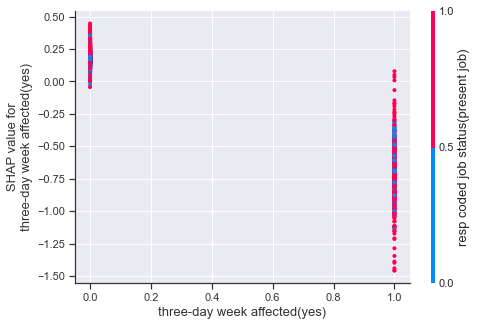

<Figure size 1152x720 with 0 Axes>

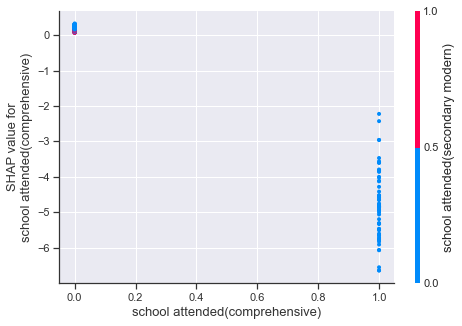

<Figure size 1152x720 with 0 Axes>

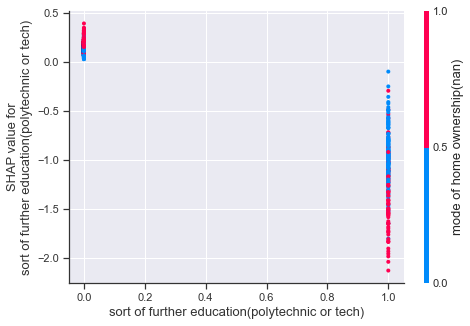

<Figure size 1152x720 with 0 Axes>

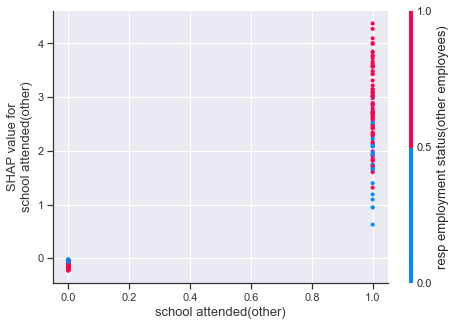

<Figure size 1152x720 with 0 Axes>

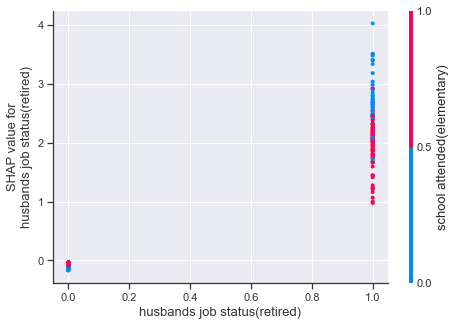

<Figure size 1152x720 with 0 Axes>

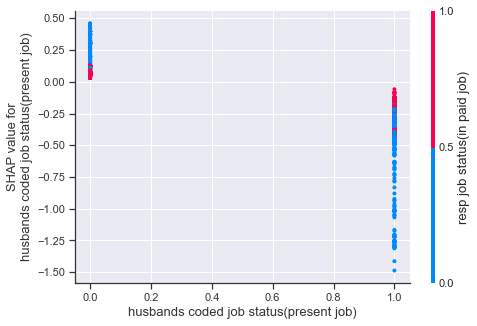

<Figure size 1152x720 with 0 Axes>

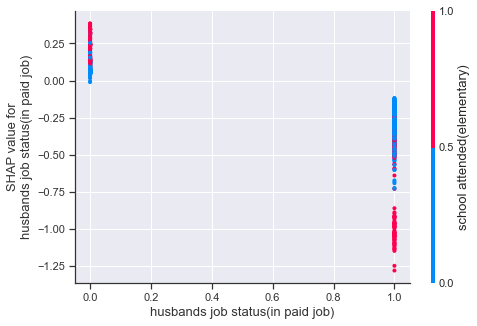

<Figure size 1152x720 with 0 Axes>

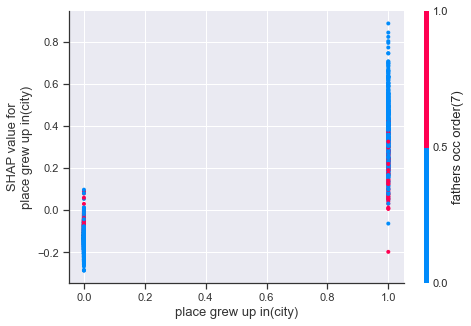

<Figure size 1152x720 with 0 Axes>

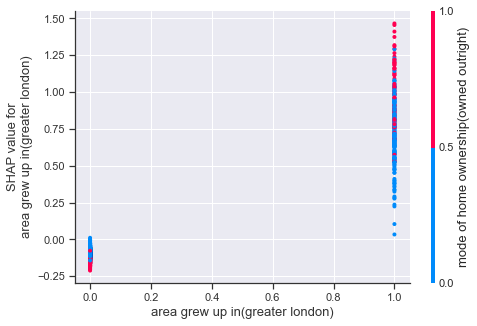

<Figure size 1152x720 with 0 Axes>

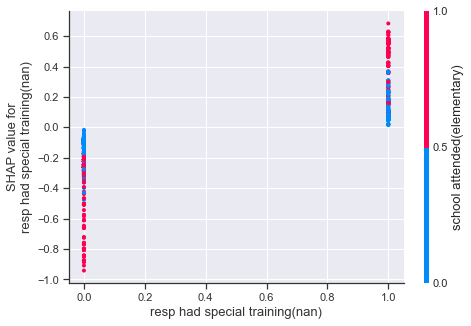

<Figure size 1152x720 with 0 Axes>

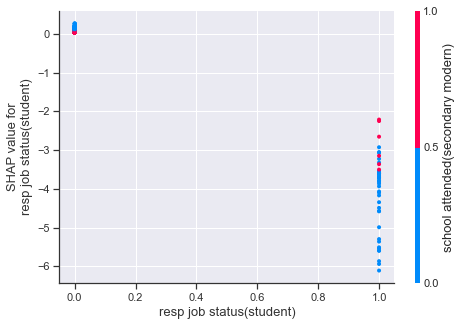

<Figure size 1152x720 with 0 Axes>

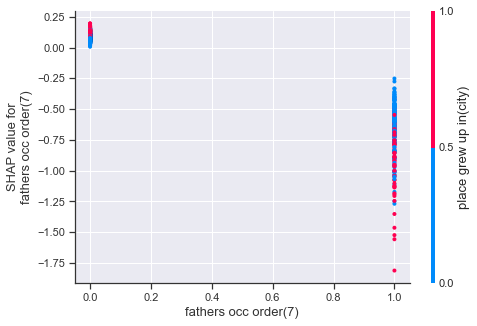

<Figure size 1152x720 with 0 Axes>

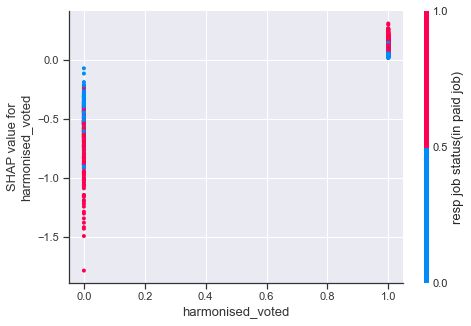

<Figure size 1152x720 with 0 Axes>

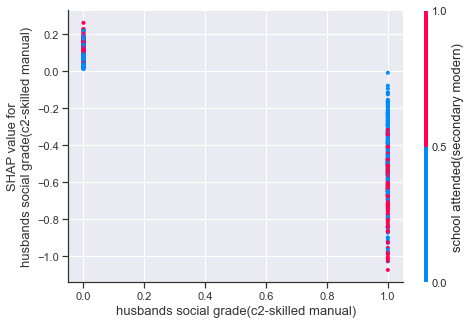

<Figure size 1152x720 with 0 Axes>

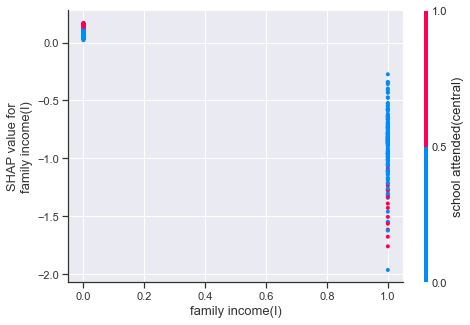

<Figure size 1152x720 with 0 Axes>

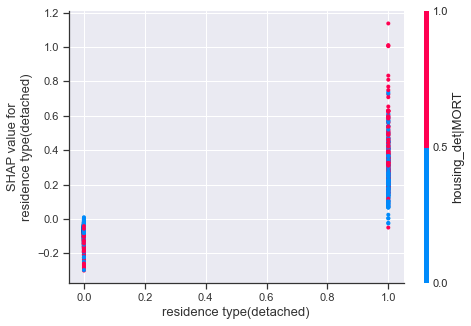

<Figure size 1152x720 with 0 Axes>

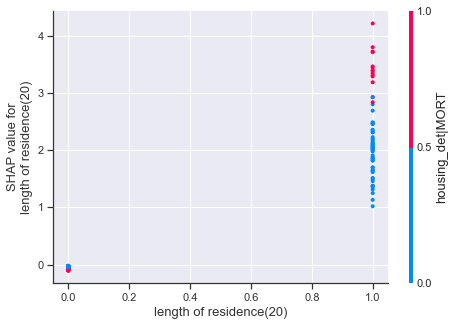

<Figure size 1152x720 with 0 Axes>

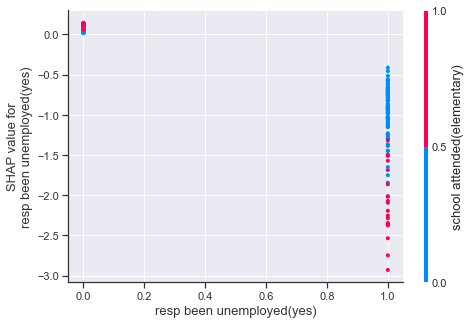

<Figure size 1152x720 with 0 Axes>

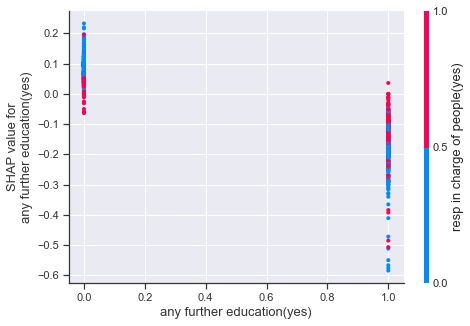

<Figure size 1152x720 with 0 Axes>

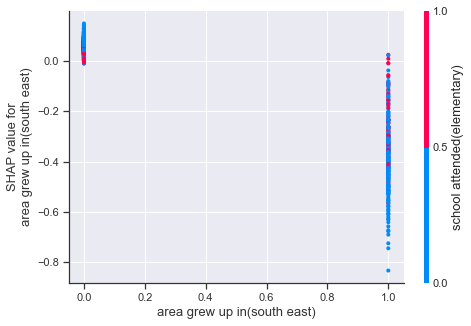

In [144]:
ge = "1974_feb"
harm_vars = ["wt","age","housing_det","harmonised_voted","inc_det"]
target_var = "age"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "age"
min_features = 10
drop_vars = ["feb191"]

alg = get_xgboost_alg(classification_problem=False)

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True,alg=alg)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
# use fitted algorithm to predict values
age_pred = alg.predict(df_pred[train_columns])
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [145]:
# df_pred.corrwith(f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","age"]).sort_values().dropna()

In [154]:
age_pred = pd.Series(age_pred,index = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","age"].index).round()

In [156]:
age = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","age"]
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","age"].loc[age.isnull()] = age_pred[age.isnull()]

In [161]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","age"].isnull().sum()

22

In [160]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","age"].loc[age.isnull()] = age_pred[age.isnull()]

In [169]:
age[age.isnull()] = age_pred[age.isnull()]
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","age"] = age

In [171]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","age"].isnull().sum()

0

In [ ]:
### 

In [175]:
f2f_1974_feb["vote"].value_counts(dropna=False)

LAB    841
CON    787
LIB    395
DNV    298
DK      94
SNP     38
PC       6
OTH      3
Name: vote, dtype: int64

In [176]:
f2f_1974_feb["vote_simple"].value_counts(dropna=False)

LAB    841
CON    787
LD     395
DNV    298
DK      94
SNP     38
PC       6
NaN      3
Name: vote_simple, dtype: int64

In [177]:
f2f_1974_feb[ f2f_1974_feb["vote_simple"]=="DK" ]

,dataset,uid,housing_det,housing,inc,vote,year,wt,age,vote_simple,bloc,birth_year,harmonised_voted,inc_det,vote_complete,vote_complete_simple,bloc_complete,turnout_complete
3,1974_feb,1974_feb|3,RENT-LA,RENT,lowest 3rd,DK,1974,1.0,87.0,DK,Neither,1887.0,1.0,NaN,NaN,NaN,NaN,NaN
58,1974_feb,1974_feb|58,RENT-LA,RENT,NaN,DK,1974,1.0,55.0,DK,Neither,1919.0,1.0,NaN,NaN,NaN,NaN,NaN
112,1974_feb,1974_feb|112,RENT-LA,RENT,NaN,DK,1974,1.0,72.0,DK,Neither,1902.0,1.0,NaN,NaN,NaN,NaN,NaN
128,1974_feb,1974_feb|128,RENT-LA,RENT,lowest 3rd,DK,1974,1.0,28.0,DK,Neither,1946.0,1.0,NaN,NaN,NaN,NaN,NaN
146,1974_feb,1974_feb|146,OWN,OWN,NaN,DK,1974,1.0,60.0,DK,Neither,1914.0,1.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2400,1974_feb,1974_feb|2400,MORT,OWN,upper 3rd,DK,1974,1.0,39.0,DK,Neither,1935.0,1.0,NaN,NaN,NaN,NaN,NaN
2417,1974_feb,1974_feb|2417,RENT-LA,RENT,middle 3rd,DK,1974,1.0,20.0,DK,Neither,1954.0,1.0,NaN,NaN,NaN,NaN,NaN
2425,1974_feb,1974_feb|2425,RENT-PR,RENT,upper 3rd,DK,1974,1.0,26.0,DK,Neither,1948.0,1.0,NaN,NaN,NaN,NaN,NaN
2427,1974_feb,1974_feb|2427,RENT-LA,RENT,lowest 3rd,DK,1974,1.0,80.0,DK,Neither,1894.0,1.0,NaN,NaN,NaN,NaN,NaN


In [ ]:
## fill in the blanks on the DKs

In [182]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","vote_complete"]=f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","vote"].replace("DK",np.nan)

ACC: 0.96,  F1: 0.96


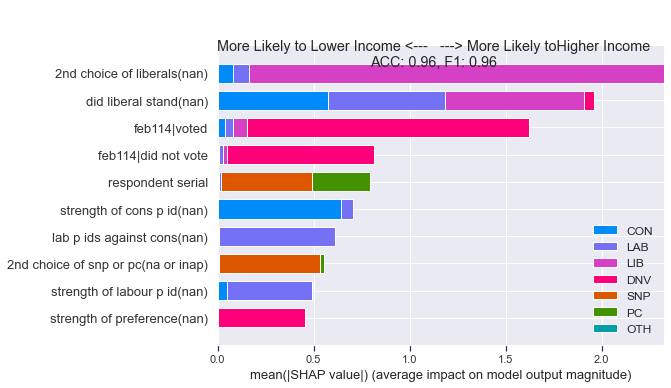

In [238]:
ge = "1974_feb"
harm_vars = ["wt","age","housing_det","vote_complete","inc_det","housing"]
target_var = "vote_complete"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "vote_complete"
min_features = 10
drop_vars = ['feb115','feb122']
## vital to drop feb122!!!

drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<.5].index)
drop_vars.remove("vote_complete")
drop_vars.remove("wt")

alg = get_xgboost_alg(classification_problem=True)

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=False,alg=alg,multi_class_target=True)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
# use fitted algorithm to predict values
vote_pred = alg.predict(df_pred[train_columns])
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

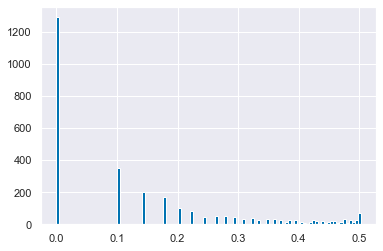

In [210]:
stds = df_pred[vote_complete.isnull()].std()
stds[stds<1].hist(bins=100)


In [195]:
# %debug

In [244]:
{k:v for k,v in BES_label_list["1974_feb"].items() if 'labour party' in v.lower()}

{'feb032': 'blame prices on labour party',
 'feb042': 'miners strike blame labour party'}

In [241]:
pd.Series(vote_pred).value_counts()

LAB    889
CON    822
LIB    405
DNV    301
SNP     40
PC       5
dtype: int64

In [242]:
pd.Series(vote_pred)[vote_complete.isnull()].value_counts()

LAB    45
CON    31
LIB    11
DNV     3
SNP     3
PC      1
dtype: int64

In [264]:
temp = BES_df_list["1974_feb"][['feb114','feb115','feb118','feb120','feb125','feb126','feb111','feb140']][vote_complete.isnull()].copy()
temp["prediction"] = vote_pred[vote_complete.isnull()]
# temp.head(50)

In [ ]:
# acc/f1 = .5

In [246]:
vote_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","vote_complete"]
pd.Series(vote_pred[vote_complete.isnull()]).value_counts()
vote_complete.loc[vote_complete.isnull()] = vote_pred[vote_complete.isnull()]
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","vote_complete"] = vote_complete

In [248]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","vote_complete"].value_counts(dropna=False)

LAB    886
CON    818
LIB    406
DNV    301
SNP     41
PC       7
OTH      3
Name: vote_complete, dtype: int64

In [254]:
vote_simple = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","vote_complete"].replace(simple_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","vote_complete_simple"] = vote_simple
vote_simple.value_counts(dropna=False)

LAB    886
CON    818
LD     406
DNV    301
SNP     41
PC       7
DK       3
Name: vote_complete, dtype: int64

In [257]:
bloc_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","vote_complete_simple"].replace(bloc_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","bloc_complete"] = bloc_complete
bloc_complete.value_counts()

Left-Lib      1340
Right-Auth     818
Neither        301
Name: vote_complete_simple, dtype: int64

In [261]:
turnout_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","vote_complete"].replace(turnout_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","turnout_complete"] = turnout_complete
turnout_complete.value_counts(dropna=False)

VOTED    2161
DNV       301
Name: vote_complete, dtype: int64

In [280]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb"].isnull().sum()

dataset                   0
uid                       0
housing_det              56
housing                   0
inc                     409
vote                      0
year                      0
wt                        0
age                       0
vote_simple               3
bloc                      0
birth_year               22
harmonised_voted          0
inc_det                   0
vote_complete             0
vote_complete_simple      0
bloc_complete             3
turnout_complete          0
dtype: int64

In [263]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_feb","housing_det"].value_counts(dropna=False)

RENT-LA    743
MORT       717
OWN        553
RENT-PR    373
NaN         76
Name: housing_det, dtype: int64

In [281]:
f2f_harmonised.to_pickle("E:\\BES_analysis_data\\Face_to_face\\f2f_harmonised.zip", compression='zip')

In [ ]:
## 

In [284]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_oct"].isnull().sum()

# age (10) DONE
# housing_det 18 DKs (of which 16 we know OWN/RENT) DONE
# vote (63DKs) DONE
# inc - whole bunch of missing values 

dataset                    0
uid                        0
housing_det                0
housing                    0
inc                      348
vote                       0
year                       0
wt                         0
age                       10
vote_simple                7
bloc                       0
birth_year                10
harmonised_voted           0
inc_det                 2365
vote_complete           2365
vote_complete_simple    2365
bloc_complete           2365
turnout_complete        2365
dtype: int64

In [286]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_oct","housing_det"].value_counts()

MORT       716
RENT-LA    697
OWN        532
RENT-PR    386
DK          18
NA          16
Name: housing_det, dtype: int64

In [287]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_oct","housing"].value_counts()

OWN     1262
RENT    1085
NA        16
DK         2
Name: housing, dtype: int64

In [ ]:
### age: 1974_oct

In [291]:
age = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_oct","age"].copy()

MSE: 83.11, MAE: 7.11, EV: 0.73, R2: 0.73


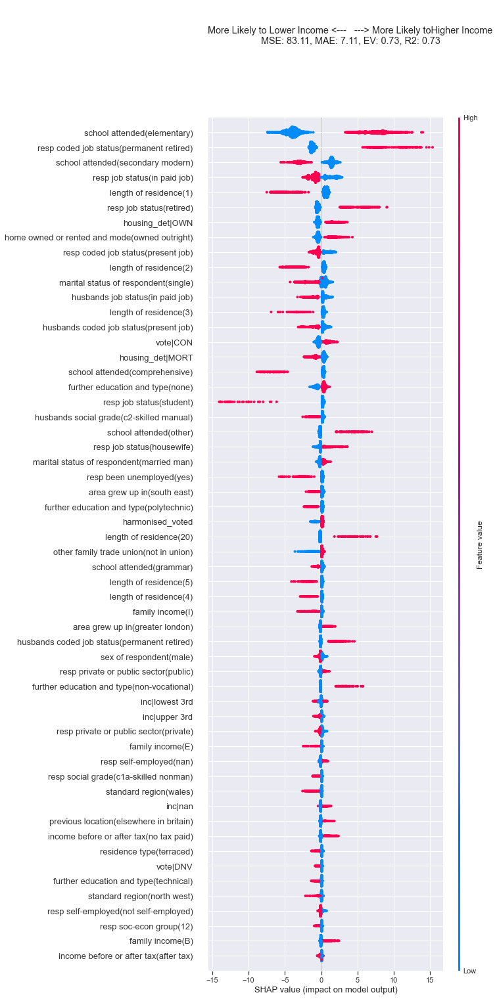

<Figure size 1152x720 with 0 Axes>

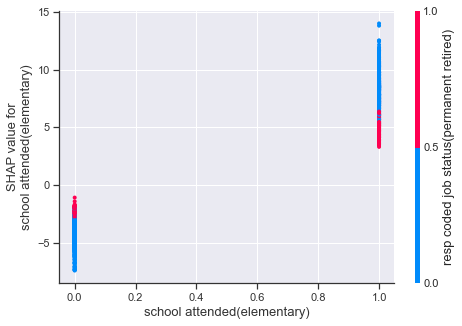

<Figure size 1152x720 with 0 Axes>

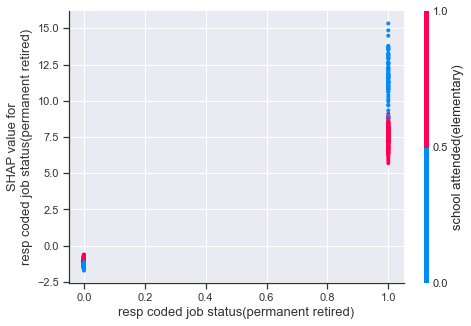

<Figure size 1152x720 with 0 Axes>

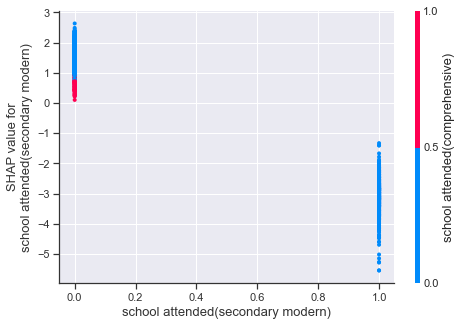

<Figure size 1152x720 with 0 Axes>

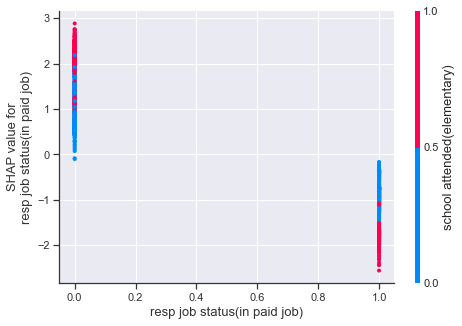

<Figure size 1152x720 with 0 Axes>

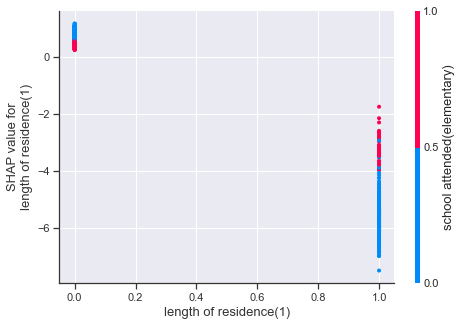

<Figure size 1152x720 with 0 Axes>

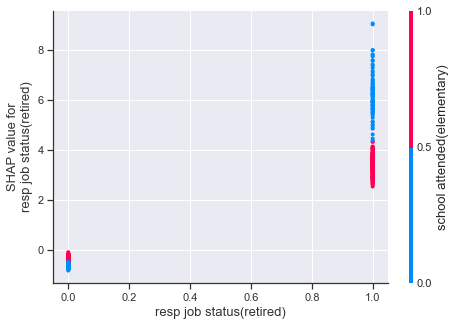

<Figure size 1152x720 with 0 Axes>

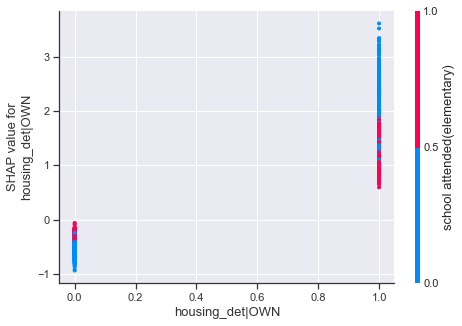

<Figure size 1152x720 with 0 Axes>

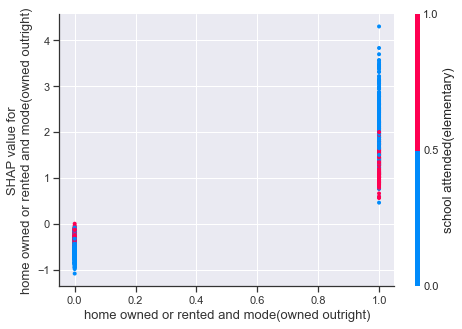

<Figure size 1152x720 with 0 Axes>

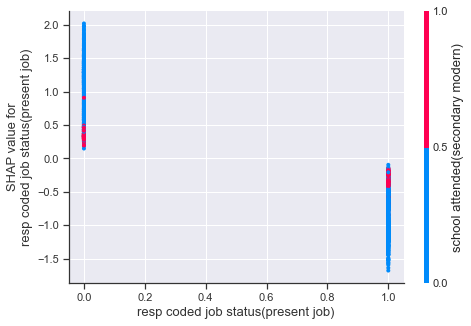

<Figure size 1152x720 with 0 Axes>

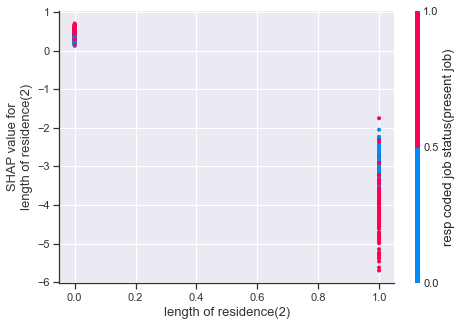

<Figure size 1152x720 with 0 Axes>

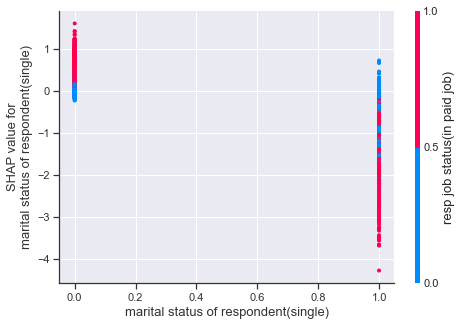

<Figure size 1152x720 with 0 Axes>

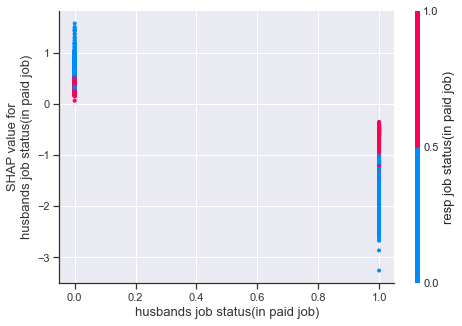

<Figure size 1152x720 with 0 Axes>

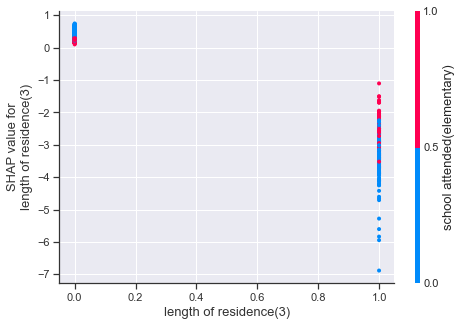

<Figure size 1152x720 with 0 Axes>

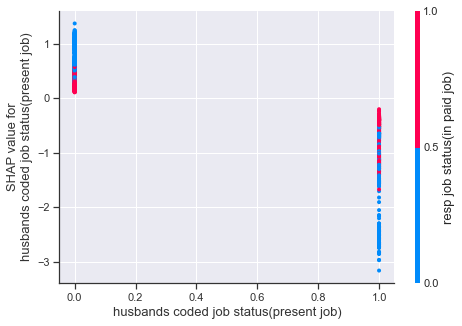

<Figure size 1152x720 with 0 Axes>

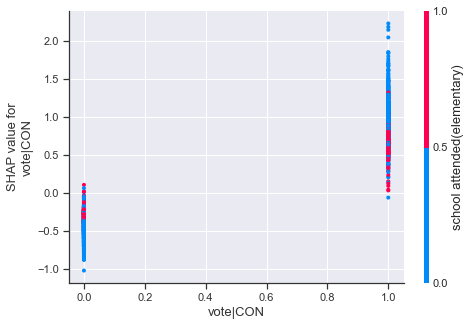

<Figure size 1152x720 with 0 Axes>

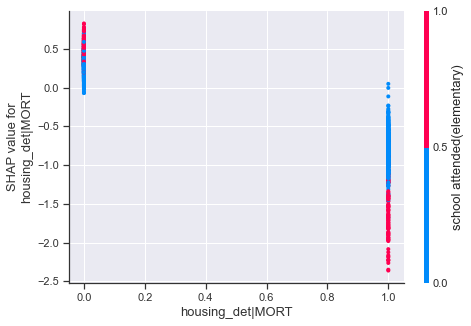

<Figure size 1152x720 with 0 Axes>

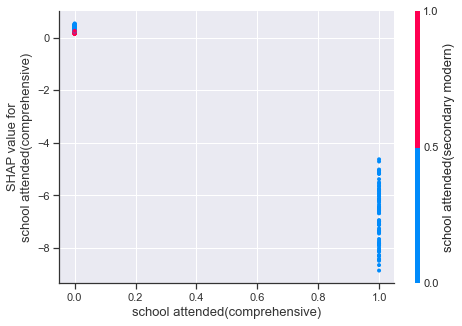

<Figure size 1152x720 with 0 Axes>

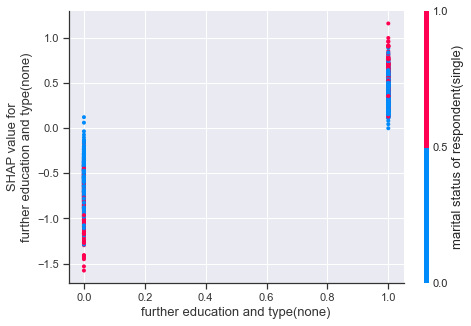

<Figure size 1152x720 with 0 Axes>

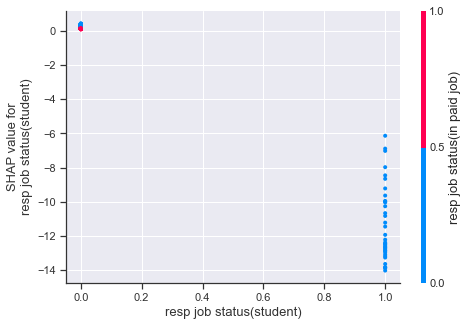

<Figure size 1152x720 with 0 Axes>

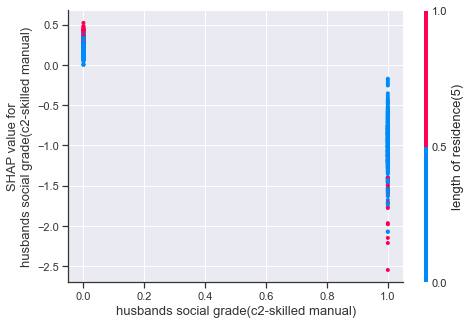

<Figure size 1152x720 with 0 Axes>

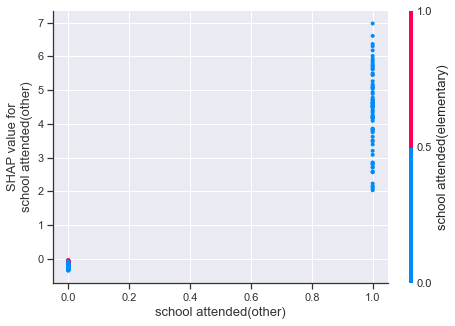

<Figure size 1152x720 with 0 Axes>

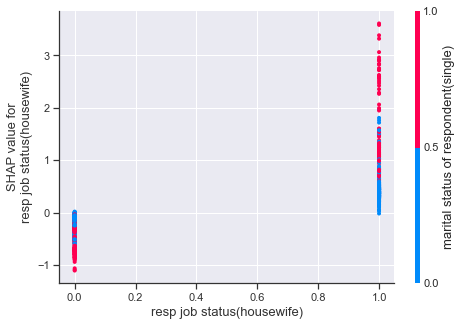

<Figure size 1152x720 with 0 Axes>

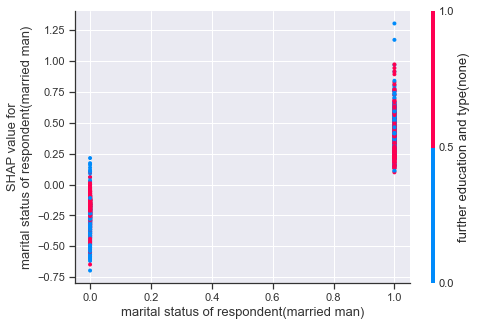

<Figure size 1152x720 with 0 Axes>

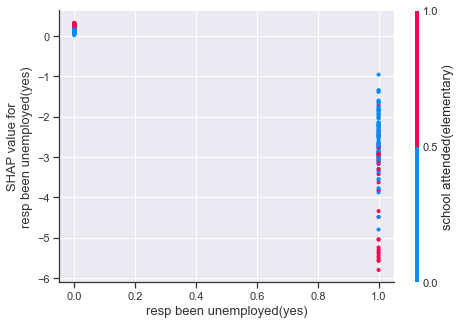

<Figure size 1152x720 with 0 Axes>

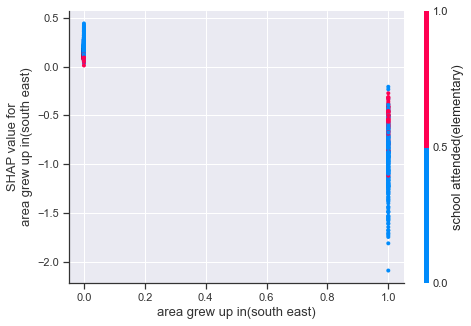

<Figure size 1152x720 with 0 Axes>

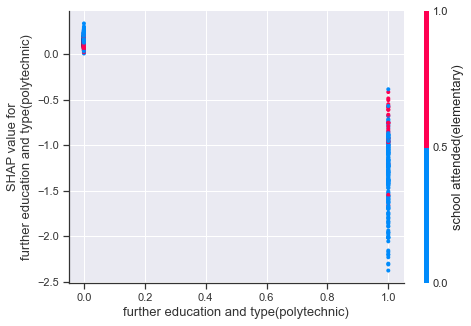

<Figure size 1152x720 with 0 Axes>

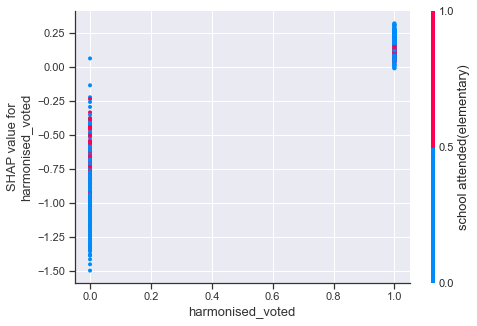

<Figure size 1152x720 with 0 Axes>

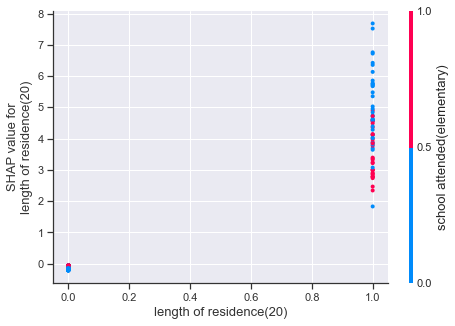

<Figure size 1152x720 with 0 Axes>

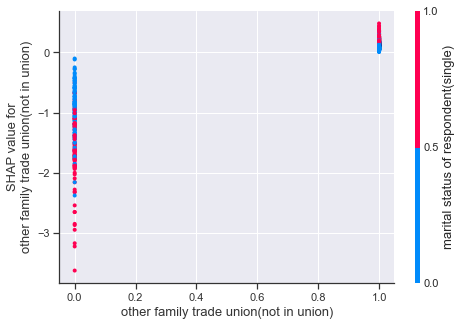

<Figure size 1152x720 with 0 Axes>

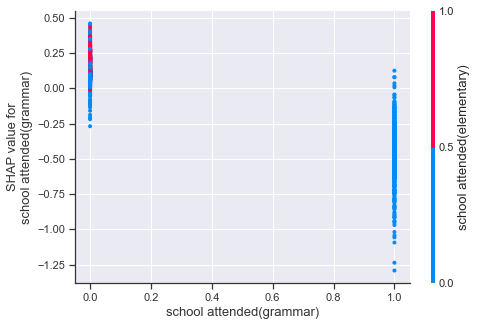

<Figure size 1152x720 with 0 Axes>

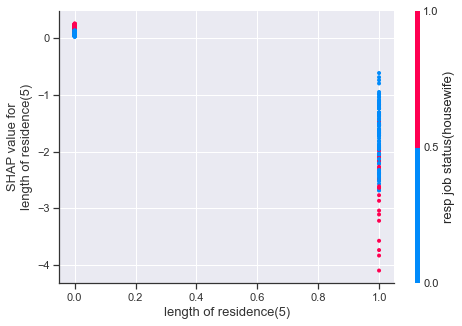

<Figure size 1152x720 with 0 Axes>

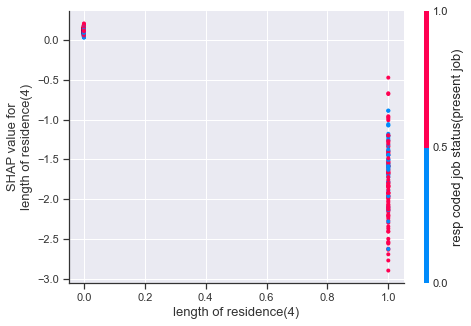

<Figure size 1152x720 with 0 Axes>

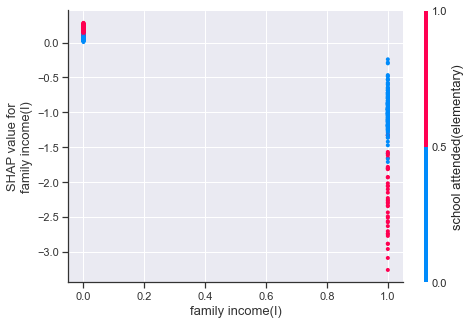

<Figure size 1152x720 with 0 Axes>

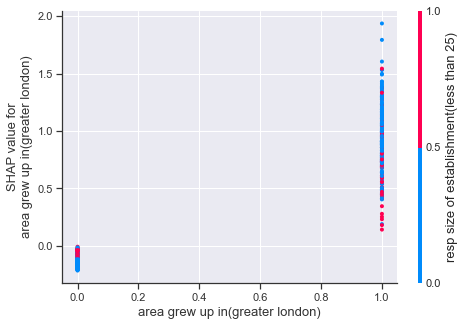

<Figure size 1152x720 with 0 Axes>

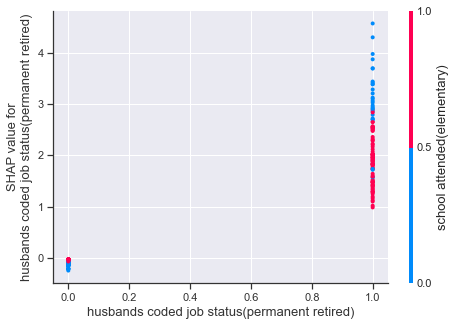

<Figure size 1152x720 with 0 Axes>

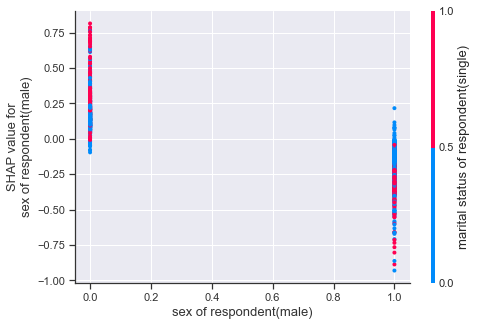

<Figure size 1152x720 with 0 Axes>

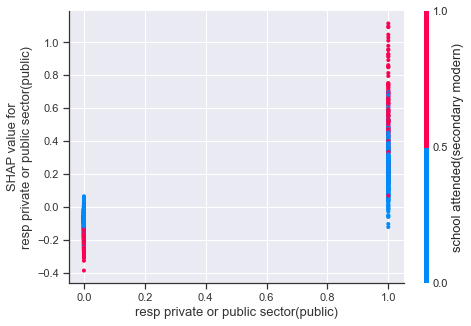

<Figure size 1152x720 with 0 Axes>

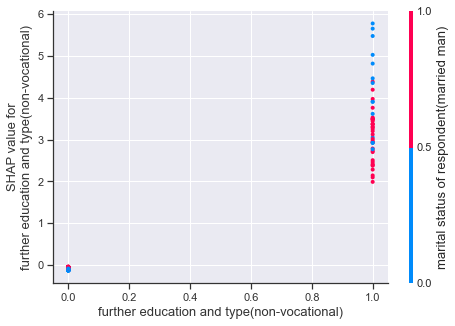

<Figure size 1152x720 with 0 Axes>

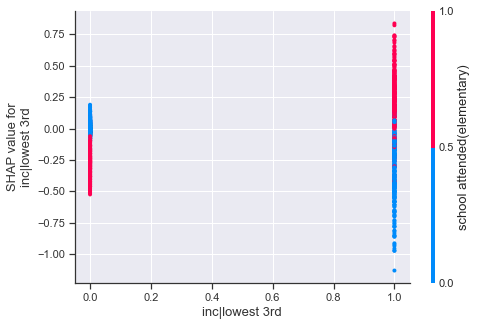

<Figure size 1152x720 with 0 Axes>

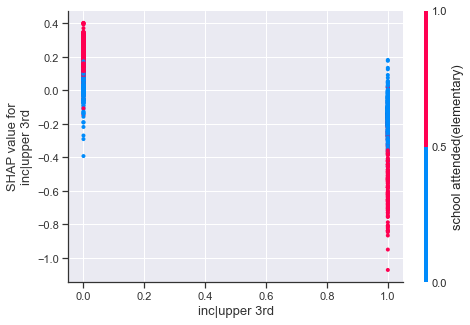

<Figure size 1152x720 with 0 Axes>

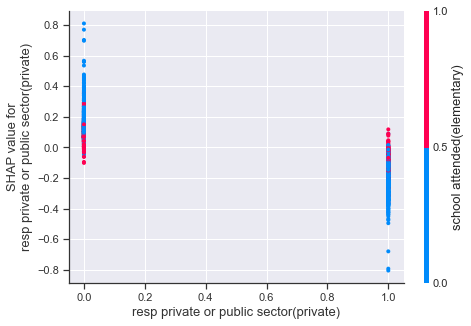

<Figure size 1152x720 with 0 Axes>

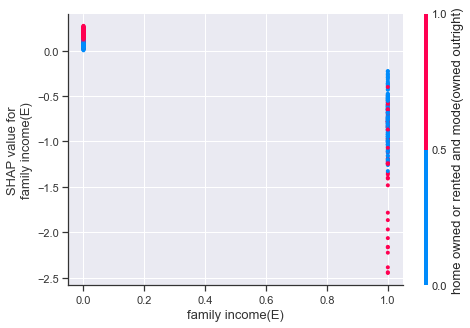

<Figure size 1152x720 with 0 Axes>

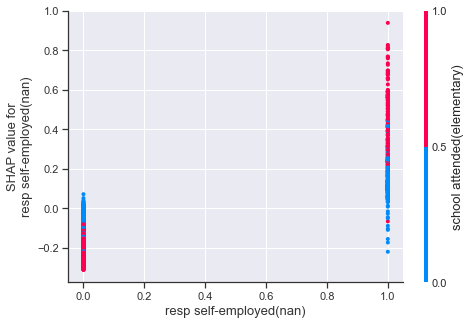

<Figure size 1152x720 with 0 Axes>

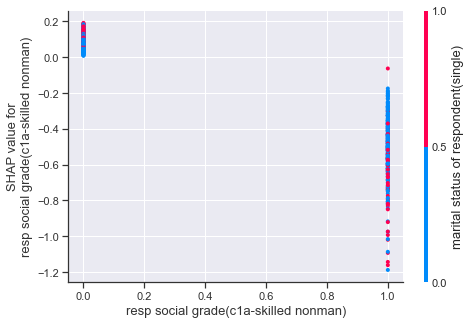

<Figure size 1152x720 with 0 Axes>

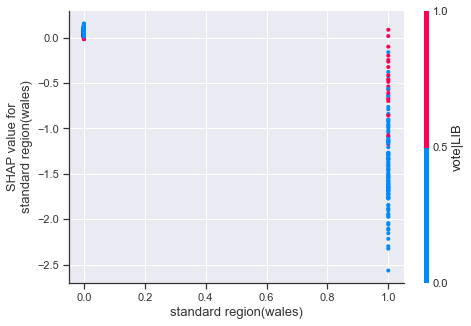

<Figure size 1152x720 with 0 Axes>

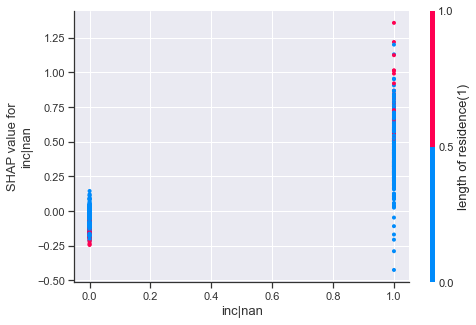

<Figure size 1152x720 with 0 Axes>

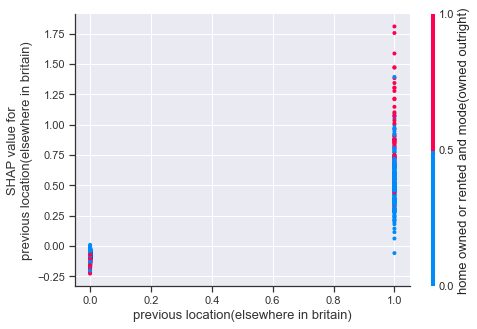

<Figure size 1152x720 with 0 Axes>

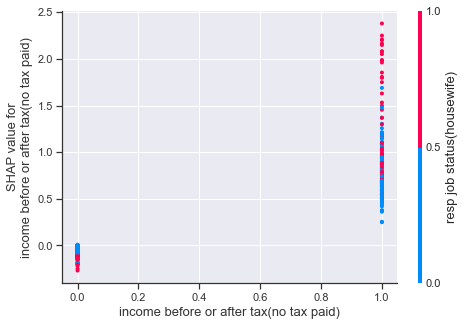

<Figure size 1152x720 with 0 Axes>

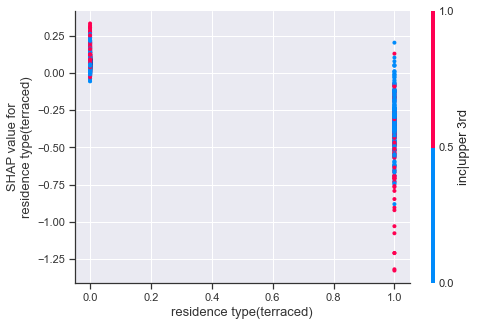

<Figure size 1152x720 with 0 Axes>

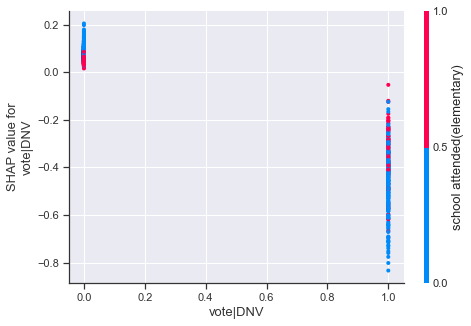

<Figure size 1152x720 with 0 Axes>

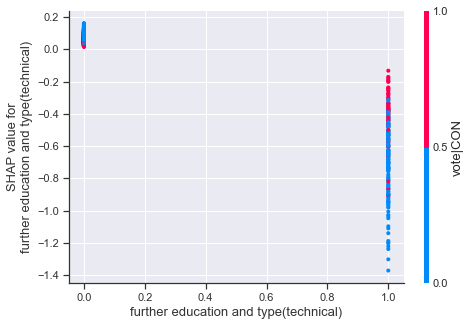

<Figure size 1152x720 with 0 Axes>

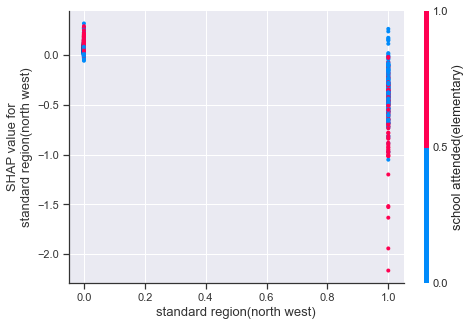

<Figure size 1152x720 with 0 Axes>

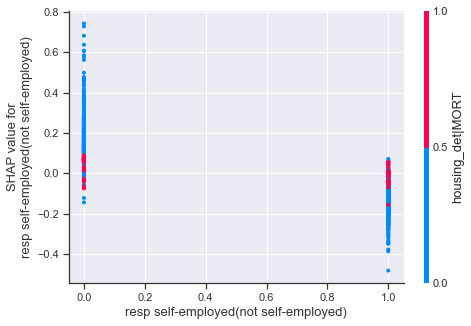

<Figure size 1152x720 with 0 Axes>

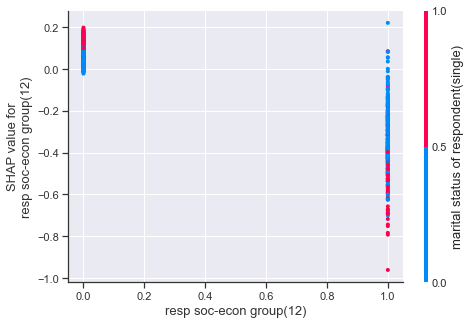

<Figure size 1152x720 with 0 Axes>

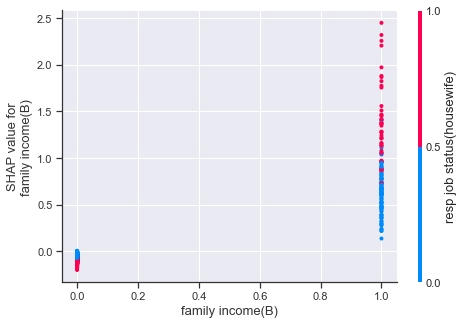

<Figure size 1152x720 with 0 Axes>

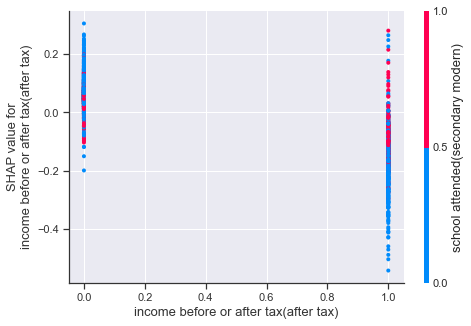

In [304]:
ge = "1974_oct"
harm_vars = ["wt","age","housing_det","harmonised_voted","inc","vote"]
target_var = "age"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "age"
min_features = 10
drop_vars = ["oct191"]
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds==0].index)
drop_vars.remove("wt")
drop_vars.remove("age")

alg = get_xgboost_alg(classification_problem=False)

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True,alg=alg)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
# use fitted algorithm to predict values
age_pred = alg.predict(df_pred[train_columns])
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [301]:
stds = df_pred[age.isnull()].std()

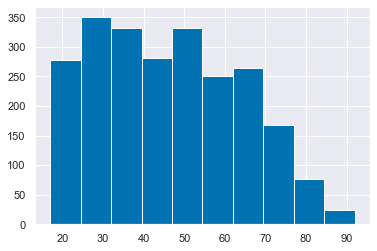

In [305]:
age.hist()

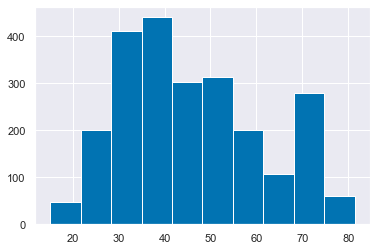

In [307]:
pd.Series(age_pred).hist()

In [313]:
age_pred = pd.Series(age_pred,index=age.index).round()
age.loc[age.isnull()] = age_pred.loc[age.isnull()]
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_oct","age"] = age

In [ ]:
### housing vars

In [316]:
housing = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_oct","housing_det"].copy()

In [317]:
housing.value_counts()

# accept that NA is some special situation and ignore that, but try to impute the DKs

mask = housing=="DK"

MORT       716
RENT-LA    697
OWN        532
RENT-PR    386
DK          18
NA          16
Name: housing_det, dtype: int64

In [319]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_oct","housing_det"] = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_oct","housing_det"].replace("DK",np.nan).replace("NA",np.nan)

In [323]:
housing.value_counts(dropna=False)

MORT       716
RENT-LA    697
OWN        532
RENT-PR    386
DK          18
NA          16
Name: housing_det, dtype: int64

In [327]:
# (housing=="DK").sum()

In [326]:
mask = housing=="DK"
mask.sum()

18

ACC: 0.75,  F1: 0.75


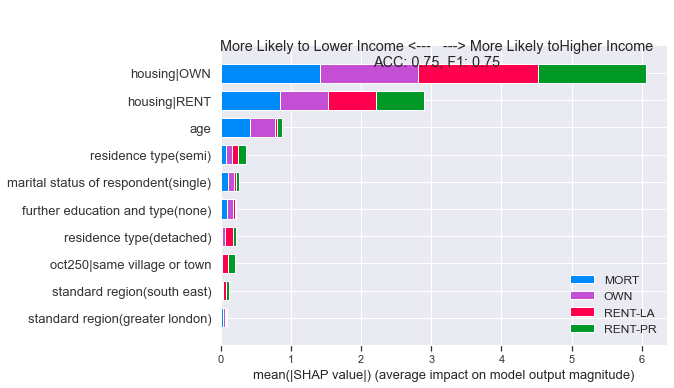

In [328]:
ge = "1974_oct"
harm_vars = ["wt","age","housing_det","harmonised_voted","inc_det","housing"]
target_var = "housing_det"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "housing_det"
min_features = 10
drop_vars = ['oct187a']

alg = get_xgboost_alg(classification_problem=True)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds==0].index)
drop_vars.remove("wt")
drop_vars.remove(var_stub)

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=True,alg=alg,multi_class_target=True)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
# use fitted algorithm to predict values
housing_pred = alg.predict(df_pred[train_columns])
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [333]:
housing.loc[mask] = housing_pred[mask]

In [337]:
# f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_oct","housing"][mask]

## looks good!

f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_oct","housing_det"] = housing.replace("NA",np.nan)

In [338]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_oct","housing_det"].value_counts(dropna=False)

MORT       725
RENT-LA    700
OWN        537
RENT-PR    387
NaN         16
Name: housing_det, dtype: int64

In [ ]:
## votes - replace DKs

In [340]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_oct","vote"].value_counts()

LAB    830
CON    704
LIB    352
DNV    347
DK      63
SNP     56
OTH      7
PC       6
Name: vote, dtype: int64

In [342]:
vote_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_oct","vote"].copy()
mask = (vote_complete=="DK")
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_oct","vote_complete"] = vote_complete.replace("DK",np.nan)

ACC: 0.93,  F1: 0.93


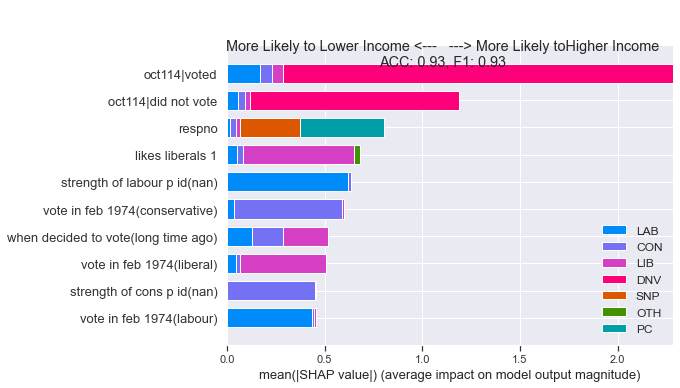

In [391]:
ge = "1974_oct"
harm_vars = ["wt","age","housing_det","vote_complete","inc"]
target_var = "vote_complete"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "vote_complete"
min_features = 10
drop_vars = ['oct115','oct112', # basic vote vars
             'oct115a','oct115b','oct115c', # vars for 'if you voted con/lab'
             'oct119','oct119a','oct119b','oct119c','oct119d'] # same for 'voted for libs'


alg = get_xgboost_alg(classification_problem=True)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<.25].index)
drop_vars.remove("wt")
drop_vars.remove(var_stub)

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=False,alg=alg,multi_class_target=True)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
# use fitted algorithm to predict values
vote_pred = alg.predict(df_pred[train_columns])
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

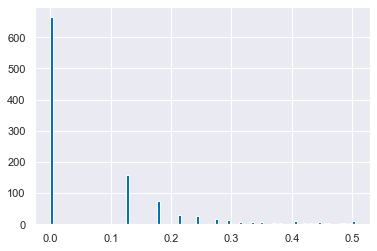

In [390]:
stds[stds<1].hist(bins=100)


In [392]:
pd.Series(vote_pred,index=vote_complete.index)[mask].value_counts()

CON    26
LAB    16
LIB    12
DNV     8
PC      1
dtype: int64

In [376]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_oct","vote_complete"].value_counts()

LAB    830
CON    704
LIB    352
DNV    347
SNP     56
OTH      7
PC       6
Name: vote_complete, dtype: int64

In [393]:
temp = BES_df_list["1974_oct"][['oct124a','oct125','oct111','oct112','oct140','oct141']]
temp.columns = [BES_label_list["1974_oct"][x] for x in  temp.columns]
temp["pred"] = vote_pred
temp[mask].head(50)

,vote in feb 1974,vote in 1970,trust conservatives,trust labour,conservative mark out of ten,labour mark out of ten,pred
68,did not vote,labour,some of the time,some of the time,5,8,CON
101,conservative,cant remember,usually,usually,6,6,CON
149,cant remember,cant remember,some of the time,some of the time,5,7,LAB
182,cant remember,cant remember,some of the time,usually,3,8,LAB
202,cant remember,cant remember,some of the time,some of the time,6,7,LIB
246,cant remember,cant remember,usually,usually,6,8,LAB
254,conservative,conservative,NaN,NaN,NaN,NaN,DNV
258,cant remember,cant remember,some of the time,some of the time,7,7,CON
260,cant remember,cant remember,some of the time,some of the time,5,5,LIB
300,cant remember,conservative,some of the time,some of the time,5,6,LAB


In [383]:
{k:v for k,v in BES_label_list["1974_oct"].items() if "libs thought of" in v}

{'oct119d': 'libs thought of other party.'}

In [394]:
# BES_df_list["1974_oct"]["oct508"].value_counts()

In [397]:
vote_complete = vote_complete.replace("DK",np.nan)
vote_complete.loc[vote_complete.isnull()] = pd.Series(vote_pred,index=vote_complete.index).loc[vote_complete.isnull()]

f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_oct","vote_complete"] = vote_complete

In [398]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_oct","vote_complete"].value_counts(dropna=False)

LAB    846
CON    730
LIB    364
DNV    355
SNP     56
PC       7
OTH      7
Name: vote_complete, dtype: int64

In [ ]:
## inc

In [412]:
# BES_df_list["1974_oct"]["oct212"].value_counts()
inc = BES_df_list["1974_oct"]["oct212"].replace("7",np.nan).replace("8",np.nan).astype('category').cat.codes.replace(-1,np.nan)
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_oct","inc_det"] = inc
mask = inc.isnull()

In [411]:
# f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_oct","inc_det"].index,inc.index

MSE: 3.60, MAE: 1.41, EV: 0.61, R2: 0.61


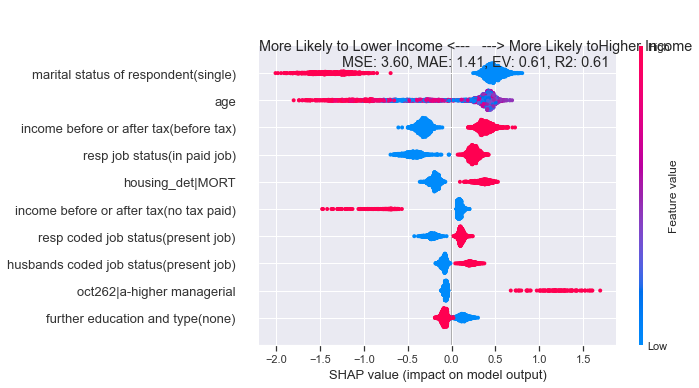

<Figure size 1152x720 with 0 Axes>

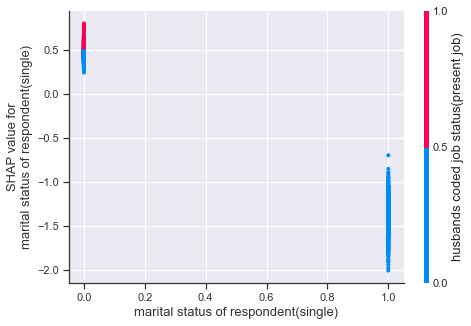

<Figure size 1152x720 with 0 Axes>

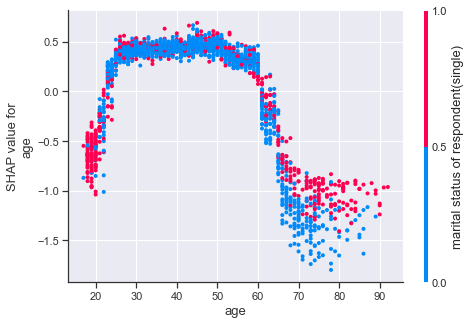

<Figure size 1152x720 with 0 Axes>

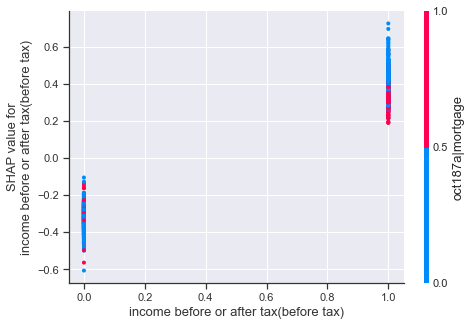

<Figure size 1152x720 with 0 Axes>

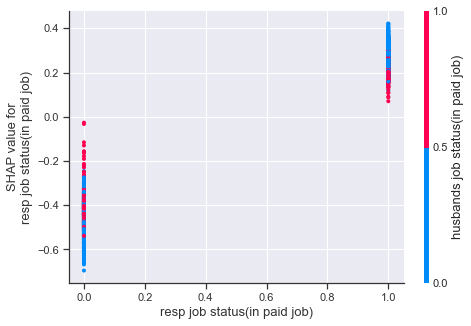

<Figure size 1152x720 with 0 Axes>

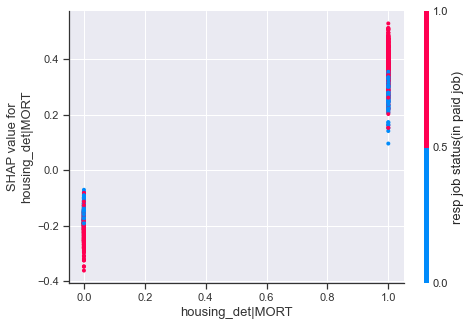

<Figure size 1152x720 with 0 Axes>

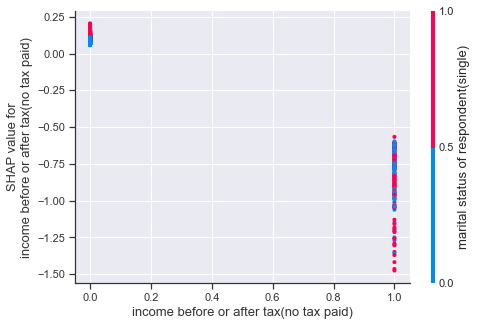

<Figure size 1152x720 with 0 Axes>

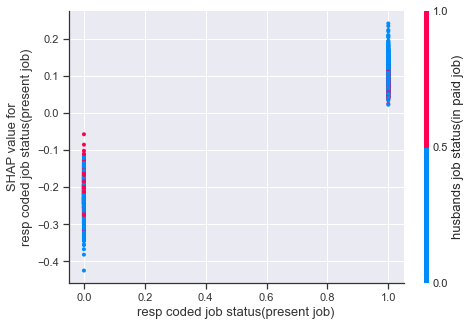

<Figure size 1152x720 with 0 Axes>

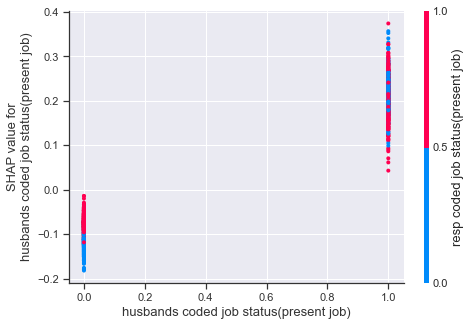

<Figure size 1152x720 with 0 Axes>

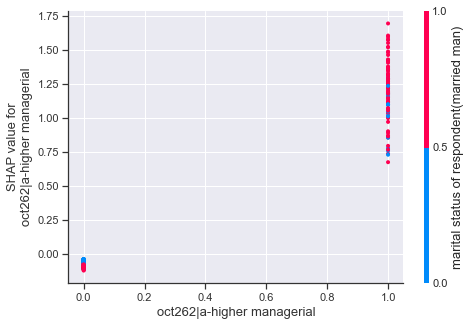

<Figure size 1152x720 with 0 Axes>

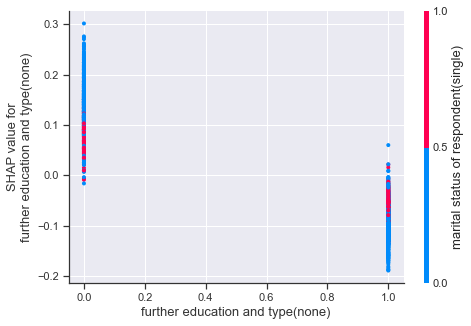

In [414]:
ge = "1974_oct"
harm_vars = ["wt","age","housing_det","harmonised_voted","inc_det"]
target_var = "inc_det"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "inc_det"
min_features = 10
drop_vars = ["oct212"]
drop_std_thresh = 0

alg = get_xgboost_alg(classification_problem=False)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars]
drop_vars.remove("wt")
drop_vars.remove(var_stub)

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True,alg=alg)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
# use fitted algorithm to predict values
inc_pred = alg.predict(df_pred[train_columns])
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [420]:
inc_pred = pd.Series(inc_pred,index=inc.index).round()
inc.loc[inc.isnull()] = inc_pred.loc[inc.isnull()]
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_oct","inc_det"] = inc

In [418]:
# inc_pred.hist()

In [419]:
# inc.hist()

In [421]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_oct"].isnull().sum()

dataset                    0
uid                        0
housing_det               16
housing                    0
inc                      348
vote                       0
year                       0
wt                         0
age                        0
vote_simple                7
bloc                       0
birth_year                10
harmonised_voted           0
inc_det                    0
vote_complete              0
vote_complete_simple    2365
bloc_complete           2365
turnout_complete        2365
dtype: int64

In [ ]:
## just do vote_complete/simple/bloc/turnout

In [424]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_oct","vote_complete"].value_counts()

LAB    846
CON    730
LIB    364
DNV    355
SNP     56
PC       7
OTH      7
Name: vote_complete, dtype: int64

In [422]:
vote_simple = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_oct","vote_complete"].replace(simple_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_oct","vote_complete_simple"] = vote_simple
vote_simple.value_counts(dropna=False)

LAB    846
CON    730
LD     364
DNV    355
SNP     56
DK       7
PC       7
Name: vote_complete, dtype: int64

In [423]:
bloc_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_oct","vote_complete_simple"].replace(bloc_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_oct","bloc_complete"] = bloc_complete
bloc_complete.value_counts(dropna=False)

Left-Lib      1273
Right-Auth     730
Neither        355
NaN              7
Name: vote_complete_simple, dtype: int64

In [425]:
turnout_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_oct","vote_complete"].replace(turnout_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_oct","turnout_complete"] = turnout_complete
turnout_complete.value_counts(dropna=False)

VOTED    2010
DNV       355
Name: vote_complete, dtype: int64

In [427]:
# f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_oct"].isnull().sum()

In [428]:
f2f_harmonised.to_pickle("E:\\BES_analysis_data\\Face_to_face\\f2f_harmonised.zip", compression='zip')

In [ ]:
#### 1979

In [429]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1979"].isnull().sum()

# age (16 missing vals) DONE
# housing_det 43nans, 12dks, some more information in housing DONE
# vote 14nans, 52dks
# inc (366 missing vals)

dataset                    0
uid                        0
housing_det               43
housing                   28
inc                      366
vote                      14
year                       0
wt                         0
age                       16
vote_simple               21
bloc                      14
birth_year                16
harmonised_voted           0
inc_det                 1893
vote_complete           1893
vote_complete_simple    1893
bloc_complete           1893
turnout_complete        1893
dtype: int64

In [431]:
# f2f_harmonised.loc[f2f_harmonised["dataset"]=="1979","housing_det"].value_counts(dropna=False)
# 43nans, 12DKs, some where we have some inf from housing
# f2f_harmonised.loc[f2f_harmonised["dataset"]=="1979","housing"].value_counts(dropna=False)

## NOTE - there's a "living in parent's home" variable

MORT       619
RENT-LA    571
OWN        412
RENT-PR    208
NaN         43
OTH         28
DK          12
Name: housing_det, dtype: int64

In [433]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1979","vote"].value_counts(dropna=False)

CON    732
LAB    586
DNV    269
LIB    215
DK      52
NaN     14
SNP     14
OTH      7
PC       4
Name: vote, dtype: int64

In [ ]:
## age

In [436]:
# age = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1979","age"].copy()
# mask = age.isnull()

MSE: 50.55, MAE: 5.43, EV: 0.83, R2: 0.83


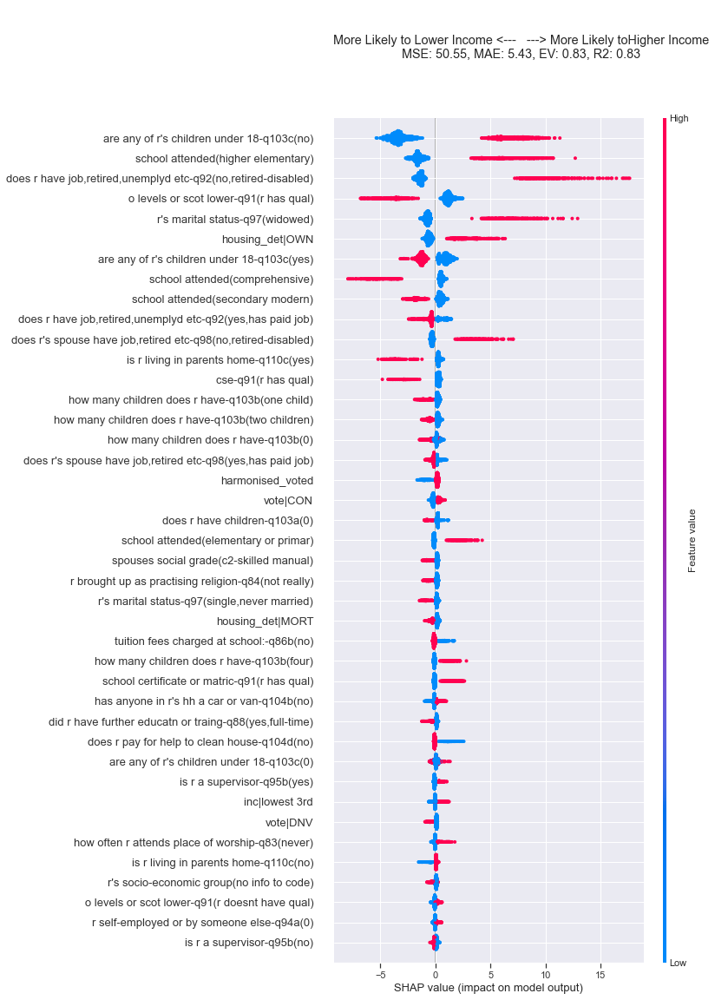

<Figure size 1152x720 with 0 Axes>

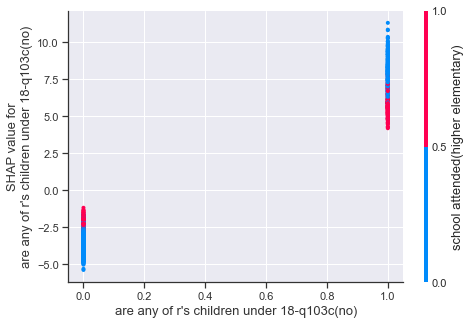

<Figure size 1152x720 with 0 Axes>

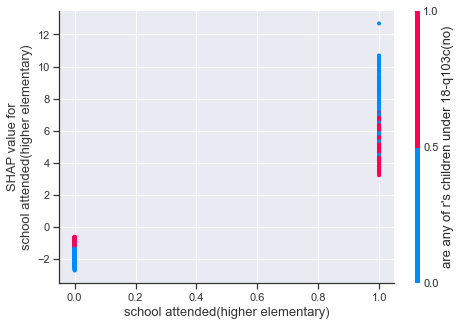

<Figure size 1152x720 with 0 Axes>

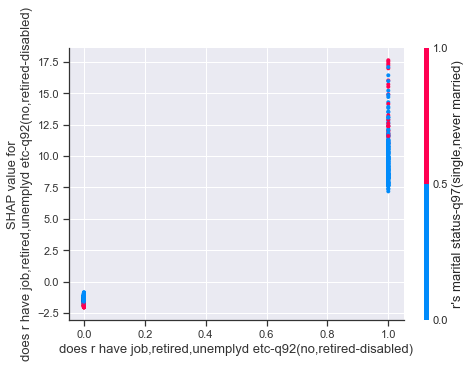

<Figure size 1152x720 with 0 Axes>

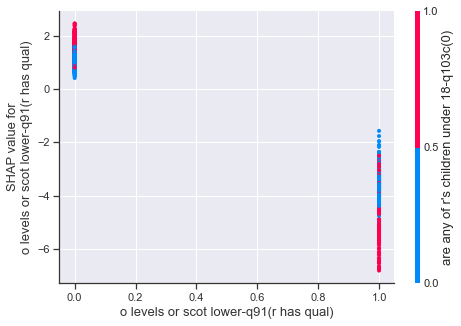

<Figure size 1152x720 with 0 Axes>

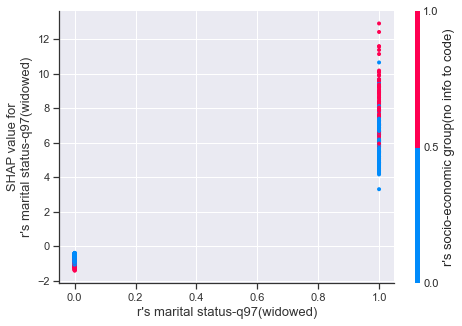

<Figure size 1152x720 with 0 Axes>

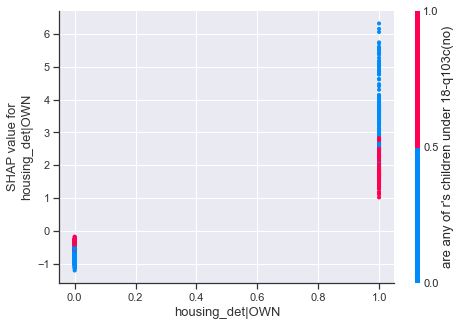

<Figure size 1152x720 with 0 Axes>

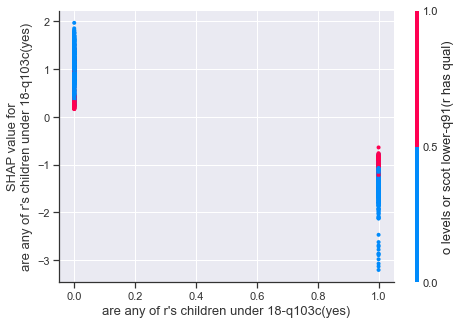

<Figure size 1152x720 with 0 Axes>

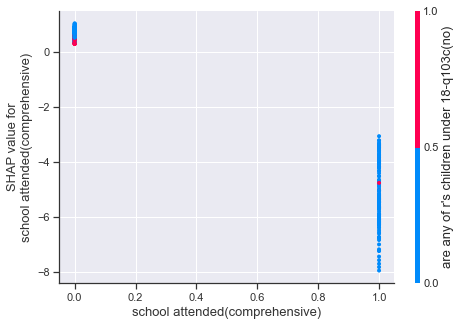

<Figure size 1152x720 with 0 Axes>

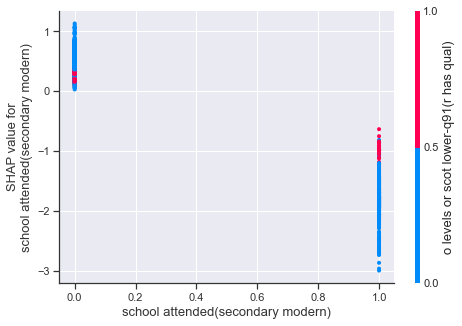

<Figure size 1152x720 with 0 Axes>

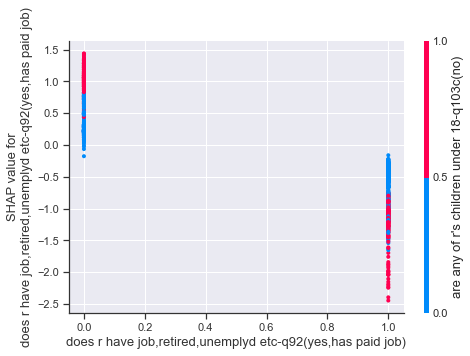

<Figure size 1152x720 with 0 Axes>

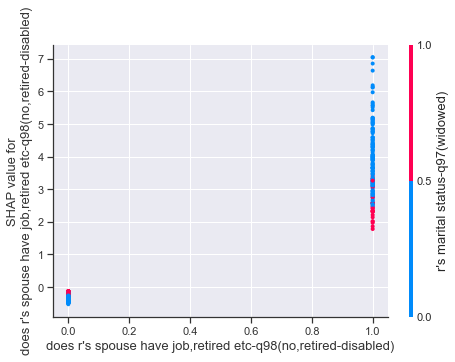

<Figure size 1152x720 with 0 Axes>

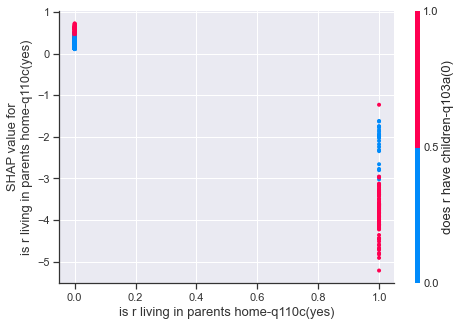

<Figure size 1152x720 with 0 Axes>

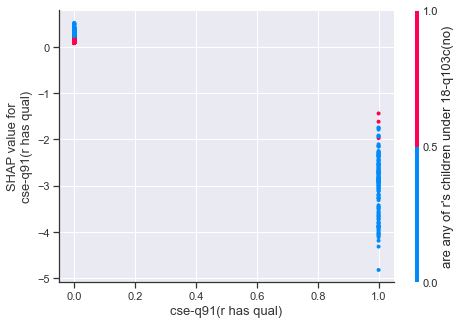

<Figure size 1152x720 with 0 Axes>

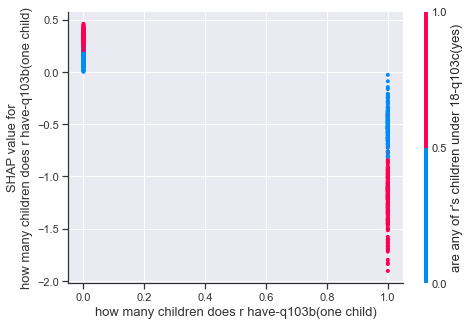

<Figure size 1152x720 with 0 Axes>

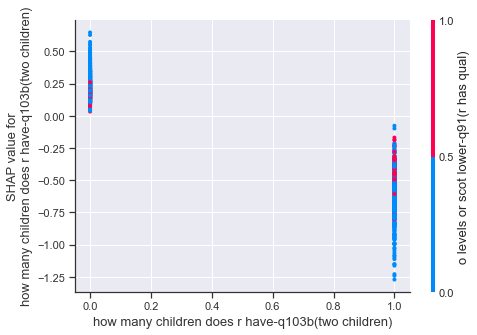

<Figure size 1152x720 with 0 Axes>

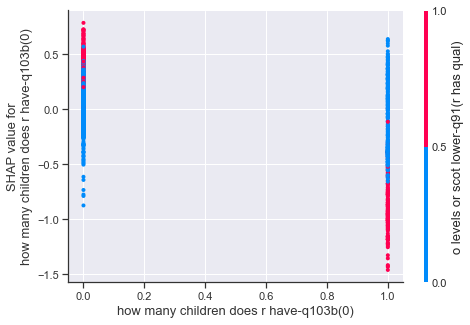

<Figure size 1152x720 with 0 Axes>

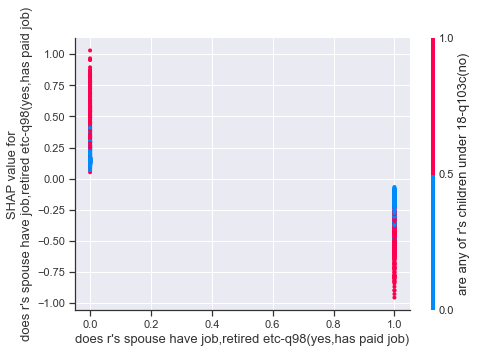

<Figure size 1152x720 with 0 Axes>

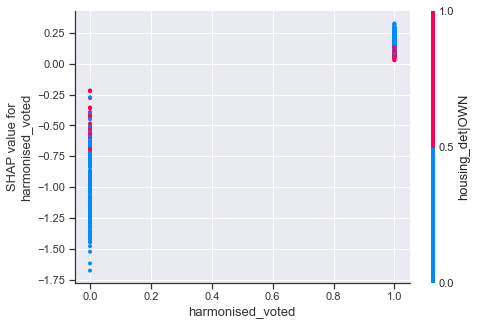

<Figure size 1152x720 with 0 Axes>

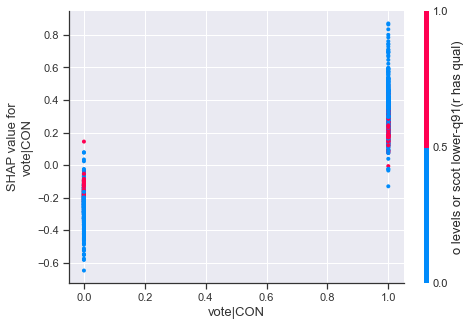

<Figure size 1152x720 with 0 Axes>

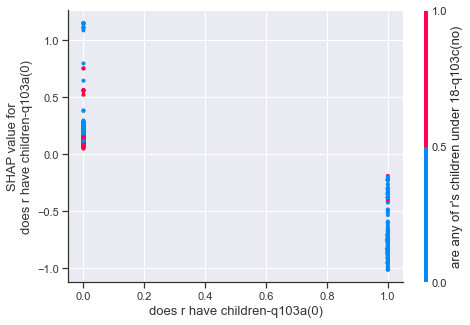

<Figure size 1152x720 with 0 Axes>

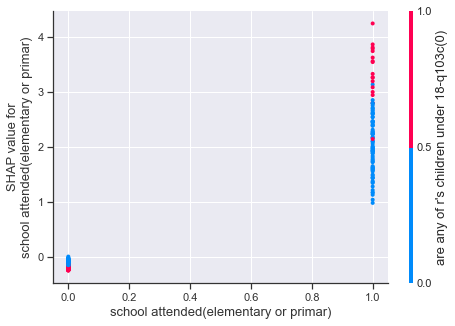

<Figure size 1152x720 with 0 Axes>

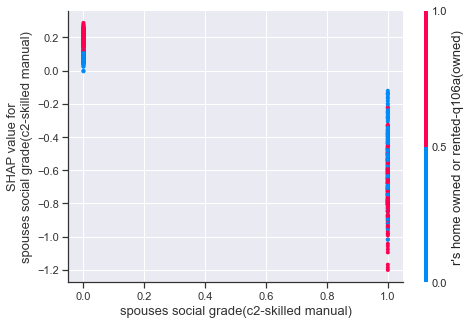

<Figure size 1152x720 with 0 Axes>

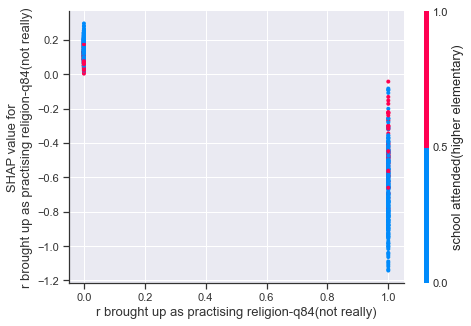

<Figure size 1152x720 with 0 Axes>

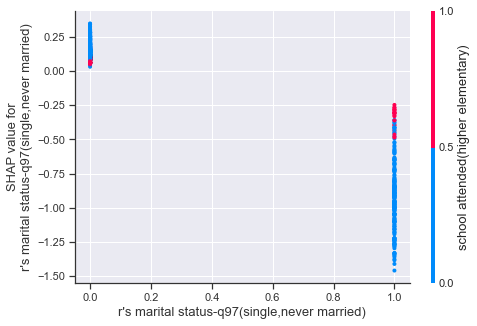

<Figure size 1152x720 with 0 Axes>

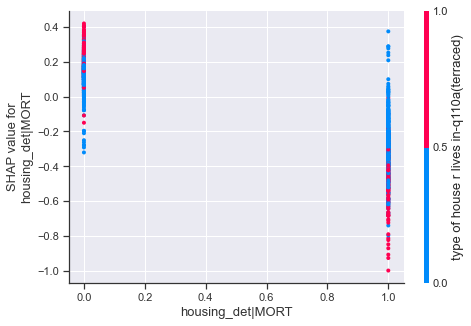

<Figure size 1152x720 with 0 Axes>

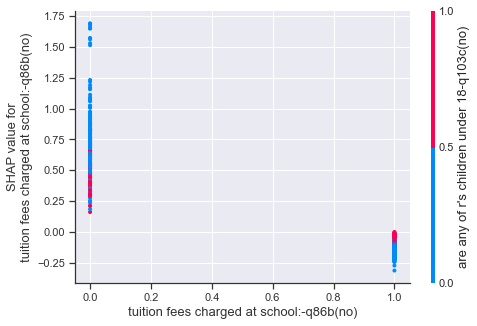

<Figure size 1152x720 with 0 Axes>

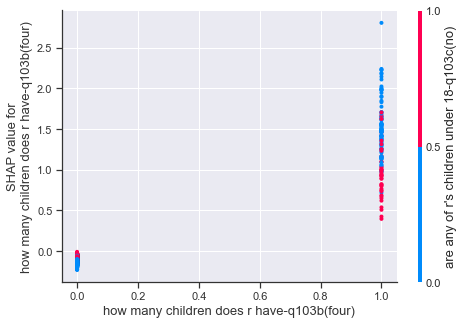

<Figure size 1152x720 with 0 Axes>

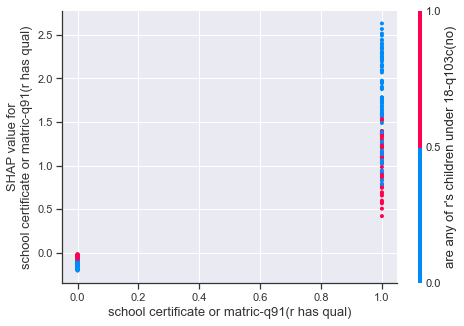

<Figure size 1152x720 with 0 Axes>

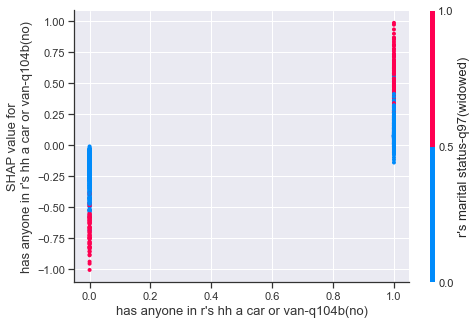

<Figure size 1152x720 with 0 Axes>

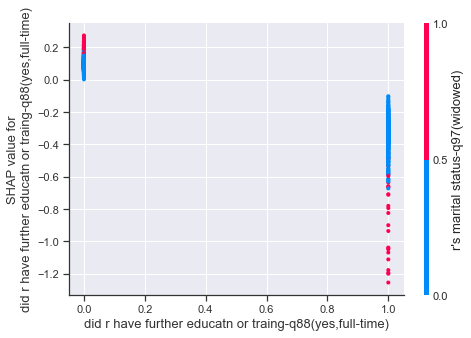

<Figure size 1152x720 with 0 Axes>

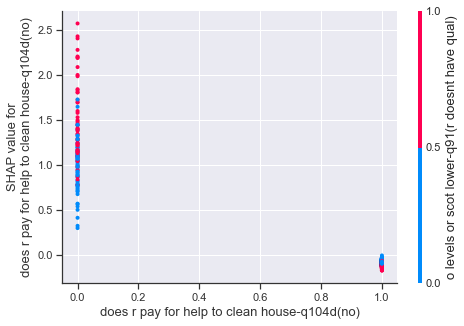

<Figure size 1152x720 with 0 Axes>

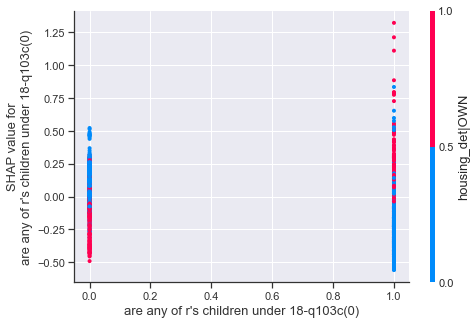

<Figure size 1152x720 with 0 Axes>

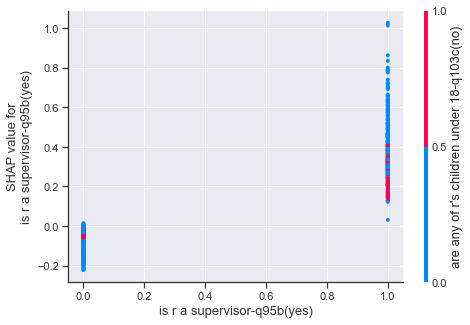

<Figure size 1152x720 with 0 Axes>

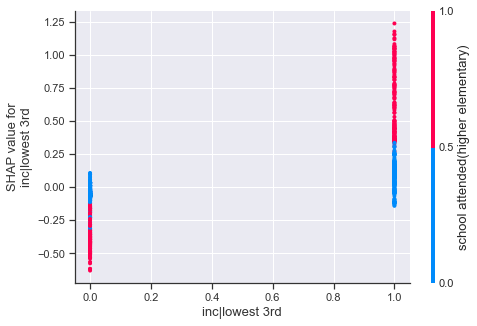

<Figure size 1152x720 with 0 Axes>

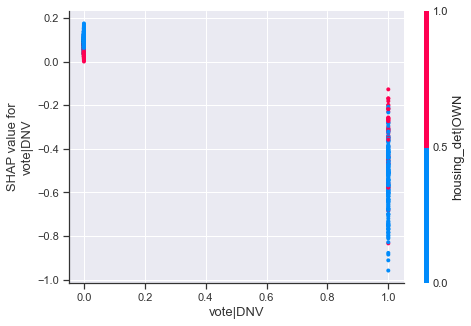

<Figure size 1152x720 with 0 Axes>

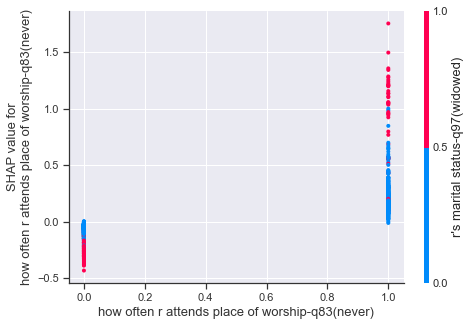

<Figure size 1152x720 with 0 Axes>

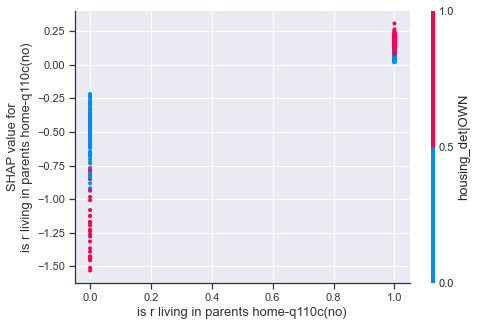

<Figure size 1152x720 with 0 Axes>

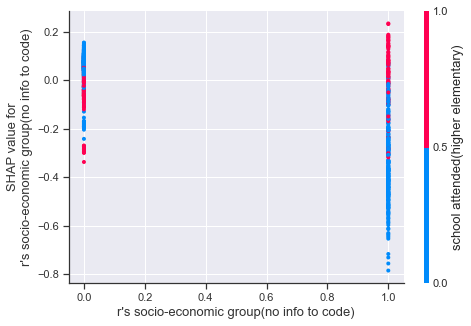

<Figure size 1152x720 with 0 Axes>

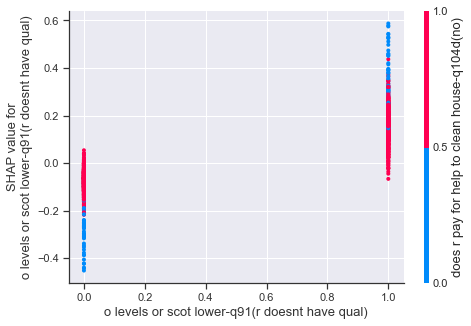

<Figure size 1152x720 with 0 Axes>

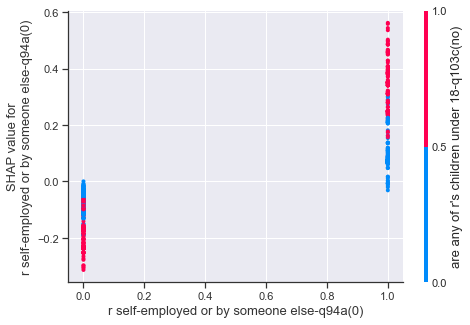

<Figure size 1152x720 with 0 Axes>

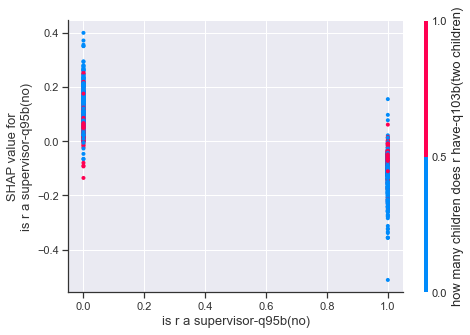

In [438]:
ge = "1979"
age = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"].copy()
mask = age.isnull()

harm_vars = ["wt","age","housing_det","harmonised_voted","inc","vote"]
target_var = "age"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "age"
min_features = 10
drop_vars = ["m191279"]


alg = get_xgboost_alg(classification_problem=False)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<.25].index)
drop_vars.remove("wt")
drop_vars.remove(var_stub)

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True,alg=alg)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
# use fitted algorithm to predict values
age_pred = pd.Series(alg.predict(df_pred[train_columns]),index=age.index).round()
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

age.loc[age.isnull()] = age_pred.loc[age.isnull()]
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"] = age
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"].isnull().sum()

In [442]:
# age.hist()
# age_pred.hist()
# reasonable eyeball check

In [444]:
age.loc[age.isnull()] = age_pred.loc[age.isnull()]
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1979","age"] = age
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1979","age"].isnull().sum()

0

In [443]:
## housing

In [445]:
housing = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1979","housing_det"].copy()

In [447]:
housing.value_counts()

MORT       619
RENT-LA    571
OWN        412
RENT-PR    208
OTH         28
DK          12
Name: housing_det, dtype: int64

In [448]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1979","housing"].value_counts()

OWN     1037
RENT     780
OTH       46
DK         2
Name: housing, dtype: int64

In [460]:
# housing[f2f_harmonised.loc[f2f_harmonised["dataset"]=="1979","housing"]=="OTH"]

## this looks like bug!
# be dubious about 'housing'

BES_df_list["1979"]["m187a280"][f2f_harmonised.loc[f2f_harmonised["dataset"]=="1979","housing"]=="OTH"]
BES_df_list["1979"]["m187a281"][f2f_harmonised.loc[f2f_harmonised["dataset"]=="1979","housing"]=="OTH"]
BES_df_list["1979"]["m187a282"][f2f_harmonised.loc[f2f_harmonised["dataset"]=="1979","housing"]=="OTH"]

# ah - source variables are inconsistent - one bug, rest 'tied cottage' (accommodation comes with the job)
# housing.value_counts()
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1979","housing_det"] = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1979","housing_det"].replace("OTH",np.nan).replace("DK",np.nan)

In [484]:
housing.loc[(BES_df_list["1979"]["m187a280"]=='other')] = housing.loc[(BES_df_list["1979"]["m187a280"]=='other')].fillna("OTH")

## take "other" seriously where not actively contradicted, don't try to impute

In [485]:
housing = housing.replace("DK",np.nan)
mask = housing.isnull()

ACC: 0.81,  F1: 0.81


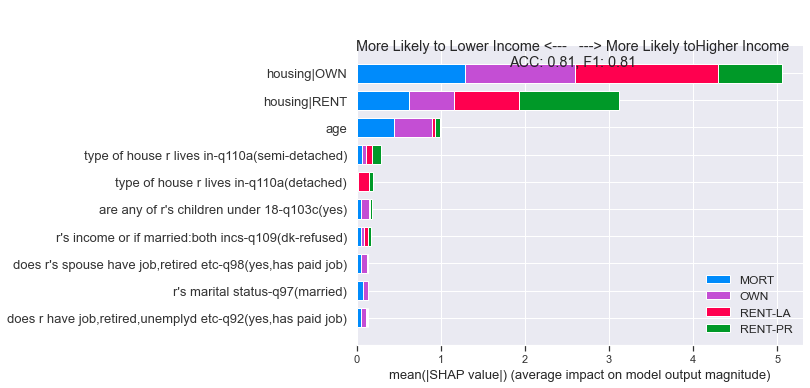

In [486]:
ge = "1979"
harm_vars = ["wt","age","housing_det","harmonised_voted","inc_det","housing"]
target_var = "housing_det"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "housing_det"
min_features = 10
drop_vars = ['m187a280','m187a281','m187a282']

alg = get_xgboost_alg(classification_problem=True)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds==0].index)
drop_vars.remove("wt")
drop_vars.remove(var_stub)

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=True,alg=alg,multi_class_target=True)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
# use fitted algorithm to predict values
housing_pred = pd.Series(alg.predict(df_pred[train_columns]),index=housing.index)
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [470]:
housing_pred = pd.Series(alg.predict(df_pred[train_columns]),index=housing.index)
# housing_pred.value_counts()
housing_pred[mask].value_counts()

RENT-LA    47
MORT        5
RENT-PR     2
OWN         1
dtype: int64

In [488]:
# reasonableness check
# housing.value_counts()

# pd.concat([BES_df_list["1979"]["m215285"][mask],BES_df_list["1979"]["m000287"][mask],
#            BES_df_list["1979"]["m187a280"][mask],BES_df_list["1979"]["m187a281"][mask],BES_df_list["1979"]["m187a282"][mask],
#            f2f_harmonised.loc[f2f_harmonised["dataset"]=="1979","housing"][mask],housing_pred[mask]],axis=1)

#  'm215285': 'type of house r lives in-q110a',
#  'm000287': 'is r living in parents home-q110c',

In [489]:
housing.loc[mask]= housing_pred.loc[mask]

In [529]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1979","housing_det"] = housing.replace("OTH",np.nan)

In [530]:
housing.value_counts(dropna=False)

MORT       624
RENT-LA    602
OWN        413
RENT-PR    210
OTH         44
Name: housing_det, dtype: int64

In [ ]:
# vote

In [493]:
vote_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1979","vote"].replace("DK",np.nan)
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1979","vote_complete"] = vote_complete
mask = vote_complete.isnull()

ACC: 0.95,  F1: 0.95


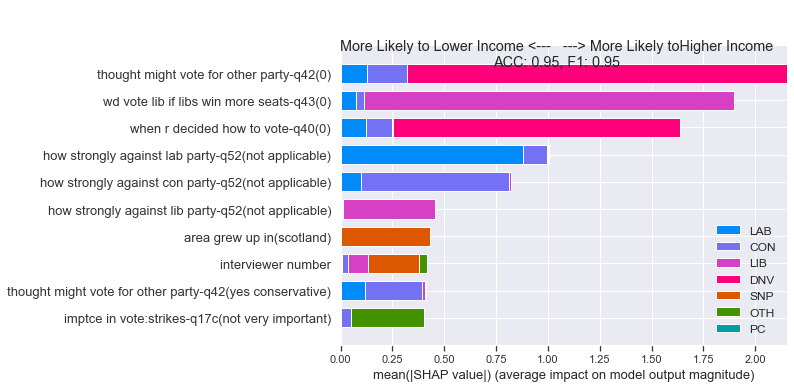

In [494]:
ge = "1979"
harm_vars = ["wt","age","housing_det","vote_complete","inc"]
target_var = "vote_complete"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "vote_complete"
min_features = 10
drop_std_thresh = 0
drop_vars = ['m115147','m114145']
#     'oct115','oct112', # basic vote vars
#              'oct115a','oct115b','oct115c', # vars for 'if you voted con/lab'
#              'oct119','oct119a','oct119b','oct119c','oct119d'] # same for 'voted for libs'


alg = get_xgboost_alg(classification_problem=True)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars.remove("wt")
drop_vars.remove(var_stub)

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=False,alg=alg,multi_class_target=True)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
# use fitted algorithm to predict values
vote_pred = pd.Series(alg.predict(df_pred[train_columns]),index=vote_complete.index)
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [500]:
# vote_pred.value_counts(dropna=False)

In [501]:
# vote_complete.value_counts(dropna=False)

In [502]:
# vote_pred[mask].value_counts(dropna=False)

In [515]:
vote_complete.loc[mask] = vote_pred[mask]
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1979","vote_complete"] = vote_complete
## whoops - copied over vote!

In [ ]:
# inc

In [ ]:
# BES_df_list["1974_oct"]["oct212"].value_counts()
# inc = BES_df_list["1979"]["oct212"].replace("7",np.nan).replace("8",np.nan).astype('category').cat.codes.replace(-1,np.nan)
# f2f_harmonised.loc[f2f_harmonised["dataset"]=="1974_oct","inc_det"] = inc
# mask = inc.isnull()

In [514]:
inc = BES_df_list["1979"]["m212284"].cat.remove_categories([0,'dk-refused']).cat.codes.replace(-1,np.nan)
mask = inc.isnull()
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1979","inc_det"] = inc

MSE: 4.21, MAE: 1.54, EV: 0.57, R2: 0.57


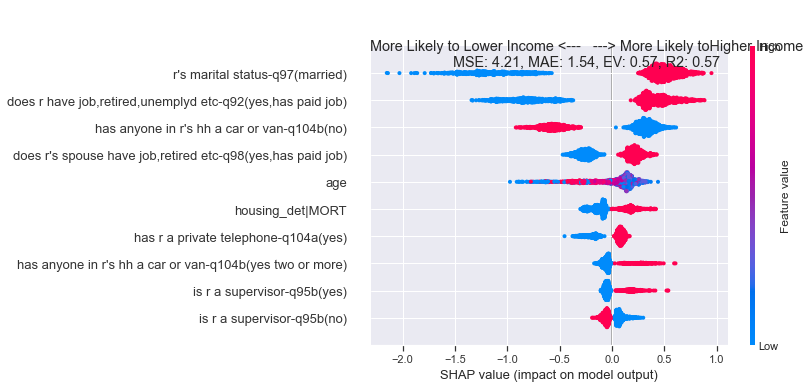

<Figure size 1152x720 with 0 Axes>

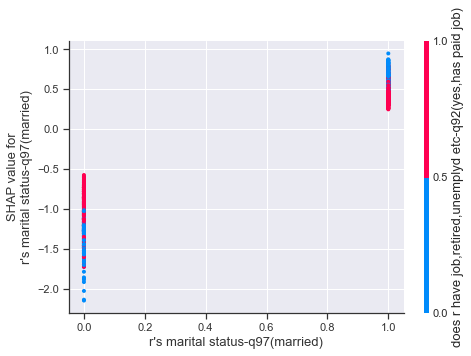

<Figure size 1152x720 with 0 Axes>

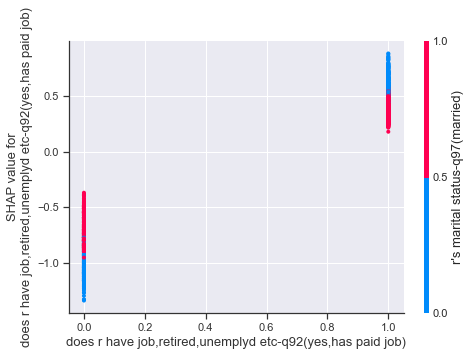

<Figure size 1152x720 with 0 Axes>

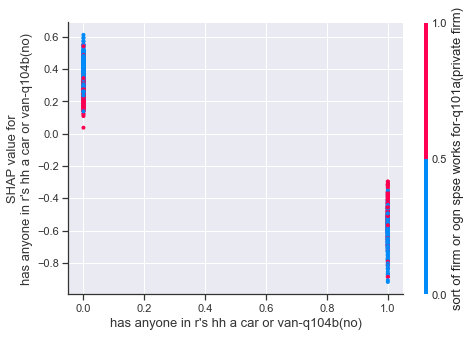

<Figure size 1152x720 with 0 Axes>

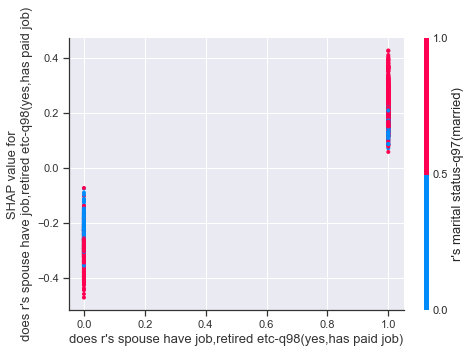

<Figure size 1152x720 with 0 Axes>

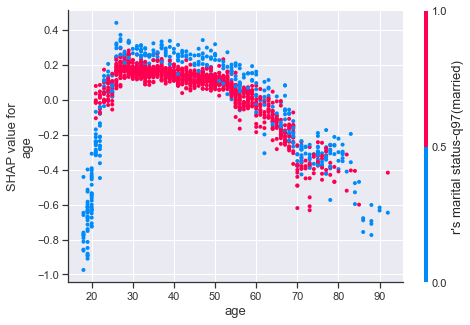

<Figure size 1152x720 with 0 Axes>

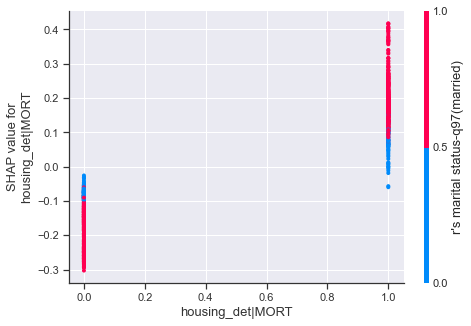

<Figure size 1152x720 with 0 Axes>

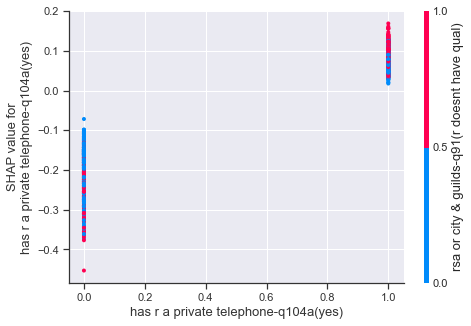

<Figure size 1152x720 with 0 Axes>

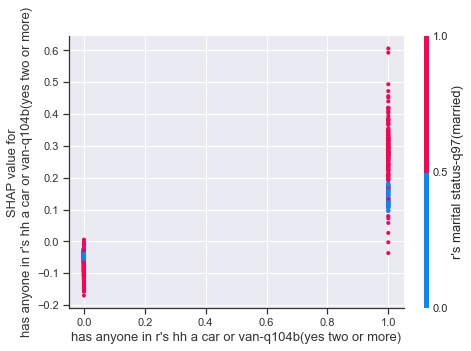

<Figure size 1152x720 with 0 Axes>

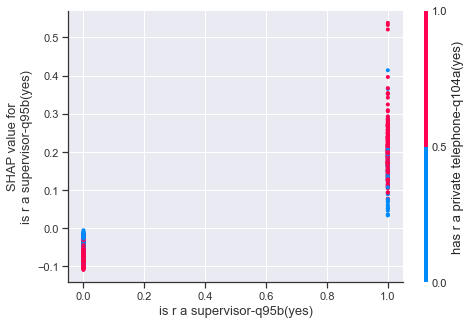

<Figure size 1152x720 with 0 Axes>

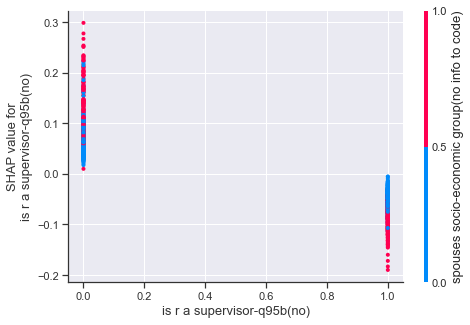

In [516]:
ge = "1979"
harm_vars = ["wt","age","housing_det","vote_complete","inc_det"]
target_var = "inc_det"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "inc_det"
min_features = 10
drop_vars = ["m212284"]
drop_std_thresh = 0

alg = get_xgboost_alg(classification_problem=False)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars]
drop_vars.remove("wt")
drop_vars.remove(var_stub)

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True,alg=alg)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
# use fitted algorithm to predict values
inc_pred = pd.Series(alg.predict(df_pred[train_columns]),index=inc.index).round()
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

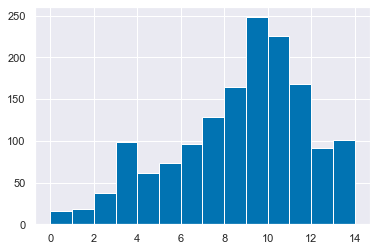

In [523]:
inc.hist(bins=14);

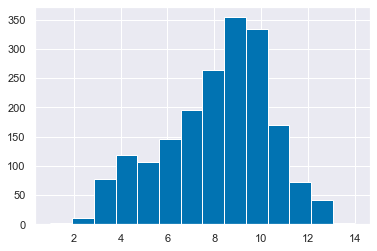

In [524]:
inc_pred.hist(bins=14);

In [525]:
inc.loc[mask]=inc_pred.loc[mask]
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1979","inc_det"] = inc

In [535]:
vote_simple = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1979","vote_complete"].replace(simple_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1979","vote_complete_simple"] = vote_simple
vote_simple.value_counts(dropna=False)

bloc_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1979","vote_complete_simple"].replace(bloc_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1979","bloc_complete"] = bloc_complete
bloc_complete.value_counts(dropna=False)

turnout_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1979","vote_complete"].replace(turnout_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1979","turnout_complete"] = turnout_complete
turnout_complete.value_counts(dropna=False)

VOTED    1607
DNV       286
Name: vote_complete, dtype: int64

In [536]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1979"].isnull().sum()

dataset                   0
uid                       0
housing_det              44
housing                  28
inc                     366
vote                      0
year                      0
wt                        0
age                       0
vote_simple              21
bloc                     14
birth_year               16
harmonised_voted          0
inc_det                   0
vote_complete             0
vote_complete_simple      0
bloc_complete             7
turnout_complete          0
dtype: int64

In [ ]:
## 1983

In [537]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1983"].isnull().sum()

# age (20 missing vals) DONE
# housing_det 35 NA (should that be read as OTH???) DONE (no blanks)
# vote (92 dks) DONE
# inc 83 missing vals 

dataset                    0
uid                        0
housing_det                0
housing                    0
inc                       83
vote                       0
year                       0
wt                         0
age                       20
vote_simple               96
bloc                       0
birth_year                20
harmonised_voted           0
inc_det                 3955
vote_complete           3955
vote_complete_simple    3955
bloc_complete           3955
turnout_complete        3955
dtype: int64

In [542]:
# f2f_harmonised.loc[f2f_harmonised["dataset"]=="1983","housing_det"].value_counts(dropna=False)

In [543]:
# f2f_harmonised.loc[f2f_harmonised["dataset"]=="1983","housing"].value_counts(dropna=False)

In [ ]:
# age

MSE: 40.26, MAE: 4.75, EV: 0.87, R2: 0.87


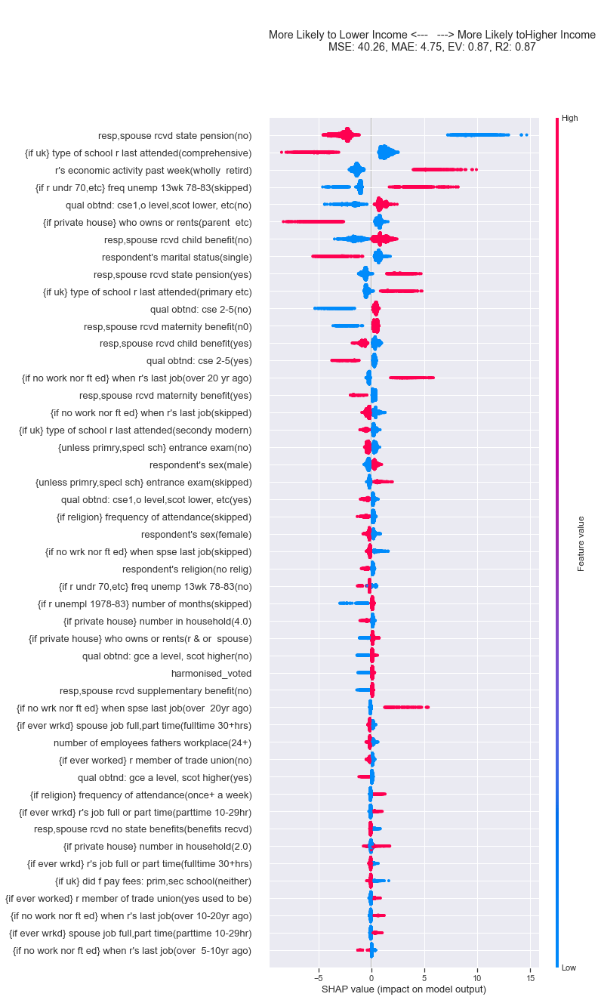

In [545]:
ge = "1983"
age = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"].copy()
mask = age.isnull()

harm_vars = ["wt","age","housing_det","harmonised_voted","inc","vote"]
target_var = "age"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "age"
min_features = 10
drop_vars = ["q56"]


alg = get_xgboost_alg(classification_problem=False)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<.25].index)
drop_vars.remove("wt")
drop_vars.remove(var_stub)

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=True,alg=alg)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
# use fitted algorithm to predict values
age_pred = pd.Series(alg.predict(df_pred[train_columns]),index=age.index).round()
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]



In [554]:
# age.hist(bins=100)

In [556]:
# age_pred.hist(bins=100)
# age_pred[mask].hist()
age.loc[age.isnull()] = age_pred.loc[age.isnull()]
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"] = age
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"].isnull().sum()

0

In [ ]:
# housing

In [557]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1983","housing_det"].value_counts()

OWN        2574
RENT-LA    1026
RENT-PR     184
OTH          78
RENT-HA      58
NA           35
Name: housing_det, dtype: int64

In [560]:
BES_df_list["1983"]["q65ab"].value_counts(dropna=False)
# looks complete
# people saying "NA" should prob be taken at their word
# 'institut' looks like 'other'

owns    house       2463
rent hse la          775
rent flt la          251
rent privt llord     184
owns    flat etc     111
rent frm other        78
rent    hsng ass      58
institut              21
65b na                11
65a,b  na              3
Name: q65ab, dtype: int64

In [1958]:
BES_label_list["1983"]["q65d"]

'[if yes at 65c] la tenant prior hse buy'

In [1963]:
# {k:v for k,v in BES_label_list["1983"].items() if "q66" in k.lower()}

In [561]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1983","housing_det"] = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1983","housing_det"].replace("OTH",np.nan).replace("NA",np.nan)

In [ ]:
# votes

In [574]:
vote_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1979","vote"].replace("DK",np.nan)
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1979","vote_complete"] = vote_complete
mask = vote_complete.isnull()

ACC: 0.91,  F1: 0.91


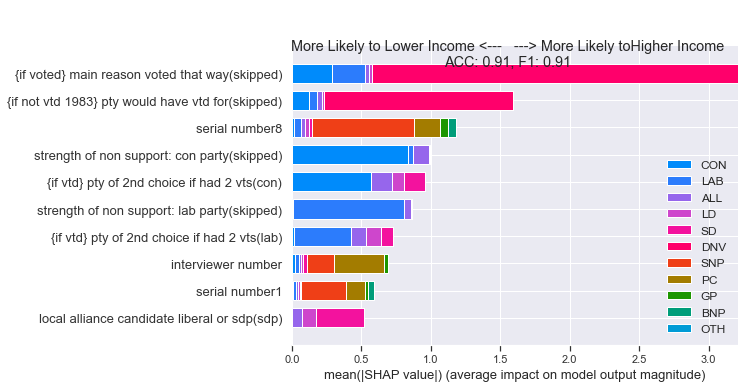

In [575]:
ge = "1983"

vote_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote"].replace("DK",np.nan)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"] = vote_complete
mask = vote_complete.isnull()

harm_vars = ["wt","age","housing_det","vote_complete","inc"]
target_var = "vote_complete"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "vote_complete"
min_features = 10
drop_std_thresh = 0
drop_vars = ['q9a','q7a']
#     'oct115','oct112', # basic vote vars
#              'oct115a','oct115b','oct115c', # vars for 'if you voted con/lab'
#              'oct119','oct119a','oct119b','oct119c','oct119d'] # same for 'voted for libs'


alg = get_xgboost_alg(classification_problem=True)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=False,alg=alg,multi_class_target=True)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
# use fitted algorithm to predict values
vote_pred = pd.Series(alg.predict(df_pred[train_columns]),index=vote_complete.index)
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [580]:
# vote_pred.value_counts()

In [581]:
# vote_complete.value_counts()

In [582]:
# vote_pred[mask].value_counts()

In [583]:
vote_complete.loc[mask] = vote_pred[mask]
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1983","vote_complete"] = vote_complete

In [ ]:
# inc

In [587]:
inc = BES_df_list["1983"]["q50a"].cat.remove_categories(['dk']).cat.codes.replace(-1,np.nan)
mask = inc.isnull()
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1983","inc_det"] = inc

MSE: 0.50, MAE: 0.56, EV: 0.30, R2: 0.30


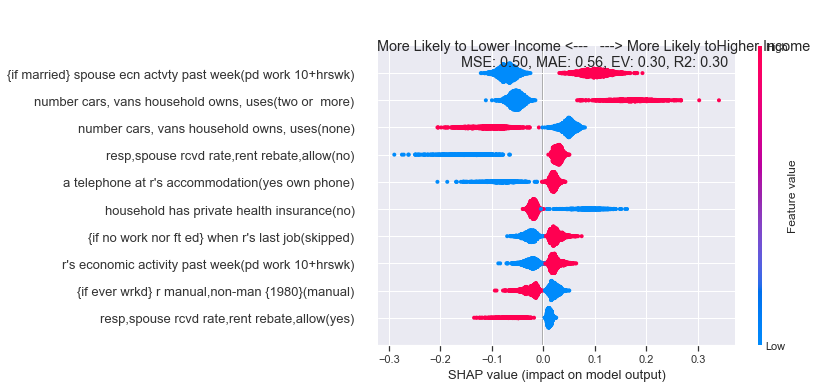

<Figure size 1152x720 with 0 Axes>

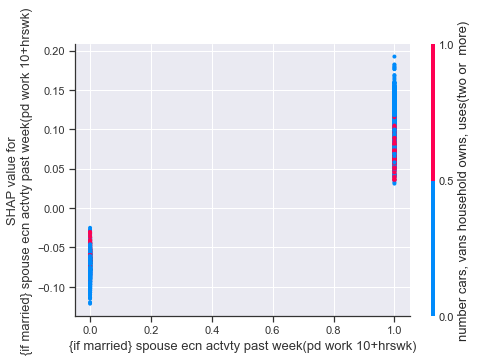

<Figure size 1152x720 with 0 Axes>

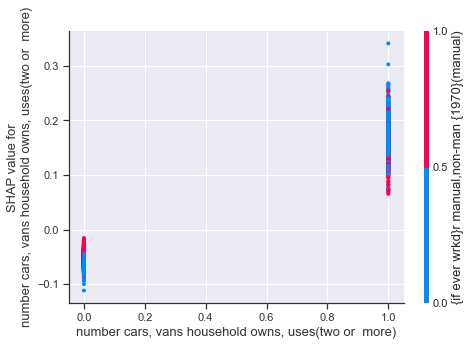

<Figure size 1152x720 with 0 Axes>

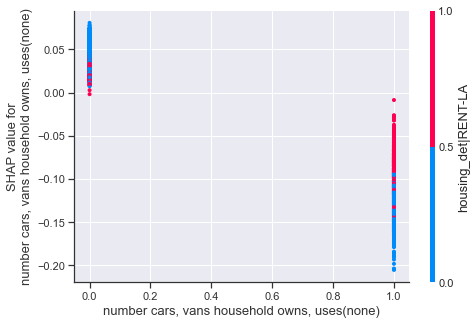

<Figure size 1152x720 with 0 Axes>

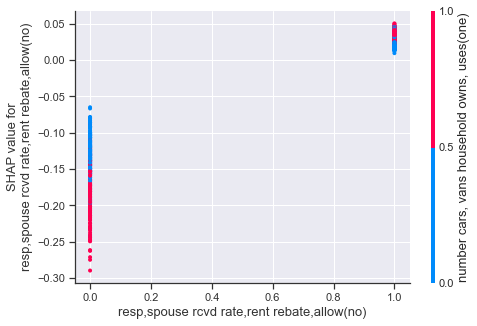

<Figure size 1152x720 with 0 Axes>

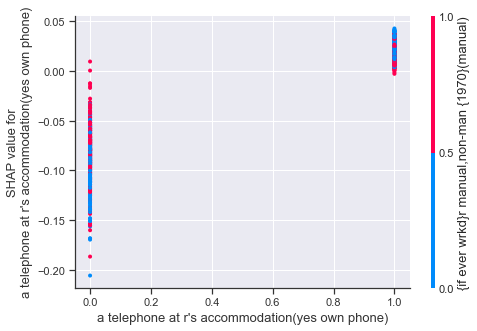

<Figure size 1152x720 with 0 Axes>

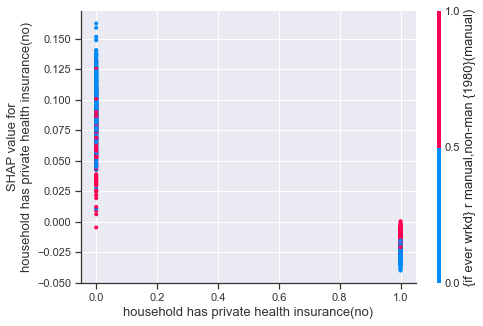

<Figure size 1152x720 with 0 Axes>

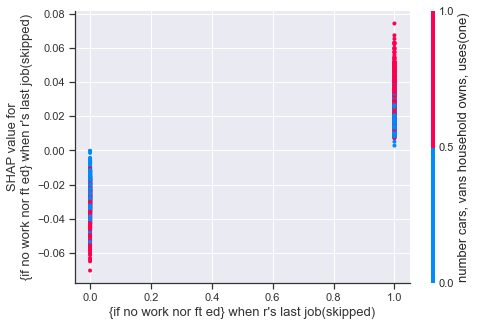

<Figure size 1152x720 with 0 Axes>

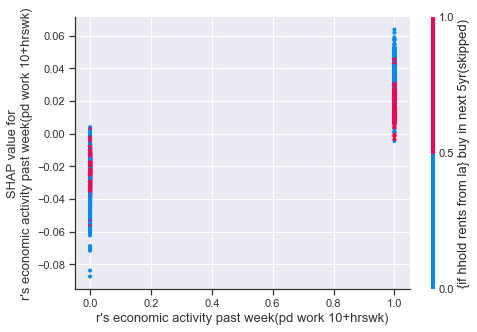

<Figure size 1152x720 with 0 Axes>

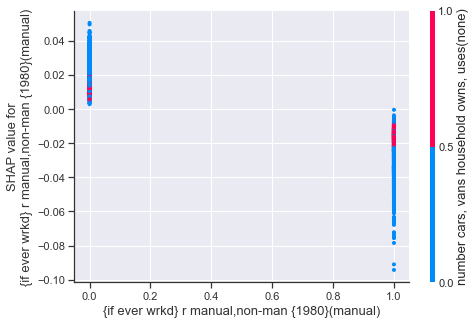

<Figure size 1152x720 with 0 Axes>

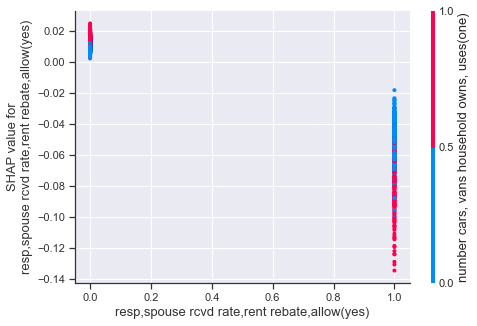

In [590]:
ge = "1983"
harm_vars = ["wt","age","housing_det","vote_complete","inc_det"]
target_var = "inc_det"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "inc_det"
min_features = 10
drop_vars = ["q50a"]
drop_std_thresh = 0

alg = get_xgboost_alg(classification_problem=False)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True,alg=alg)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
# use fitted algorithm to predict values
inc_pred = pd.Series(alg.predict(df_pred[train_columns]),index=inc.index).round()
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [591]:
inc.loc[mask]=inc_pred.loc[mask]
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1983","inc_det"] = inc

In [595]:
vote_simple = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1983","vote_complete"].replace(simple_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1983","vote_complete_simple"] = vote_simple
vote_simple.value_counts(dropna=False)

bloc_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1983","vote_complete_simple"].replace(bloc_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1983","bloc_complete"] = bloc_complete
bloc_complete.value_counts(dropna=False)

turnout_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1983","vote_complete"].replace(turnout_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1983","turnout_complete"] = turnout_complete
turnout_complete.value_counts(dropna=False)

VOTED    3295
DNV       660
Name: vote_complete, dtype: int64

In [596]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1983"].isnull().sum()

dataset                   0
uid                       0
housing_det             113
housing                   0
inc                      83
vote                      0
year                      0
wt                        0
age                       0
vote_simple              96
bloc                      0
birth_year               20
harmonised_voted          0
inc_det                   0
vote_complete             0
vote_complete_simple      0
bloc_complete             2
turnout_complete          0
dtype: int64

In [597]:
## 1987
ge = "1987"

In [651]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge].isnull().sum()

dataset                    0
uid                        0
housing_det                0
housing                    0
inc                      469
vote                       0
year                       0
wt                         0
age                       31
vote_simple                0
bloc                       0
birth_year                31
harmonised_voted           0
inc_det                 3826
vote_complete           3826
vote_complete_simple    3826
bloc_complete           3826
turnout_complete        3826
dtype: int64

In [638]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"]

0       44.0
1       30.0
2       40.0
3       78.0
4       26.0
        ... 
5995     NaN
5996     NaN
5997     NaN
5998     NaN
5999     NaN
Name: age, Length: 6000, dtype: float64

In [605]:
BES_df_list[ge].isnull().sum(axis=1).value_counts().sort_index().tail(10)

246       1
247       2
250       1
253       1
458       1
459       2
460    1631
461     432
462      17
463      91
dtype: int64

In [602]:
BES_df_list[ge].shape

(6000, 471)

In [606]:
excessive_nulls = BES_df_list[ge].isnull().sum(axis=1)>=458

In [613]:
BES_df_list[ge][excessive_nulls].notnull().sum().sort_values().tail(15)

v33f           0
v30a           0
opcsno        17
pano          17
vare        1643
varf2       2058
varf1       2058
vard        2168
varc        2174
intno       2174
turnout     2174
v23         2174
batch       2174
scprarea    2174
serialno    2174
dtype: int64

In [629]:
BES_df_list[ge][excessive_nulls]["vare"].value_counts()

## all the people who didn't actually do the interview!

no int - refused        1017
no int-not contctd       137
no int-ref thrd prty     137
no int-senile/incapd     102
no int - away             79
no int - broken appt      72
no int - other            67
no int - ill              29
uknown                     3
resp interviewed           0
retd compltd q/aire        0
Name: vare, dtype: int64

In [633]:
### BUGGED ROWS

temp_f2f = f2f_harmonised.reset_index().set_index("uid").copy()

# temp_f2f
temp_f2f = temp_f2f.drop(temp_f2f.loc[temp_f2f["dataset"]=="1987"].loc[excessive_nulls.values].index)

f2f_harmonised = temp_f2f.reset_index().set_index("index")[f2f_harmonised.columns]

BES_df_list[ge] = BES_df_list[ge].loc[f2f_harmonised.loc[f2f_harmonised["dataset"]==ge].index]

In [652]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge].isnull().sum()
# age
# housing_det - complete, just drop OTH/NA
# vote - 91 DKs
# inc 469 missing vals

dataset                    0
uid                        0
housing_det                0
housing                    0
inc                      469
vote                       0
year                       0
wt                         0
age                       31
vote_simple                0
bloc                       0
birth_year                31
harmonised_voted           0
inc_det                 3826
vote_complete           3826
vote_complete_simple    3826
bloc_complete           3826
turnout_complete        3826
dtype: int64

In [655]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote"].value_counts(dropna=False)

CON    1405
LAB    1000
LD      754
DNV     531
DK       91
SNP      29
PC       10
GP        6
Name: vote, dtype: int64

In [654]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing_det"] = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing_det"].replace("OTH",np.nan).replace("NA",np.nan)

In [657]:
## 1987, age

MSE: 45.28, MAE: 5.12, EV: 0.86, R2: 0.86


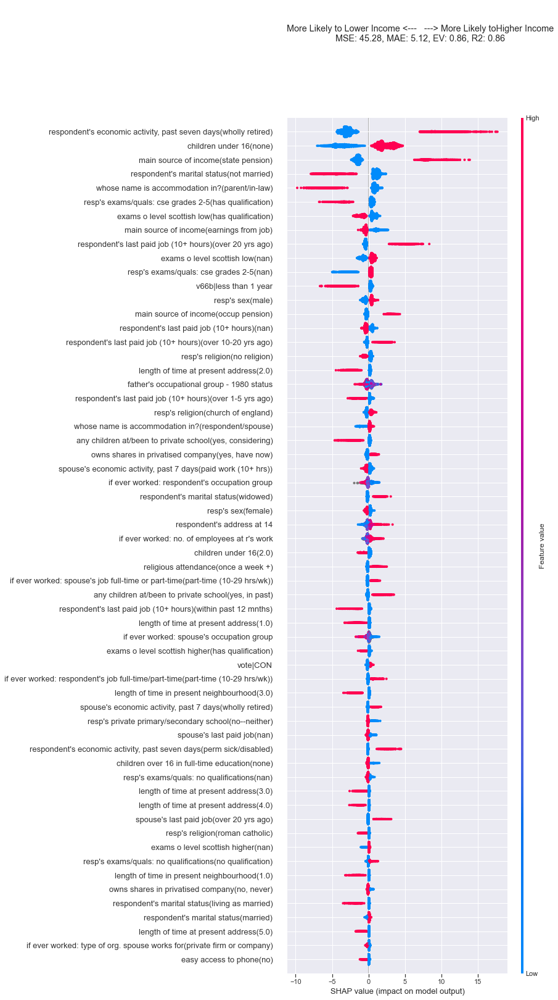

In [662]:

age = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"].copy()
mask = age.isnull()

harm_vars = ["wt","age","housing_det","harmonised_voted","inc","vote"]
target_var = "age"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "age"
min_features = 10
drop_vars = ["v58c"]


alg = get_xgboost_alg(classification_problem=False)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<.25].index)
drop_vars.remove("wt")
drop_vars.remove(var_stub)

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=True,alg=alg)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
# use fitted algorithm to predict values
age_pred = pd.Series(alg.predict(df_pred[train_columns]),index=age.index).round()
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [667]:
# age_pred.hist()
# age.hist()
age.loc[age.isnull()] = age_pred.loc[age.isnull()]
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"] = age
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"].isnull().sum()

0

In [666]:
# 87, votes

In [669]:
ge

'1987'

ACC: 0.91,  F1: 0.91


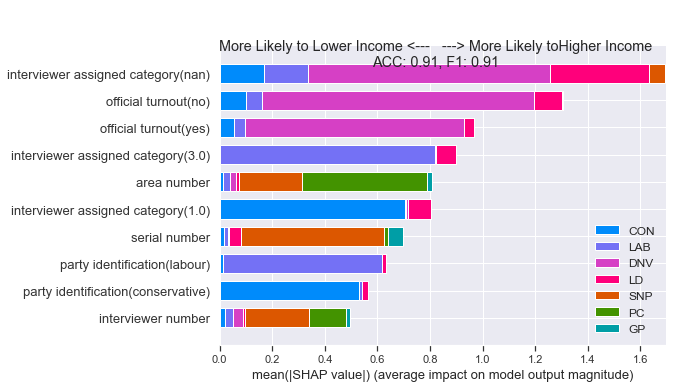

In [703]:
vote_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote"].replace("DK",np.nan)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"] = vote_complete
mask = vote_complete.isnull()

harm_vars = ["wt","age","housing_det","vote_complete","inc"]
target_var = "vote_complete"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "vote_complete"
min_features = 10
drop_std_thresh = 0
drop_vars = ['v8a','v6a','v15b1','v8b','v15b2','v9a','v6b1','v7','v15a','v8c','v6c']
#     'oct115','oct112', # basic vote vars
#              'oct115a','oct115b','oct115c', # vars for 'if you voted con/lab'
#              'oct119','oct119a','oct119b','oct119c','oct119d'] # same for 'voted for libs'
drop_vars = drop_vars+[k for k,v in BES_label_list[ge].items() if re.search("reason \d|have voted ",v.lower())]

alg = get_xgboost_alg(classification_problem=True)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=False,alg=alg,multi_class_target=True)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
# use fitted algorithm to predict values
vote_pred = pd.Series(alg.predict(df_pred[train_columns]),index=vote_complete.index)
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [705]:
# {k:v for k,v in BES_label_list[ge].items() if re.search("reason \d|have voted ",v.lower())}

In [706]:
# BES_df_list[ge]["v15b1"]

In [699]:
vote_pred.value_counts()

CON    1405
LAB    1000
LD      754
DNV     620
SNP      36
PC       10
GP        1
dtype: int64

In [708]:
vote_complete.loc[mask] = vote_pred.loc[mask]
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"] = vote_complete

In [ ]:
# 87 , inc

In [813]:
inc = BES_df_list["1987"]["v64"].cat.remove_categories(['dont know','refused','not answered']).cat.codes.replace(-1,np.nan)
mask = inc.isnull()
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1987","inc_det"] = inc

MSE: 2.86, MAE: 1.25, EV: 0.72, R2: 0.72


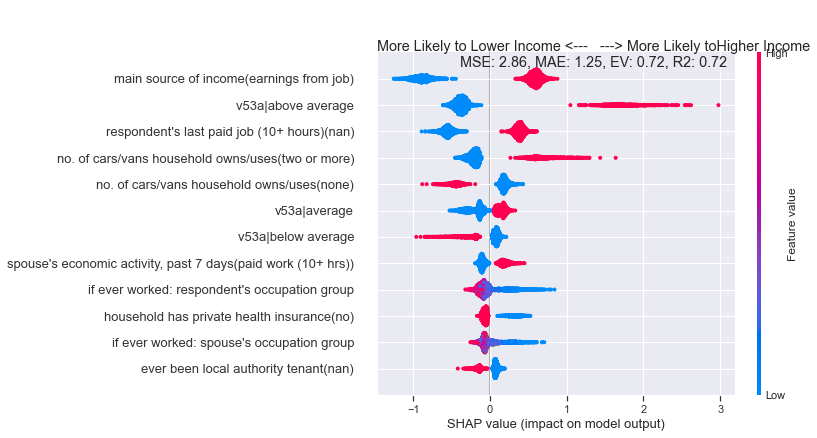

<Figure size 1152x720 with 0 Axes>

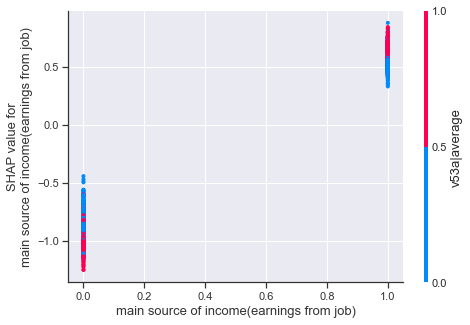

<Figure size 1152x720 with 0 Axes>

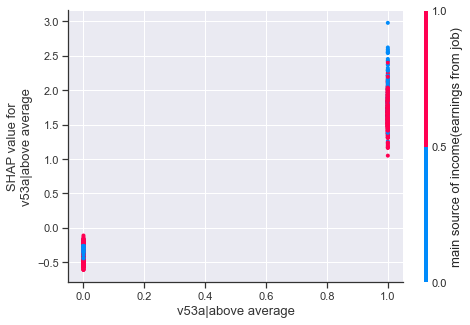

<Figure size 1152x720 with 0 Axes>

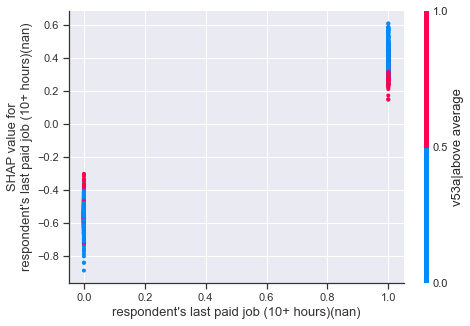

<Figure size 1152x720 with 0 Axes>

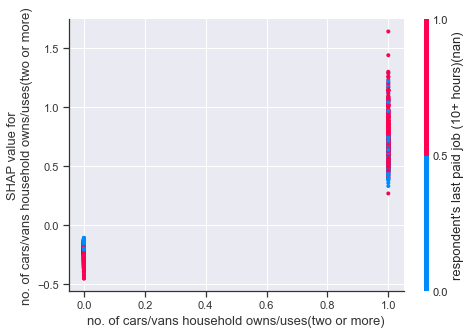

<Figure size 1152x720 with 0 Axes>

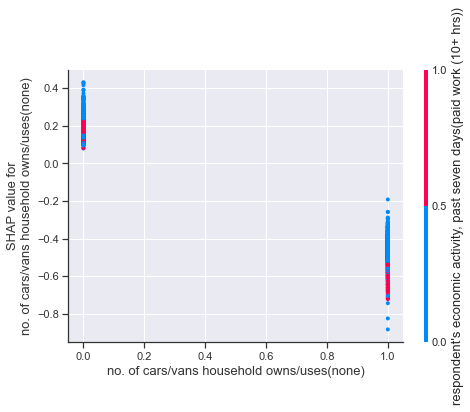

<Figure size 1152x720 with 0 Axes>

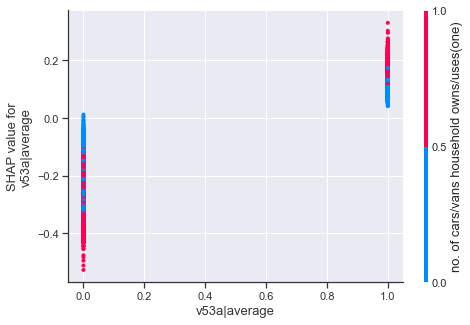

<Figure size 1152x720 with 0 Axes>

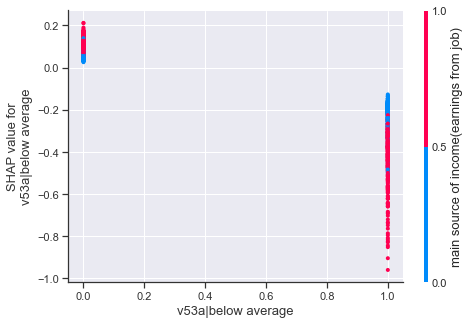

<Figure size 1152x720 with 0 Axes>

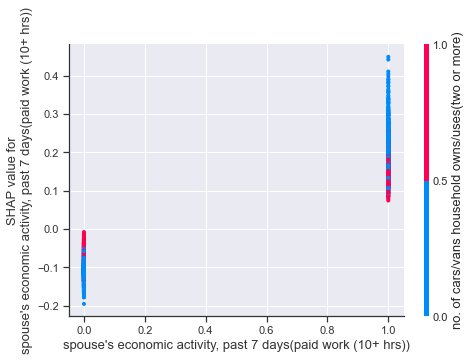

<Figure size 1152x720 with 0 Axes>

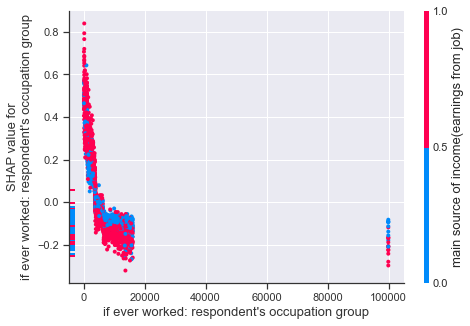

<Figure size 1152x720 with 0 Axes>

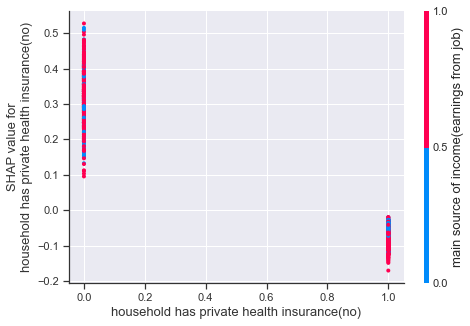

<Figure size 1152x720 with 0 Axes>

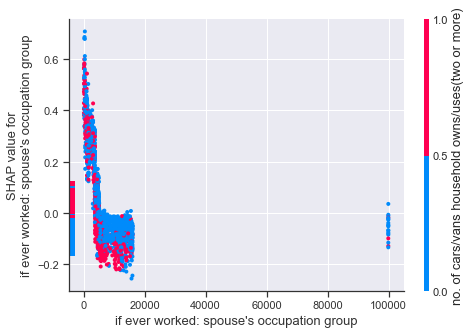

<Figure size 1152x720 with 0 Axes>

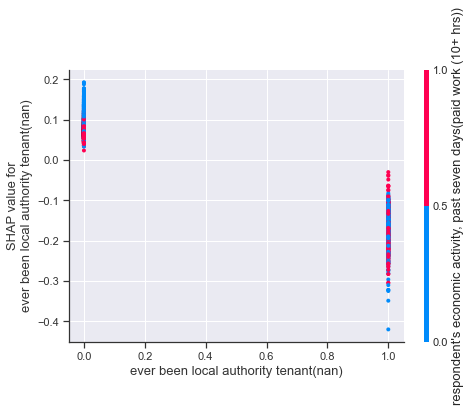

In [814]:
ge = "1987"
harm_vars = ["wt","age","housing_det","vote_complete","inc_det"]
target_var = "inc_det"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "inc_det"
min_features = 10
drop_vars = ["v64"]
drop_std_thresh = 0

alg = get_xgboost_alg(classification_problem=False)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True,alg=alg)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
# use fitted algorithm to predict values
inc_pred = pd.Series(alg.predict(df_pred[train_columns]),index=inc.index).round()
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [815]:
inc.loc[mask]=inc_pred.loc[mask]
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"inc_det"] = inc

In [719]:
vote_simple = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"].replace(simple_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete_simple"] = vote_simple
vote_simple.value_counts(dropna=False)

bloc_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete_simple"].replace(bloc_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"bloc_complete"] = bloc_complete
bloc_complete.value_counts(dropna=False)

turnout_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"].replace(turnout_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"turnout_complete"] = turnout_complete
turnout_complete.value_counts(dropna=False)

VOTED    3287
DNV       539
Name: vote_complete, dtype: int64

In [721]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge].isnull().sum()

dataset                   0
uid                       0
housing_det              76
housing                   0
inc                     469
vote                      0
year                      0
wt                        0
age                       0
vote_simple               0
bloc                      0
birth_year               31
harmonised_voted          0
inc_det                   0
vote_complete             0
vote_complete_simple      0
bloc_complete             0
turnout_complete          0
dtype: int64

In [770]:
## 1992
ge = "1992"

In [ ]:
excessive_nulls = BES_df_list["1992"].isnull().sum(axis=1)>=526
### BUGGED ROWS
ge = "1992"

temp_f2f = f2f_harmonised.reset_index().set_index("uid").copy()

# temp_f2f
temp_f2f = temp_f2f.drop(temp_f2f.loc[temp_f2f["dataset"]==ge].loc[excessive_nulls.values].index)

f2f_harmonised = temp_f2f.reset_index().set_index("index")[f2f_harmonised.columns]

BES_df_list[ge] = BES_df_list[ge].loc[f2f_harmonised.loc[f2f_harmonised["dataset"]==ge].index]

In [771]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge].isnull().sum()
# age - 49 gaps
# housing_det - no gaps (other than OTH/NA)
# vote - DK 85
# inc 452

dataset                    0
uid                        0
housing_det               80
housing                    0
inc                      452
vote                       0
year                       0
wt                         0
age                       49
vote_simple                9
bloc                       0
birth_year                49
harmonised_voted           0
inc_det                 3534
vote_complete           3534
vote_complete_simple    3534
bloc_complete           3534
turnout_complete        3534
dtype: int64

In [767]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing_det"].value_counts(dropna=False)

MORT       1551
OWN         884
RENT-LA     772
RENT-PR     151
RENT-HA      96
OTH          50
NA           30
Name: housing_det, dtype: int64

In [769]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing_det"] = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing_det"].replace("NA",np.nan).replace("OTH",np.nan)

In [768]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing"].value_counts(dropna=False)

OWN     2435
RENT    1019
OTH       50
NA        30
Name: housing, dtype: int64

In [ ]:
# 92, age

MSE: 59.03, MAE: 6.03, EV: 0.81, R2: 0.81


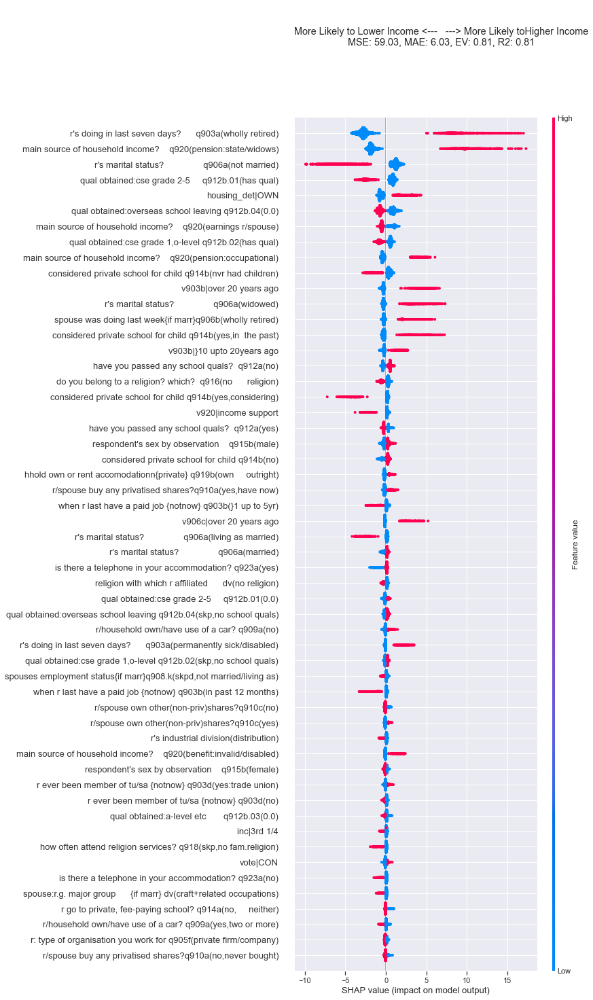

In [773]:
ge = "1992"
age = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"].copy()
mask = age.isnull()

harm_vars = ["wt","age","housing_det","harmonised_voted","inc","vote"]
target_var = "age"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "age"
min_features = 10
drop_std_thresh = 0
drop_vars = ["v915c"]


alg = get_xgboost_alg(classification_problem=False)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=True,alg=alg)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
# use fitted algorithm to predict values
age_pred = pd.Series(alg.predict(df_pred[train_columns]),index=age.index).round()
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [781]:
# age.hist()
age.loc[age.isnull()] = age_pred.loc[age.isnull()]
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"] = age
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"].isnull().sum()

0

In [ ]:
# 92, vote

ACC: 0.84,  F1: 0.84


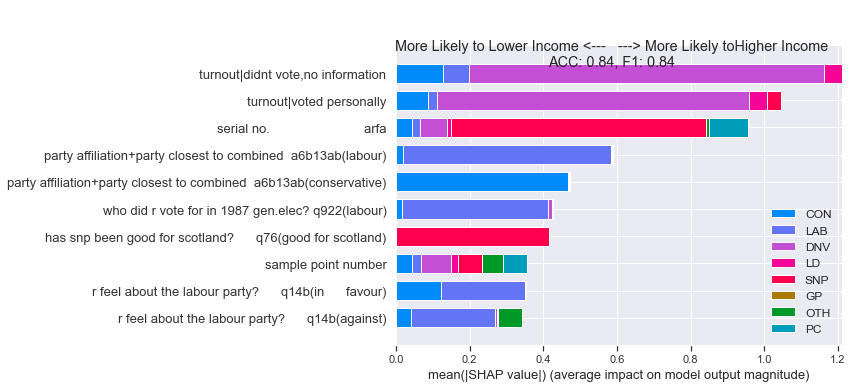

In [804]:
vote_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote"].replace("DK",np.nan)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"] = vote_complete.replace("BNP",np.nan)
mask = vote_complete.isnull()

harm_vars = ["wt","age","housing_det","vote_complete","inc"]
target_var = "vote_complete"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "vote_complete"
min_features = 10
drop_std_thresh = 0
drop_vars = ['v9a','v7a','v7b','v8','v9b','v10a','v10b',
             'v7b_1','v7b_2','v7b_3','v7b_4','v7b_5','v7b_6','v7b_7','v7b_8','v7b_9','v7b_10','v7b_11','v7b_12','v7b_13']
             #,'v8a','v15a','v7','v6c']
#     'v8a','v6a','v15b1','v8b','v15b2','v9a','v6b1','v7','v15a','v8c','v6c']
#     'oct115','oct112', # basic vote vars
#              'oct115a','oct115b','oct115c', # vars for 'if you voted con/lab'
#              'oct119','oct119a','oct119b','oct119c','oct119d'] # same for 'voted for libs'
drop_vars = drop_vars+[k for k,v in BES_label_list[ge].items() if re.search("v7b|what would be your 2nd choice",v.lower())]

alg = get_xgboost_alg(classification_problem=True)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=False,alg=alg,multi_class_target=True)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
# use fitted algorithm to predict values
vote_pred = pd.Series(alg.predict(df_pred[train_columns]),index=vote_complete.index)
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [810]:
# vote_complete.value_counts()
# vote_pred[mask].value_counts()
vote_complete.loc[mask] = vote_pred.loc[mask]
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"] = vote_complete
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"].isnull().sum()

0

In [808]:
# 92, inc

In [827]:
ge = "1992"
# inc = BES_df_list[ge]["hhincqua"].cat.remove_categories(['refused', "don't   know", 'not     answered']).cat.codes.replace(-1,np.nan)
inc = BES_df_list[ge]["v921"].cat.remove_categories(BES_df_list[ge]["v921"].cat.categories[-3:]).cat.codes.replace(-1,np.nan)
# inc.cat.categories[-3:]
inc.value_counts(dropna=False)
mask = inc.isnull()
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"inc_det"] = inc

MSE: 6.62, MAE: 1.90, EV: 0.63, R2: 0.63


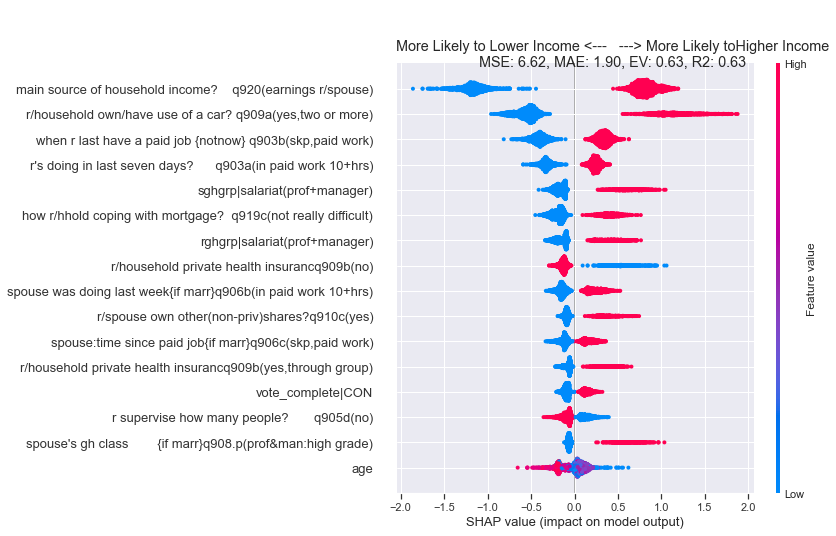

<Figure size 1152x720 with 0 Axes>

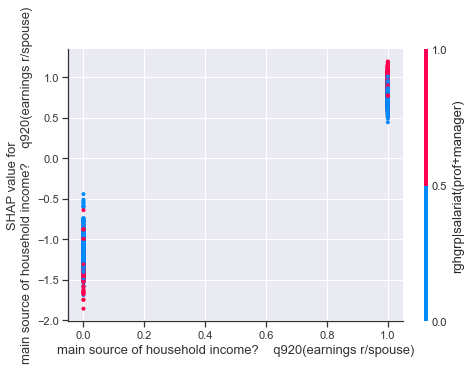

<Figure size 1152x720 with 0 Axes>

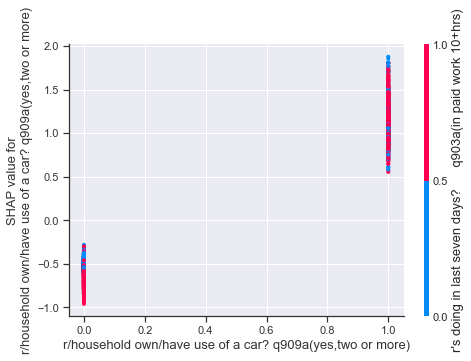

<Figure size 1152x720 with 0 Axes>

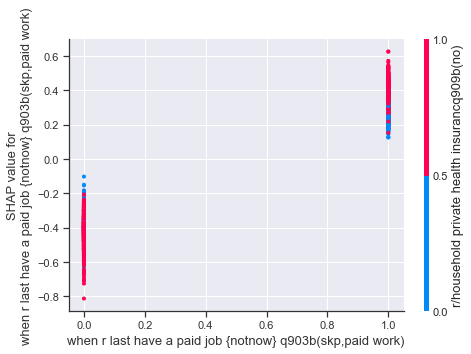

<Figure size 1152x720 with 0 Axes>

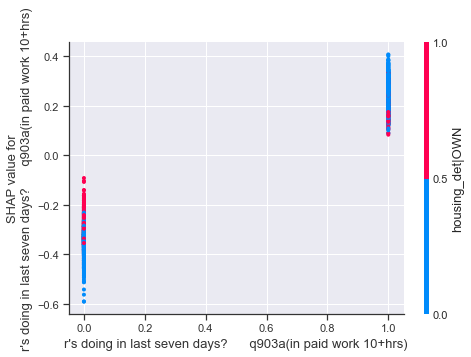

<Figure size 1152x720 with 0 Axes>

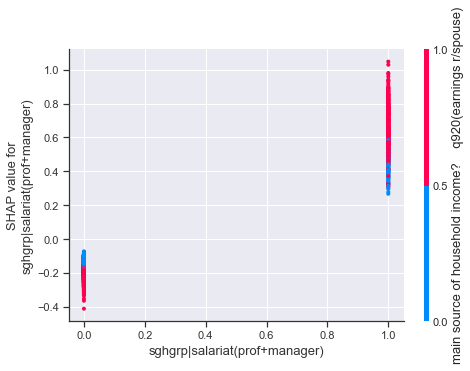

<Figure size 1152x720 with 0 Axes>

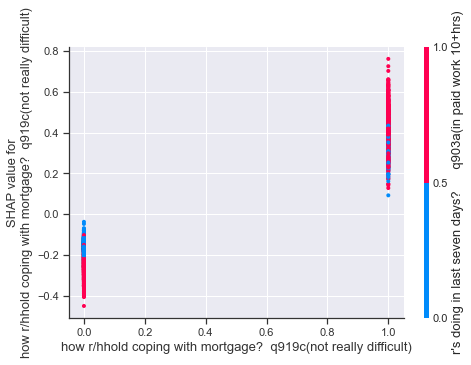

<Figure size 1152x720 with 0 Axes>

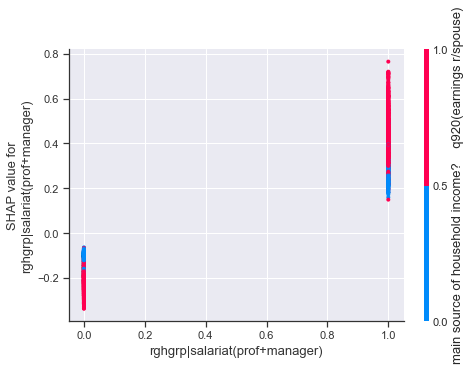

<Figure size 1152x720 with 0 Axes>

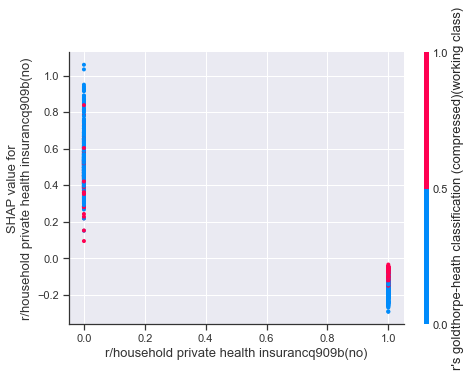

<Figure size 1152x720 with 0 Axes>

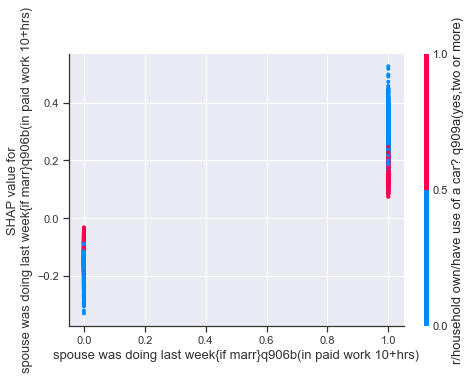

<Figure size 1152x720 with 0 Axes>

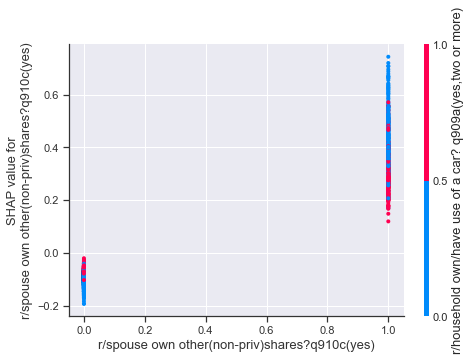

<Figure size 1152x720 with 0 Axes>

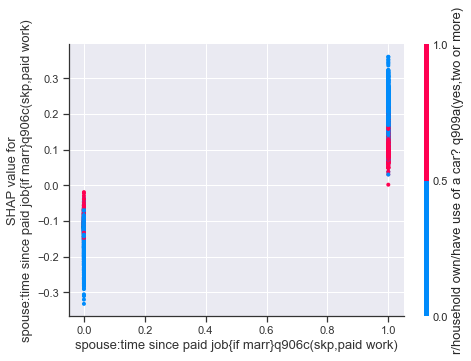

<Figure size 1152x720 with 0 Axes>

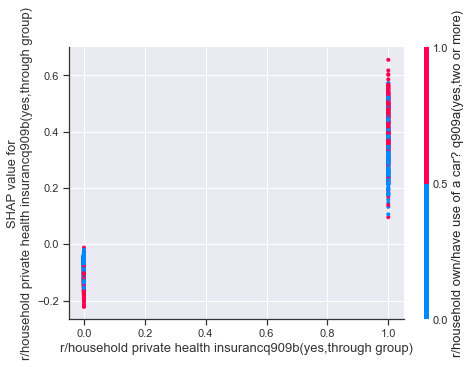

<Figure size 1152x720 with 0 Axes>

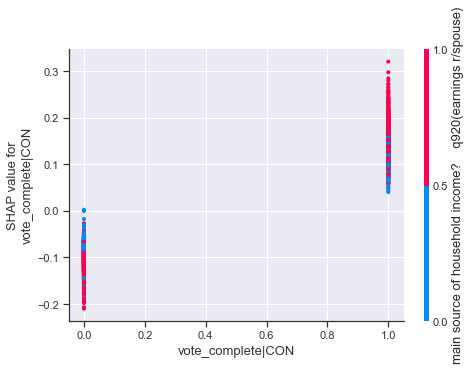

<Figure size 1152x720 with 0 Axes>

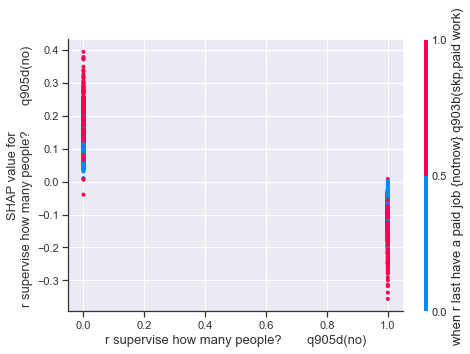

<Figure size 1152x720 with 0 Axes>

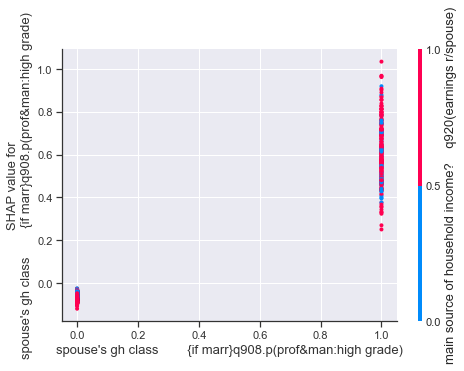

<Figure size 1152x720 with 0 Axes>

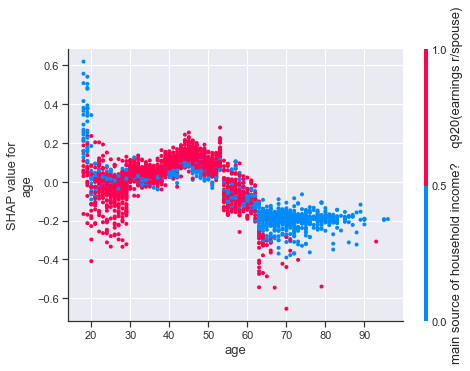

In [828]:
ge = "1992"
harm_vars = ["wt","age","housing_det","vote_complete","inc_det"]
target_var = "inc_det"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "inc_det"
min_features = 10
drop_vars = ["hhincqua",'v921']
drop_std_thresh = 0

alg = get_xgboost_alg(classification_problem=False)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True,alg=alg)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
# use fitted algorithm to predict values
inc_pred = pd.Series(alg.predict(df_pred[train_columns]),index=inc.index).round()
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [922]:
# inc.hist()

In [923]:
# inc_pred.hist()

In [831]:
inc.loc[mask]=inc_pred.loc[mask]
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"inc_det"] = inc

In [835]:
vote_simple = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"].replace(simple_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete_simple"] = vote_simple
vote_simple.value_counts(dropna=False)

bloc_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete_simple"].replace(bloc_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"bloc_complete"] = bloc_complete
bloc_complete.value_counts(dropna=False)

turnout_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"].replace(turnout_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"turnout_complete"] = turnout_complete
turnout_complete.value_counts(dropna=False)

VOTED    3067
DNV       467
Name: vote_complete, dtype: int64

In [836]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge].isnull().sum()

dataset                   0
uid                       0
housing_det              80
housing                   0
inc                     452
vote                      0
year                      0
wt                        0
age                       0
vote_simple               9
bloc                      0
birth_year               49
harmonised_voted          0
inc_det                   0
vote_complete             0
vote_complete_simple      0
bloc_complete             9
turnout_complete          0
dtype: int64

In [837]:
## 97
ge = "1997"

In [838]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge].isnull().sum()

# age 18 m vals
# housing_det 14 m vals, 2 dks
# vote DKs 65
# inc 497


# missing weights??? (not part of electorate???)

dataset                    0
uid                        0
housing_det               14
housing                   14
inc                      497
vote                       0
year                       0
wt                       245
age                       18
vote_simple               19
bloc                       0
birth_year                18
harmonised_voted           0
inc_det                 3615
vote_complete           3615
vote_complete_simple    3615
bloc_complete           3615
turnout_complete        3615
dtype: int64

In [843]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote"].value_counts(dropna=False)

LAB    1367
DNV     766
CON     735
LD      459
SNP     132
DK       65
REF      54
OTH      19
PC       11
GP        7
Name: vote, dtype: int64

In [842]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing"].value_counts(dropna=False)

OWN     2415
RENT    1121
OTH       51
NaN       14
NA        12
DK         2
Name: housing, dtype: int64

In [ ]:
# 97,age

MSE: 44.94, MAE: 5.03, EV: 0.86, R2: 0.86


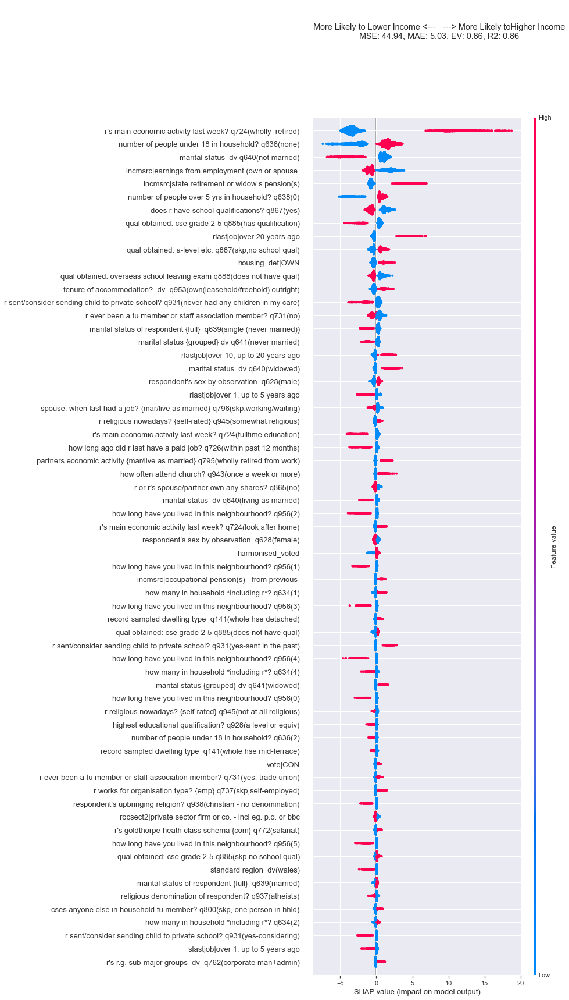

In [857]:
ge = "1997"
age = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"].copy()
mask = age.isnull()

harm_vars = ["wt","age","housing_det","harmonised_voted","inc","vote"]
target_var = "age"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "age"
min_features = 10
drop_std_thresh = 0
drop_vars = ["rage"]


alg = get_xgboost_alg(classification_problem=False)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=True,alg=alg)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
# use fitted algorithm to predict values
age_pred = pd.Series(alg.predict(df_pred[train_columns]),index=age.index).round()
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [861]:
# age.hist()
# age_pred.hist()

In [862]:
age.loc[age.isnull()] = age_pred.loc[age.isnull()]
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"] = age
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"].isnull().sum()

0

In [863]:
# {k:v for k,v in BES_label_list[ge].items() if 'vote' in v.lower()}

In [867]:
housing = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing_det"].replace("DK",np.nan)
# housing.value_counts(dropna=False)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing_det"] = housing.replace("NA",np.nan).replace("OTH",np.nan)
mask = housing.isnull()

ACC: 0.80,  F1: 0.80


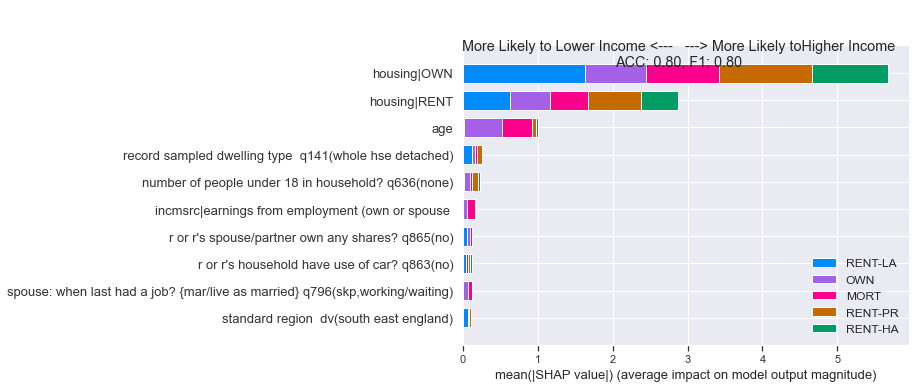

In [870]:
ge = "1997"
harm_vars = ["wt","age","housing_det","harmonised_voted","inc_det","housing"]
target_var = "housing_det"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "housing_det"
min_features = 10
drop_vars = ['tenure1','tenure2']

alg = get_xgboost_alg(classification_problem=True)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds==0].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=True,alg=alg,multi_class_target=True)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
# use fitted algorithm to predict values
housing_pred = pd.Series(alg.predict(df_pred[train_columns]),index=housing.index)
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [871]:
housing.value_counts(dropna=False)

MORT       1436
OWN         979
RENT-LA     710
RENT-PR     262
RENT-HA     149
OTH          51
NaN          16
NA           12
Name: housing_det, dtype: int64

In [872]:
housing_pred.value_counts(dropna=False)

MORT       1520
RENT-LA     908
OWN         898
RENT-PR     256
RENT-HA      33
dtype: int64

In [876]:
housing_pred[mask]#.value_counts(dropna=False)

index
67      RENT-PR
292     RENT-LA
350     RENT-LA
503     RENT-PR
561     RENT-PR
1167    RENT-LA
1196    RENT-LA
1323    RENT-LA
1333    RENT-LA
1392    RENT-LA
1575    RENT-LA
1774    RENT-LA
1957    RENT-PR
1990    RENT-PR
2878    RENT-LA
3321    RENT-LA
dtype: object

In [886]:
housing.loc[mask] = housing_pred.loc[mask]
inst = (BES_df_list[ge]["tenure1"]=="skp,institution")&mask
housing.loc[inst] = "OTH"

f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing_det"] = housing.replace("OTH",np.nan).replace("NA",np.nan)
# mask

In [885]:
# BES_df_list[ge][["tenure1","tenure2","tenurtyp","evrbylah"]][mask]

# agh - most of these blanks are 'institution' tenure!

In [892]:
# 97, vote
ge

'1997'

ACC: 0.95,  F1: 0.95


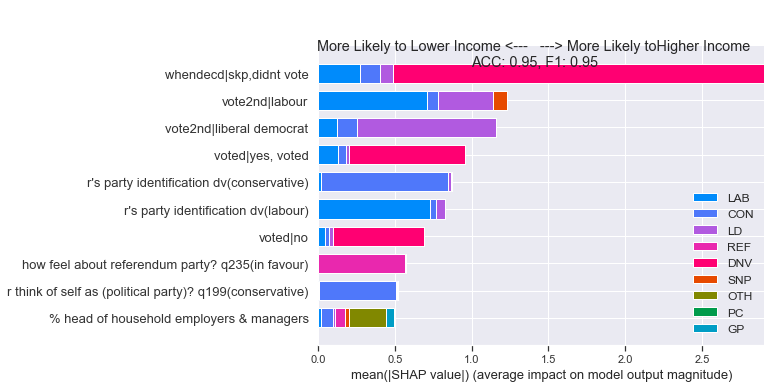

In [917]:
vote_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote"].replace("DK",np.nan)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"] = vote_complete
mask = vote_complete.isnull()

harm_vars = ["wt","age","housing_det","vote_complete","inc"]
target_var = "vote_complete"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "vote_complete"
min_features = 10
drop_std_thresh = 0
drop_vars = ['vote_bes']
             #,'v8a','v15a','v7','v6c']
#     'v8a','v6a','v15b1','v8b','v15b2','v9a','v6b1','v7','v15a','v8c','v6c']
#     'oct115','oct112', # basic vote vars
#              'oct115a','oct115b','oct115c', # vars for 'if you voted con/lab'
#              'oct119','oct119a','oct119b','oct119c','oct119d'] # same for 'voted for libs'
# drop_vars = drop_vars+[k for k,v in BES_label_list[ge].items() if re.search("v7b|what would be your 2nd choice",v.lower())]

alg = get_xgboost_alg(classification_problem=True)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=False,alg=alg,multi_class_target=True)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
# use fitted algorithm to predict values
vote_pred = pd.Series(alg.predict(df_pred[train_columns]),index=vote_complete.index)
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [924]:
# vote_complete.value_counts(dropna=False)
vote_complete.loc[mask] = vote_pred.loc[mask]
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"] = vote_complete
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"].isnull().sum()

0

In [925]:
# vote_pred.value_counts(dropna=False)

In [926]:
# vote_pred[mask].value_counts(dropna=False)

In [927]:
# BES_df_list[ge]['othconst'].value_counts()

In [928]:
# BES_df_list[ge]['othconsn'].value_counts()

In [ ]:
# 97, inc

In [940]:
ge = "1997"
# inc = BES_df_list[ge]["hhincqua"].cat.remove_categories(['refused', "don't   know", 'not     answered']).cat.codes.replace(-1,np.nan)
inc = BES_df_list[ge]["hhincome"].cat.remove_categories(['form not completed','defaced ballot', 'refusal', "don't   know", 'not     answered']).cat.codes.replace(-1,np.nan)
# inc.cat.categories[-3:]
inc.value_counts(dropna=False)
mask = inc.isnull()
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"inc_det"] = inc

MSE: 5.73, MAE: 1.73, EV: 0.72, R2: 0.72


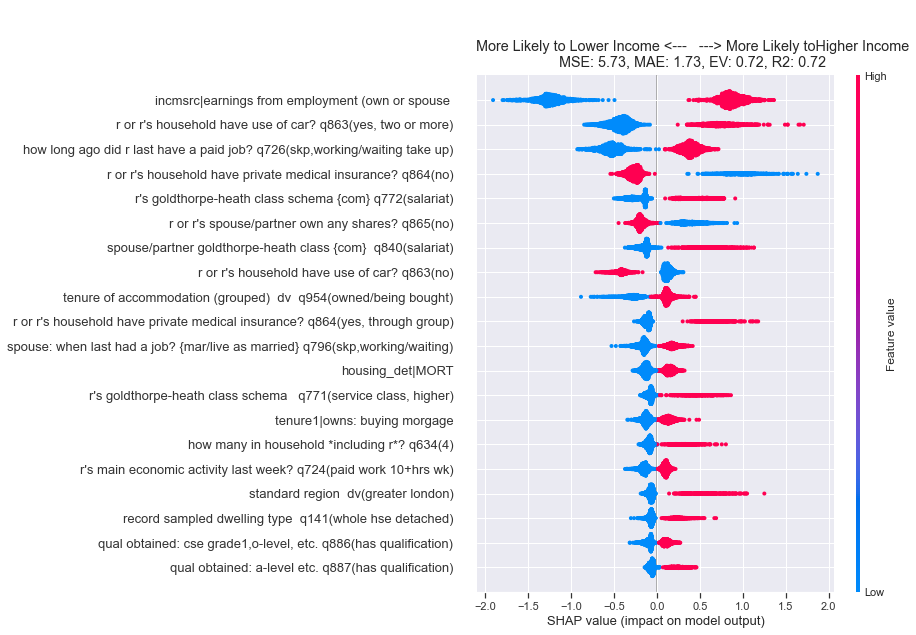

<Figure size 1152x720 with 0 Axes>

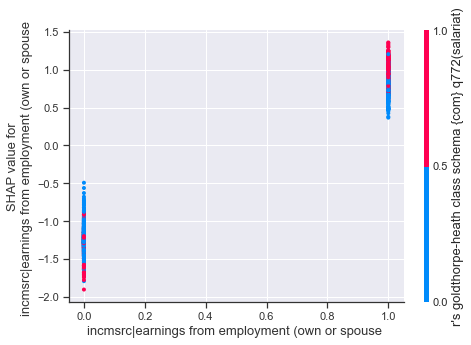

<Figure size 1152x720 with 0 Axes>

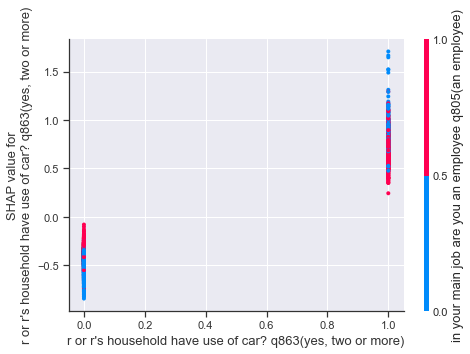

<Figure size 1152x720 with 0 Axes>

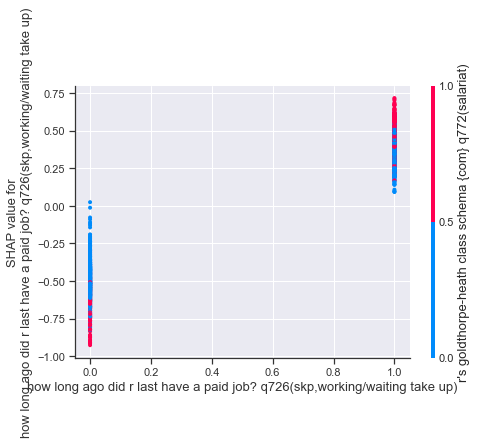

<Figure size 1152x720 with 0 Axes>

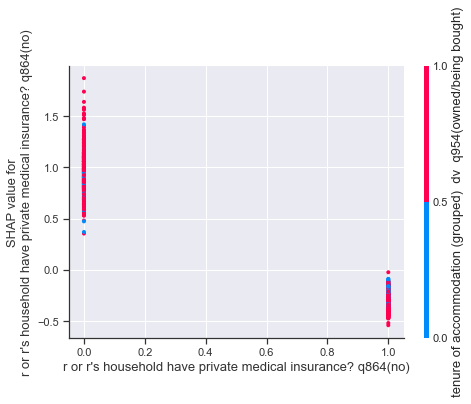

<Figure size 1152x720 with 0 Axes>

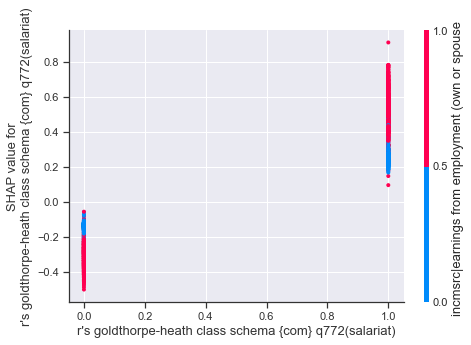

<Figure size 1152x720 with 0 Axes>

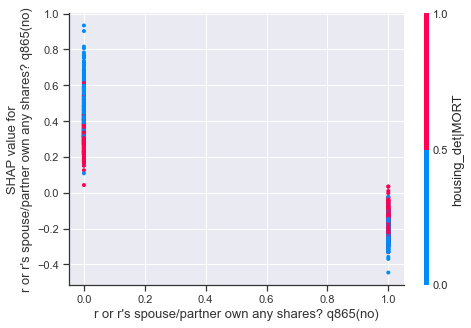

<Figure size 1152x720 with 0 Axes>

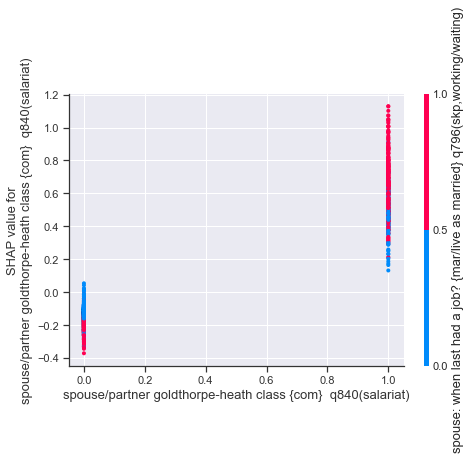

<Figure size 1152x720 with 0 Axes>

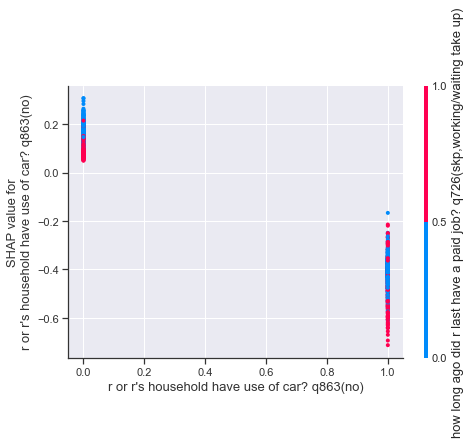

<Figure size 1152x720 with 0 Axes>

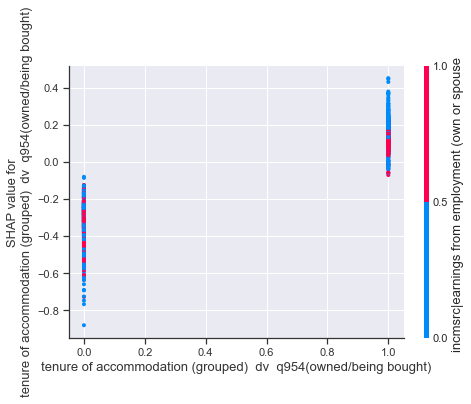

<Figure size 1152x720 with 0 Axes>

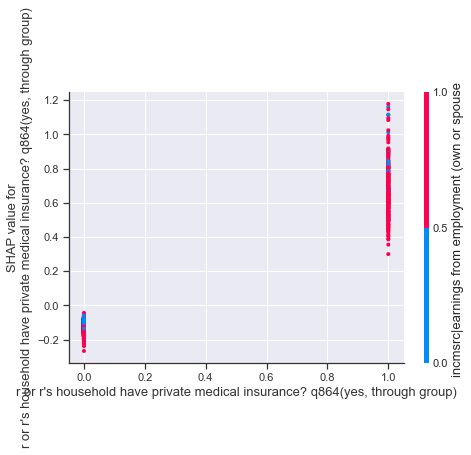

<Figure size 1152x720 with 0 Axes>

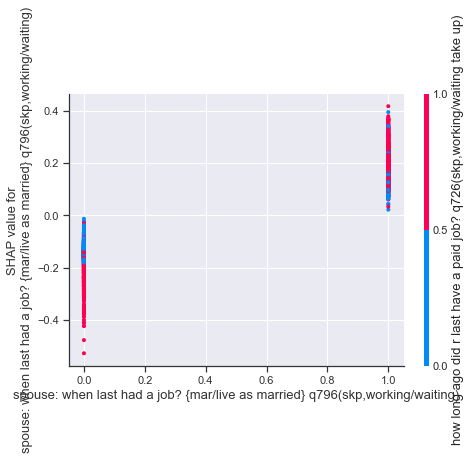

<Figure size 1152x720 with 0 Axes>

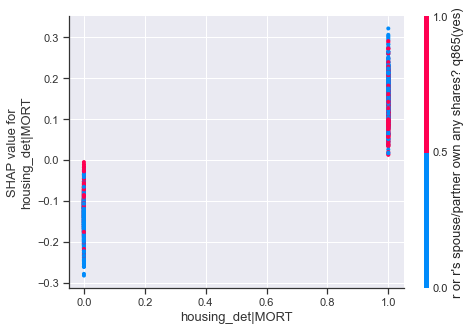

<Figure size 1152x720 with 0 Axes>

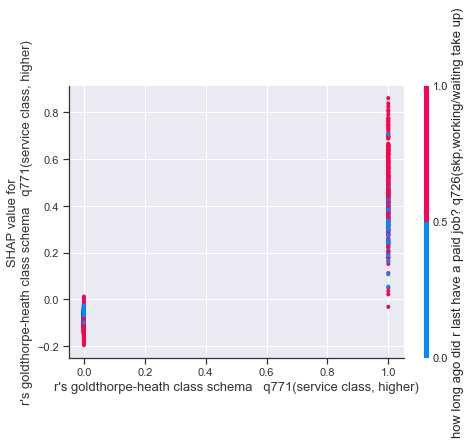

<Figure size 1152x720 with 0 Axes>

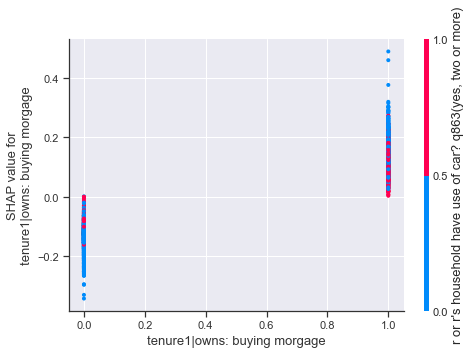

<Figure size 1152x720 with 0 Axes>

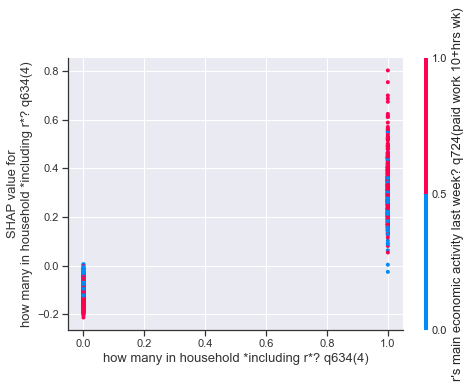

<Figure size 1152x720 with 0 Axes>

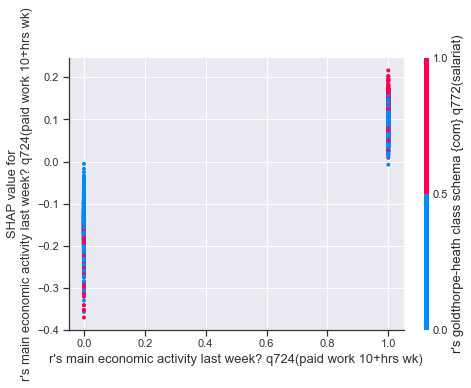

<Figure size 1152x720 with 0 Axes>

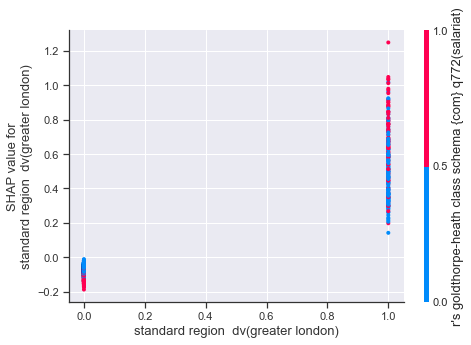

<Figure size 1152x720 with 0 Axes>

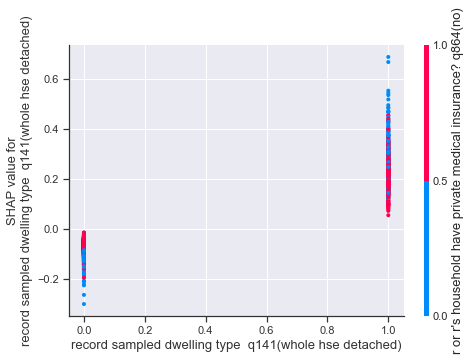

<Figure size 1152x720 with 0 Axes>

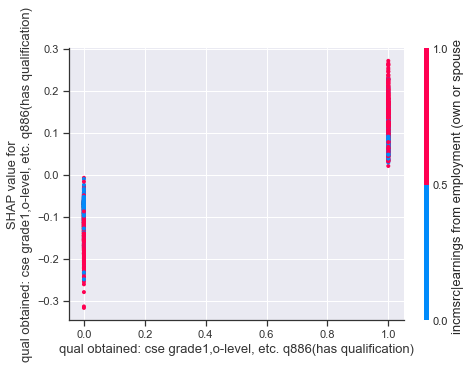

<Figure size 1152x720 with 0 Axes>

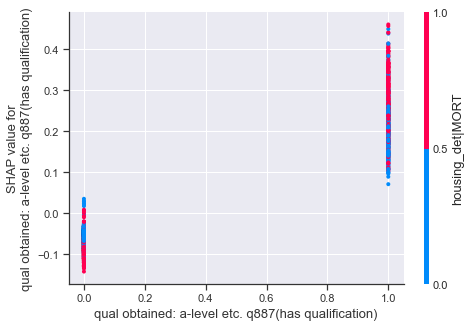

In [947]:
ge = "1997"
harm_vars = ["wt","age","housing_det","vote_complete","inc_det"]
target_var = "inc_det"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "inc_det"
min_features = 10
drop_vars = ["hhincqui",'hhincqua','hhincomb','hhincoma','hhincome']
drop_std_thresh = 0

alg = get_xgboost_alg(classification_problem=False)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True,alg=alg)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
# use fitted algorithm to predict values
inc_pred = pd.Series(alg.predict(df_pred[train_columns]),index=inc.index).round()
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

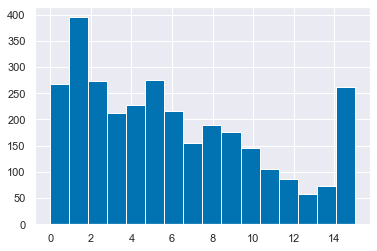

In [948]:
# BES_df_list[ge]["hhincome"].cat.categories[-4:]
inc.hist(bins=16)

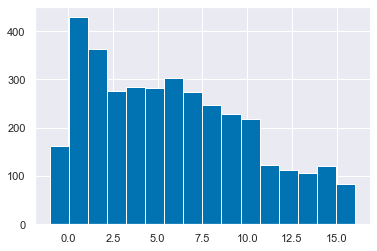

In [949]:
inc_pred.hist(bins=16)

In [951]:
inc.loc[mask]=inc_pred.loc[mask]
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"inc_det"] = inc

In [953]:
vote_simple = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"].replace(simple_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete_simple"] = vote_simple
vote_simple.value_counts(dropna=False)

bloc_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete_simple"].replace(bloc_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"bloc_complete"] = bloc_complete
bloc_complete.value_counts(dropna=False)

turnout_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"].replace(turnout_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"turnout_complete"] = turnout_complete
turnout_complete.value_counts(dropna=False)

VOTED    2848
DNV       767
Name: vote_complete, dtype: int64

In [954]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge].isnull().sum()

dataset                   0
uid                       0
housing_det              77
housing                  14
inc                     497
vote                      0
year                      0
wt                      245
age                       0
vote_simple              19
bloc                      0
birth_year               18
harmonised_voted          0
inc_det                   0
vote_complete             0
vote_complete_simple      0
bloc_complete            19
turnout_complete          0
dtype: int64

In [957]:
f2f_harmonised.to_pickle("E:\\BES_analysis_data\\Face_to_face\\f2f_harmonised.zip", compression='zip')
pickle.dump( BES_label_list, open( "E:\\BES_analysis_data\\Face_to_face\\BES_label_list.pickle", "wb" ) )
pickle.dump( BES_df_list, open( "E:\\BES_analysis_data\\Face_to_face\\BES_df_list.pickle", "wb" ) )

In [989]:
# f2f_harmonised = pd.read_pickle("E:\\BES_analysis_data\\Face_to_face\\f2f_harmonised.zip", compression='zip')

In [958]:
## 2001
ge ="2001"

In [1165]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge].isnull().sum()

# age 15 mvals
# housing_det - no RENT-LA/PR/HA breakdown!!! missing variable!!!!
# wt lot of missing wt vals??
# vote - DKs 951 WTF!!!
# inc - lot of blanks!

dataset                    0
uid                        0
housing_det                0
housing                    0
inc                      812
vote                       0
year                       0
wt                         0
age                        0
vote_simple               29
bloc                       0
birth_year                 8
harmonised_voted           0
inc_det                 3030
vote_complete             81
vote_complete_simple    3030
bloc_complete           3030
turnout_complete        3030
complete_vote              0
dtype: int64

In [963]:
# 2001, age

MSE: 54.41, MAE: 5.82, EV: 0.83, R2: 0.83


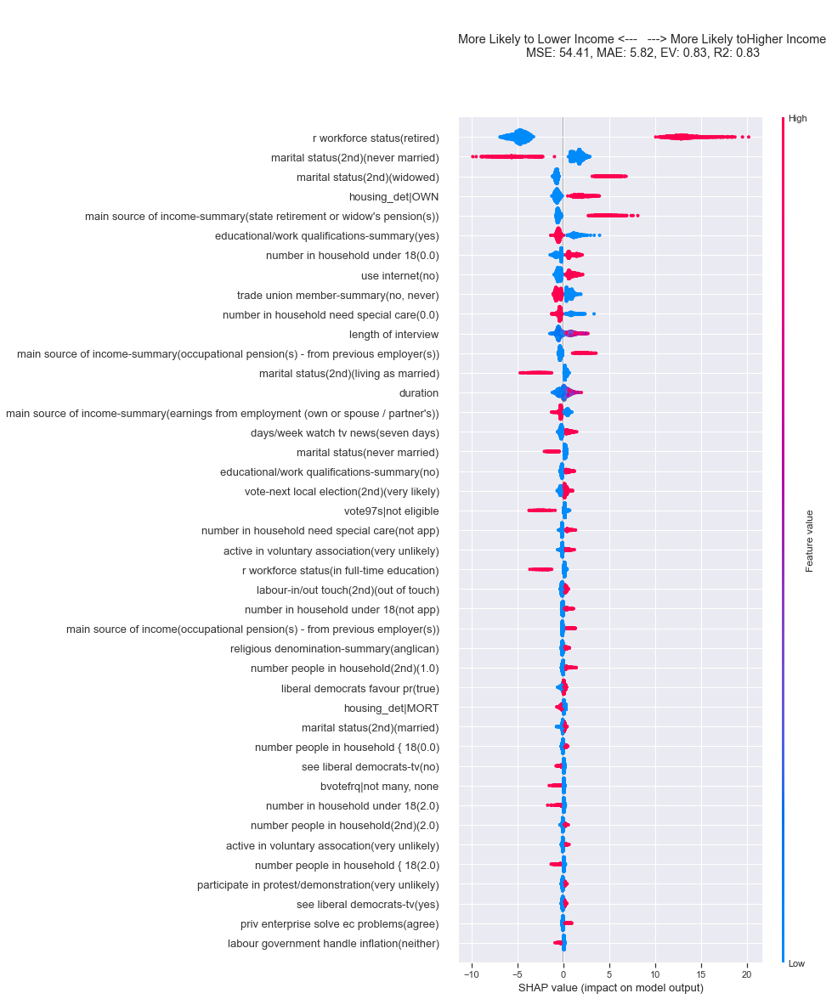

In [990]:
ge = "2001"
age = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"].copy()
mask = age.isnull()

harm_vars = ["wt","age","housing_det","harmonised_voted","inc","vote"]
target_var = "age"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "age"
min_features = 10
drop_std_thresh = 0
drop_vars = ["aq38","bq72","ageall"]


alg = get_xgboost_alg(classification_problem=False)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=False,alg=alg)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
# use fitted algorithm to predict values
age_pred = pd.Series(alg.predict(df_pred[train_columns]),index=age.index).round()
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [984]:
# %debug

In [982]:
multiple_labels = pd.Series(BES_label_list[ge]).value_counts()
multiple_labels = multiple_labels[multiple_labels>1].index
## all 2
{k:v for k,v in BES_label_list[ge].items() if v in multiple_labels}

## fix multiple items with identical labels *so long as there's only ever two entries with same label*

label_list = []
for k,v in BES_label_list[ge].items():
    
    if v in label_list:
        BES_label_list[ge][k] = v+"(2nd)"
    else:
        label_list.append(v)


0

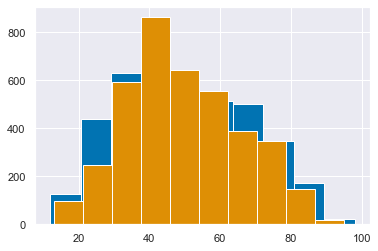

In [995]:
age.hist()
age_pred.hist()
# age_pred[mask].hist()

age.loc[age.isnull()] = age_pred.loc[age.isnull()]
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"] = age
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"].isnull().sum()

In [996]:
# 2001,housing ### missing rent breakdown variable!

'2001'

In [ ]:
# 2001, voting

In [1018]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote"].value_counts(dropna=False)

LAB    1023
DK      951
DNV     827
CON     537
LD      381
SNP     100
PC       39
OTH      29
GP       13
Name: vote, dtype: int64

LAB    1023
DNV     827
CON     537
LD      381
SNP     100
NaN      81
PC       39
OTH      29
GP       13
Name: bq8b, dtype: int64

In [1031]:
BES_df_list[ge]["bq8a"].value_counts(dropna=False)

voted          2203
not app         870
didn't vote     827
Name: bq8a, dtype: int64

In [1030]:
BES_df_list[ge]["aq7a"].value_counts(dropna=False)

decided          1733
not decided      1257
NaN               681
will not vote     215
refused            14
Name: aq7a, dtype: int64

In [1029]:
{k:v for k,v in BES_label_list[ge].items() if "vote" in v.lower()}

{'con01': '% vote conservative 2001',
 'lab01': '% vote labour 2001',
 'ld01': '% vote libdem 2001',
 'snp01': '% vote snp 2001',
 'pc01': '% vote pc 2001',
 'bnp01': '% vote bnp 2001',
 'grn01': '% vote green 2001',
 'ukip01': '% vote uk independence party 2001',
 'oth01': '% vote for other parties 2001',
 'convt01': 'conservative vote 2001',
 'labvt01': 'labour vote 2001',
 'ldvt01': 'liberal democrat vote 2001',
 'snpvt01': 'snp vote 2001',
 'pcvt01': 'plaid cymru vote 2001',
 'ukipvt01': 'uk independence vote 2001',
 'grnvt01': 'green vote 2001',
 'bnpvt01': 'bnp vote 2001',
 'othvt01': 'other vote 2001',
 'totvt01': 'total number of votes 2001',
 'con9701': 'change in the conservative vote 1997-2001',
 'lab9701': 'change in the labour share of the vote 1997-2001',
 'ld9701': 'change in the lib dem share of the vote 1997-2001',
 'turn97': 'votes cast as a proportion of the electorate, 1997',
 'con97': '% conservative vote 1997',
 'lab97': '% vote labour 1997',
 'ld97': '% vote libe

In [1114]:
BES_df_list[ge]["bq8a"].value_counts(dropna=False)

voted          2203
didn't vote     827
not app           0
Name: bq8a, dtype: int64

In [1121]:
# BES_df_list = pickle.load( open( "E:\\BES_analysis_data\\Face_to_face\\BES_df_list.pickle", "rb" ) )

In [1243]:
# temp_f2f.loc[temp_f2f["dataset"]=="2001"].loc[drop_rows.values]

# .shape, drop_rows.shape
#.loc[drop_rows]

In [1113]:
### BUGGED ROWS

## 2001 - drop the part of the dataset *not covered by the post-general election in person survey*
# drop_rows = BES_df_list[ge]["bq8a"][].index
drop_rows = BES_df_list["2001"]["bq8a"]=="not app"



temp_f2f = f2f_harmonised.reset_index().set_index("uid").copy()

# temp_f2f
temp_f2f = temp_f2f.drop(temp_f2f.loc[temp_f2f["dataset"]=="2001"].loc[drop_rows.values].index)

f2f_harmonised = temp_f2f.reset_index().set_index("index")[f2f_harmonised.columns]

BES_df_list[ge] = BES_df_list[ge].loc[f2f_harmonised.loc[f2f_harmonised["dataset"]=="2001"].index]


# BES_df_list[ge] = BES_df_list[ge].drop(  )
# BES_df_list[ge].columns[ BES_df_list[ge].replace("not app",np.nan).replace("not applicable",np.nan).replace(" ",np.nan).isnull().all() ]
# 4 columns with nothing but blanks - not worth effort of dropping!



In [1159]:
ge = "2001"
replace_dict = {"not app":"DNV","conservative":"CON","liberal democrat":"LD","snp":"SNP","greens":"GP","labour":"LAB","plaid cymru":"PC",
 "refused":np.nan,
                         "other [specify]":"OTH"}

BES_df_list[ge]["bq8b"].replace(replace_dict)#.value_counts(dropna=False)
vote_complete = BES_df_list[ge]["bq8b"].replace(replace_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"] = complete_vote
#.replace("OTH",np.nan).replace("GP",np.nan).replace("PC",np.nan).replace("SNP",np.nan)
mask = vote_complete.isnull()


ACC: 0.92,  F1: 0.92


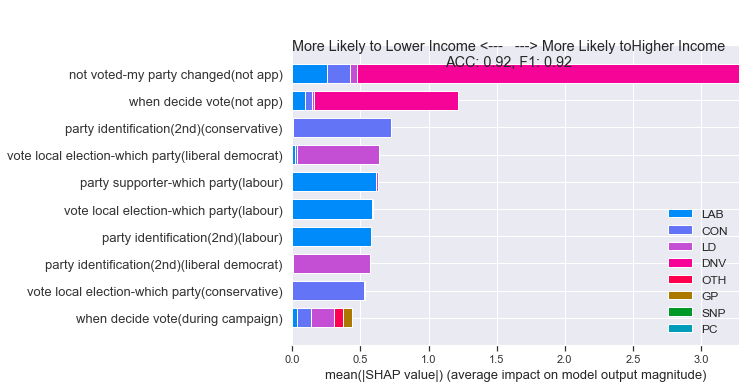

ValueError: Length of passed values is 3030, index implies 3615.

In [1156]:
# vote_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote"].replace("DK",np.nan)
# f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"] = vote_complete
# mask = vote_complete.isnull()

harm_vars = ["wt","age","housing_det","vote_complete","inc"]
target_var = "vote_complete"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "vote_complete"
min_features = 10
drop_std_thresh = 0
drop_vars = ['bq8b']
             #,'v8a','v15a','v7','v6c']
#     'v8a','v6a','v15b1','v8b','v15b2','v9a','v6b1','v7','v15a','v8c','v6c']
#     'oct115','oct112', # basic vote vars
#              'oct115a','oct115b','oct115c', # vars for 'if you voted con/lab'
#              'oct119','oct119a','oct119b','oct119c','oct119d'] # same for 'voted for libs'
# drop_vars = drop_vars+[k for k,v in BES_label_list[ge].items() if re.search("v7b|what would be your 2nd choice",v.lower())]

alg = get_xgboost_alg(classification_problem=True)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=False,alg=alg,multi_class_target=True)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
# use fitted algorithm to predict values
vote_pred = pd.Series(alg.predict(df_pred[train_columns]),index=vote_complete.index)
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [1160]:
vote_pred = pd.Series(alg.predict(df_pred[train_columns]),index=vote_complete.index)

In [1161]:
vote_complete.value_counts(dropna=False)

LAB    1023
DNV     827
CON     537
LD      381
SNP     100
NaN      81
PC       39
OTH      29
GP       13
Name: bq8b, dtype: int64

In [1162]:
vote_pred.value_counts(dropna=False)

LAB    1053
DNV     827
CON     561
LD      399
SNP     111
PC       42
OTH      23
GP       14
dtype: int64

In [1163]:
vote_pred[mask].value_counts(dropna=False)

CON    26
LAB    24
LD     15
SNP     8
PC      6
GP      1
OTH     1
dtype: int64

In [1214]:
vote_complete.loc[mask] = vote_pred.loc[mask]
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"] = vote_complete

In [ ]:
# 2001, inc

In [1194]:
ge = "2001"
# inc = BES_df_list[ge]["hhincqua"].cat.remove_categories(['refused', "don't   know", 'not     answered']).cat.codes.replace(-1,np.nan)
# inc = BES_df_list[ge]["hhincome"].cat.remove_categories(['form not completed','defaced ballot', 'refusal', "don't   know", 'not     answered']).cat.codes.replace(-1,np.nan)
inc = BES_df_list[ge][['aq45','bq78','incomes']].replace("refused",np.nan).replace("don't know",np.nan).fillna(axis=1,method='ffill')["incomes"]
# inc.cat.categories[-3:]
inc = inc.cat.codes.replace(-1,np.nan).astype('float')
inc.value_counts(dropna=False)
mask = inc.isnull()
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"inc_det"] = inc.astype('float')

In [1197]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="2001","inc_det"]
# mask.sum()
# ge
inc
mask.sum()

812

MSE: 3.62, MAE: 1.37, EV: 0.65, R2: 0.65


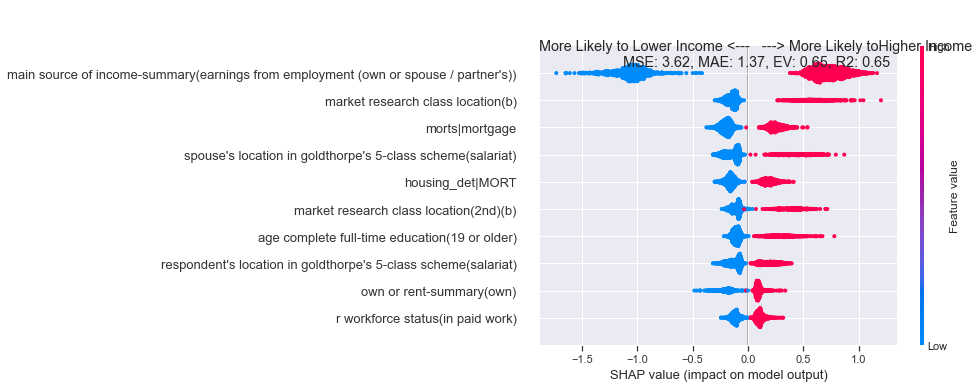

<Figure size 1152x720 with 0 Axes>

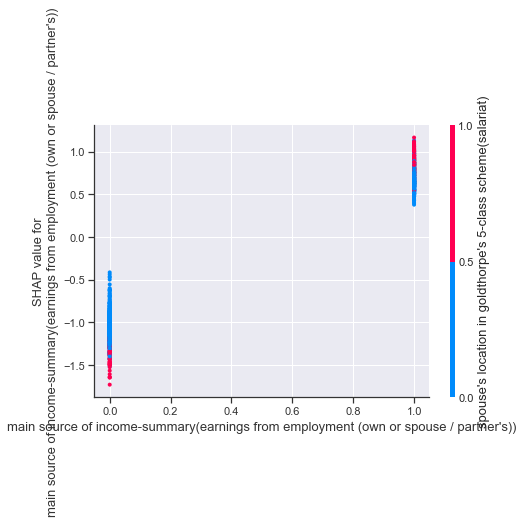

<Figure size 1152x720 with 0 Axes>

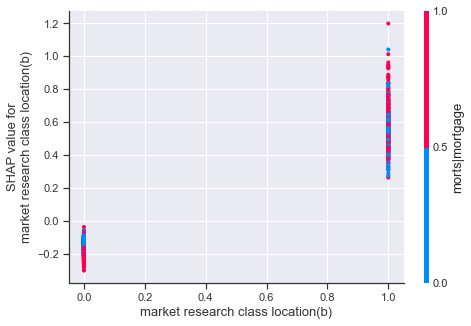

<Figure size 1152x720 with 0 Axes>

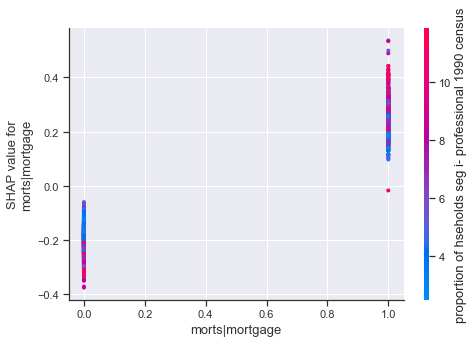

<Figure size 1152x720 with 0 Axes>

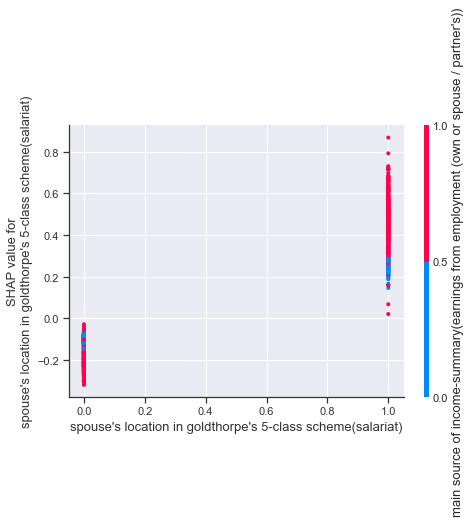

<Figure size 1152x720 with 0 Axes>

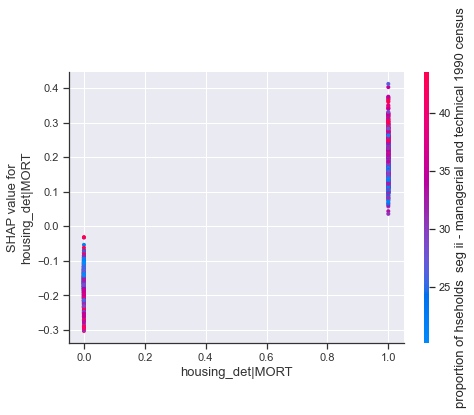

<Figure size 1152x720 with 0 Axes>

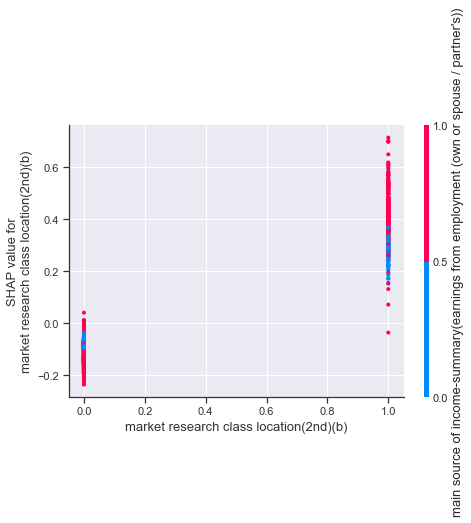

<Figure size 1152x720 with 0 Axes>

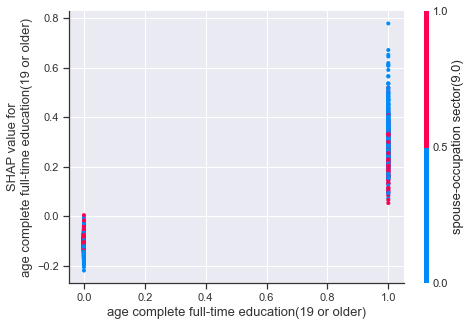

<Figure size 1152x720 with 0 Axes>

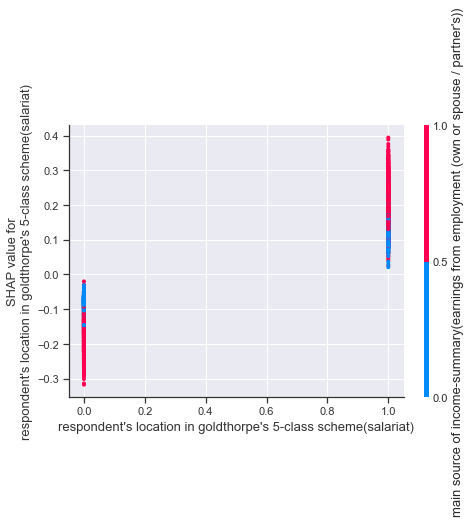

<Figure size 1152x720 with 0 Axes>

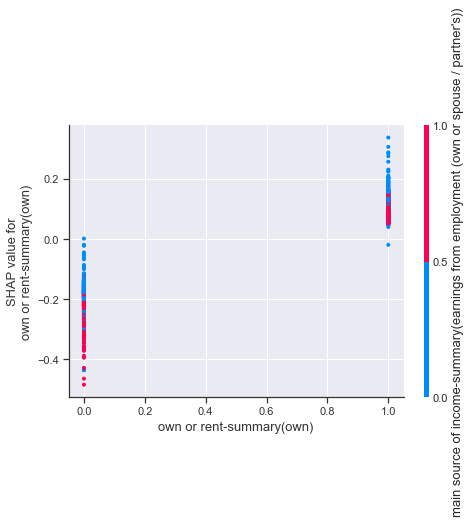

<Figure size 1152x720 with 0 Axes>

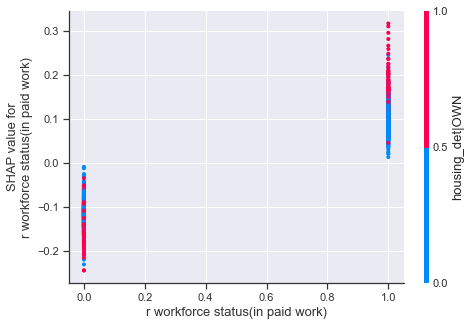

In [1206]:
ge = "2001"
harm_vars = ["wt","age","housing_det","vote_complete","inc_det"]
target_var = "inc_det"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "inc_det"
min_features = 10
drop_vars = ['aq45','bq78','incomes']
drop_std_thresh = 0

alg = get_xgboost_alg(classification_problem=False)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False,alg=alg)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
# use fitted algorithm to predict values
inc_pred = pd.Series(alg.predict(df_pred[train_columns]),index=inc.index).round()
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

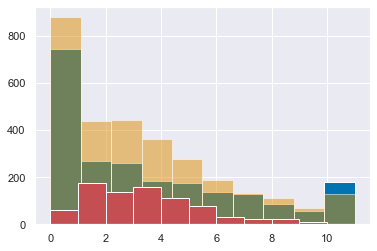

In [1212]:
inc.hist()
inc_pred.hist(alpha=.5)
inc_pred[mask].hist(color='r')

inc.loc[mask] = inc_pred.loc[mask]
f2f_harmonised.loc[f2f_harmonised["dataset"]=="2001","inc_det"] = inc

In [1218]:
f2f_harmonised["inc_det"] = f2f_harmonised["inc_det"].astype('float')

In [1217]:
vote_simple = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"].replace(simple_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete_simple"] = vote_simple
vote_simple.value_counts(dropna=False)

bloc_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete_simple"].replace(bloc_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"bloc_complete"] = bloc_complete
bloc_complete.value_counts(dropna=False)

turnout_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"].replace(turnout_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"turnout_complete"] = turnout_complete
turnout_complete.value_counts(dropna=False)

VOTED    2203
DNV       827
Name: vote_complete, dtype: int64

In [1219]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="2001"].isnull().sum()

dataset                   0
uid                       0
housing_det               0
housing                   0
inc                     812
vote                      0
year                      0
wt                        0
age                       0
vote_simple              29
bloc                      0
birth_year                8
harmonised_voted          0
inc_det                   0
vote_complete             0
vote_complete_simple      0
bloc_complete            30
turnout_complete          0
dtype: int64

In [1233]:
f2f_harmonised.to_pickle("E:\\BES_analysis_data\\Face_to_face\\f2f_harmonised.zip", compression='zip')
pickle.dump( BES_label_list, open( "E:\\BES_analysis_data\\Face_to_face\\BES_label_list.pickle", "wb" ) )
pickle.dump( BES_df_list, open( "E:\\BES_analysis_data\\Face_to_face\\BES_df_list.pickle", "wb" ) )

In [1237]:
BES_df_list = pickle.load( open( "E:\\BES_analysis_data\\Face_to_face\\BES_df_list.pickle", "rb" ) )
f2f_harmonised = pd.read_pickle("E:\\BES_analysis_data\\Face_to_face\\f2f_harmonised.zip", compression='zip')
BES_label_list = pickle.load( open( "E:\\BES_analysis_data\\Face_to_face\\BES_label_list.pickle", "rb" ) )

In [1974]:
## 2005
ge = "2005"

In [1975]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge].isnull().sum()

# age 2! DONE
# wt1202 ????
# housing_det missing values 72, DKs DONE
# votes DK       689
# inc 662 missing vals

dataset                   0
uid                       0
housing_det             101
housing                 101
inc                     527
vote                      0
year                      0
wt                        0
age                       0
vote_simple              36
bloc                      0
birth_year                0
harmonised_voted          0
inc_det                 527
vote_complete             0
vote_complete_simple      0
bloc_complete            36
turnout_complete          0
dtype: int64

In [1248]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing_det"].value_counts(dropna=False)

MORT       1806
OWN        1553
RENT-LA     613
RENT-HA     366
RENT-PR     320
NaN          72
OTH          53
NA            6
DK            2
Name: housing_det, dtype: int64

In [1249]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing"].value_counts(dropna=False)

OWN     3359
RENT    1299
NaN       72
OTH       53
NA         6
DK         2
Name: housing, dtype: int64

In [ ]:
# 2005, age

In [1337]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"]=df_pred["combined age"]
# f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"].isnull().sum()

MSE: 57.82, MAE: 5.47, EV: 0.82, R2: 0.82


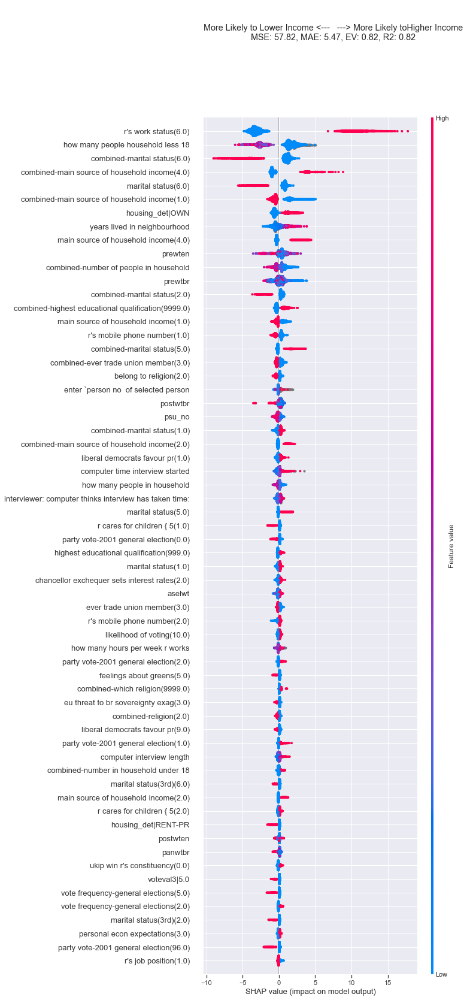

In [1338]:
ge = "2005"
age = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"].copy()
mask = age.isnull()

harm_vars = ["wt","age","housing_det","harmonised_voted","inc","vote"]
target_var = "age"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "age"
min_features = 10
drop_std_thresh = 0
drop_vars = ["aq48","bq77","tq77","cage"]


alg = get_xgboost_alg(classification_problem=False)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=False,alg=alg)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
# use fitted algorithm to predict values
age_pred = pd.Series(alg.predict(df_pred[train_columns]),index=age.index).round()
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [1240]:
# %debug

0

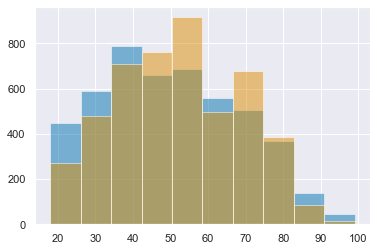

In [1339]:
age.hist(alpha=.5)
age_pred.hist(alpha=.5)
age_pred[mask].hist(alpha=.5,color='r')

age.loc[age.isnull()] = age_pred.loc[age.isnull()]
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"] = age
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"].isnull().sum()

In [1238]:
## BUGGED lables
## fix multiple items with identical labels *so long as there's only ever two entries with same label*

postfixes = ["(2nd)","(3rd)","(4th)","(5th)","(6th)"]

label_dict = {}
for k,v in BES_label_list[ge].items():
    
    if v in label_dict.keys():
        BES_label_list[ge][k] = v+postfixes[label_dict[v]]
        label_dict[v] = label_dict[v]+1
        
    else:
        label_dict[v] = 1
# multiple_labels.head(50)

In [ ]:
# 2005, housing

In [1250]:
housing = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing_det"].replace("DK",np.nan)
# housing.value_counts(dropna=False)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing_det"] = housing.replace("NA",np.nan).replace("OTH",np.nan)
mask = housing.isnull()

In [1366]:
temp = BES_df_list[ge][['tq79a','tq79b','tq79c',]].copy()
#replace(nan_dict).notnull().sum(axis=1)==1
temp['tq79a'] = temp['tq79a'].replace({1:"OWN",2:"RENT",3:"NA",8:"NA",9999:"DK",9:"DK"})

# temp['tq79b'] = 
temp['tq79b'] = temp['tq79b'].replace({1:"OWN",2:"MORT",3:"NA",8:"NA",9999:np.nan,9:np.nan})

temp['tq79c'] = temp['tq79c'].replace({1:"RENT-LA",2:"RENT-HA",3:"RENT-HA",4:"RENT-PR",5:"RENT-PR",6:"RENT-PR",
                7:"OTH",8:"RENT-PR",9:"RENT-HA",10:"OTH",11:"OTH",
                99:np.nan,9999:np.nan,999:np.nan,99:np.nan,98:np.nan,97:"OTH"})

# temp['tq79a'].value_counts()
# temp['tq79c'].value_counts()
# mostly 2, a subset of 330 single notnull values
# BES_df_list[ge][['tq79a','tq79b','tq79c',]][single_vals]
housing = temp.fillna(axis=1,method='ffill')['tq79c']

housing = housing.replace("RENT",np.nan).replace("DK",np.nan)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing_det"] = housing
#.replace("NA",np.nan).replace("OTH",np.nan)
mask = housing.isnull()

ACC: 0.72,  F1: 0.72


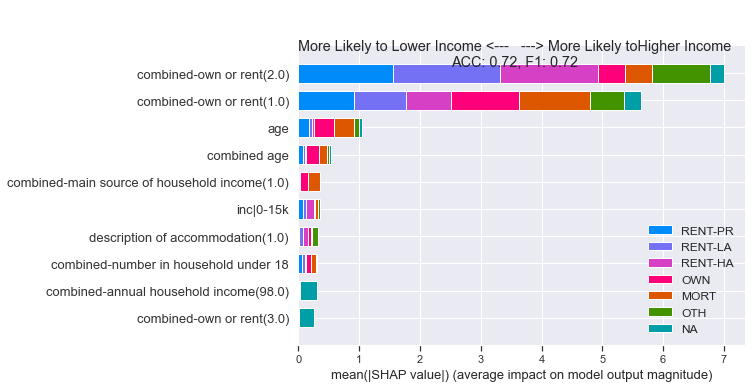

In [1367]:
ge = "2005"
harm_vars = ["wt","age","housing_det","harmonised_voted","inc_det","inc"]#,"housing"
target_var = "housing_det"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "housing_det"
min_features = 10
drop_vars = ['aq50a','aq50b','aq50c','bq79a','bq79b','bq79c','tq79b','tq79c']
#'tq79a',
drop_thresh = 0
#  'aq50a': 'own or rent',
#  'aq50b': 'if own-own outright or mortgage',
#  'aq50c': 'if rent-who rent from',
#  'bq79a': 'own or rent',
#  'bq79b': 'if own-own outright or mortgage',
#  'bq79c': 'if rent-who rent from', 

alg = get_xgboost_alg(classification_problem=True)


# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=True,alg=alg,multi_class_target=True)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
# use fitted algorithm to predict values
housing_pred = pd.Series(alg.predict(df_pred[train_columns]),index=housing.index)
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [1457]:
# df_pred

In [1370]:
housing_pred[mask]#.value_counts(dropna=False)
housing.loc[mask] = housing_pred.loc[mask]
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing_det"] = housing.replace("NA",np.nan).replace("OTH",np.nan)

In [ ]:
# 2005, votes

In [1390]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote"].value_counts()

LAB     1198
DNV     1079
CON      867
LD       645
SNP      137
PC        69
DK        59
UKIP      45
OTH       36
GP        20
BNP        6
Name: vote, dtype: int64

In [1375]:
BES_df_list[ge][["aq10c","bq12b",'bq12a']]

,aq10c,bq12b,bq12a
0,999,999,2
1,999,7,1
2,999,999,99
3,999,999,2
4,2,2,1
...,...,...,...
4786,1,1,1
4787,5,1,1
4788,2,2,1
4789,999,2,1


In [1377]:
BES_df_list[ge]['bq12a'].value_counts()

1     3079
2     1079
99     630
9        3
Name: bq12a, dtype: int64

In [1387]:
BES_df_list[ge]['bq12a'][(BES_df_list[ge]['postwtbr']==0)].value_counts()

99    630
Name: bq12a, dtype: int64

In [1380]:
BES_df_list[ge]['aq10c'][BES_df_list[ge]['bq12a']==99].value_counts()

999    370
1      143
2       67
3       25
4       11
98       4
5        3
8        3
6        2
9        2
Name: aq10c, dtype: int64

In [1383]:
### using wrong weights!

# POSTWTBR
BES_df_list[ge]['postwtbr']==0

0.000000    630
1.828430     93
2.242191     81
1.681694     81
1.785140     79
           ... 
0.693502      1
2.294222      1
2.255767      1
0.818965      1
0.605742      1
Name: postwtbr, Length: 216, dtype: int64

In [1389]:
# BUGGED used wrong wt variable, correct one lines up with the post-election wave respondents

f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"wt"] = BES_df_list[ge]['postwtbr'].replace(0,np.nan)
drop_rows = f2f_harmonised.loc[f2f_harmonised["dataset"]=="2005","wt"].isnull()

temp_f2f = f2f_harmonised.reset_index().set_index("uid").copy()

# temp_f2f
temp_f2f = temp_f2f.drop(temp_f2f.loc[temp_f2f["dataset"]=="2005"].loc[drop_rows.values].index)

f2f_harmonised = temp_f2f.reset_index().set_index("index")[f2f_harmonised.columns]

BES_df_list[ge] = BES_df_list[ge].loc[f2f_harmonised.loc[f2f_harmonised["dataset"]=="2005"].index]


ACC: 0.84,  F1: 0.84


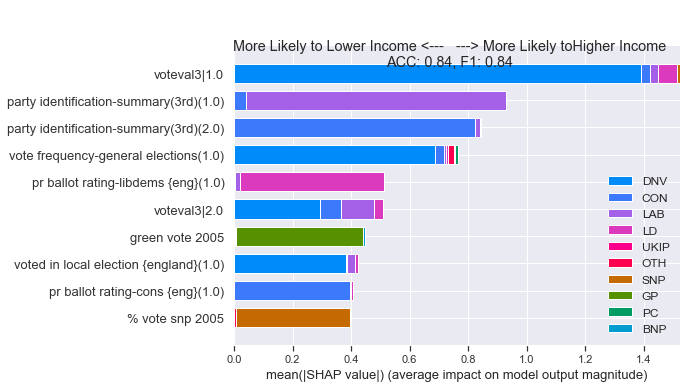

In [1439]:
ge="2005"

vote_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote"].replace("DK",np.nan)
mask = vote_complete.isnull()
vote_complete.loc[(BES_df_list[ge]["vote05"]==10)&mask.values] = "DNV"
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"] = vote_complete
mask = vote_complete.isnull()

harm_vars = ["wt","age","housing_det","vote_complete","inc"]
target_var = "vote_complete"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "vote_complete"
min_features = 10
drop_std_thresh = 0
drop_vars = ["aq10c","bq12b","bq12a","vote05",'bq12c','bq12d','bq13',
            'bq75a1','bq75a2','bq75a3','bq75a4','bq75a5','bq75a6','bq75a7',
            'bq75b1','bq75b2','bq75b3','bq75b4','bq75b5','bq75b6','bq75b7','bq75b8','bq75b9',
            ]+['bq14a1',
 'bq14a2',
 'bq14a3',
 'bq14a4',
 'bq14a5',
 'bq14a6',
 'bq14a7',
 'bq14b',
 'bq14c',
 'bq14d',
 'bq14e']
             #,'v8a','v15a','v7','v6c']
#     'v8a','v6a','v15b1','v8b','v15b2','v9a','v6b1','v7','v15a','v8c','v6c']
#     'oct115','oct112', # basic vote vars
#              'oct115a','oct115b','oct115c', # vars for 'if you voted con/lab'
#              'oct119','oct119a','oct119b','oct119c','oct119d'] # same for 'voted for libs'
# drop_vars = drop_vars+[k for k,v in BES_label_list[ge].items() if re.search("v7b|what would be your 2nd choice",v.lower())]

alg = get_xgboost_alg(classification_problem=True)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=True)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=False,alg=alg,multi_class_target=True)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
# use fitted algorithm to predict values
vote_pred = pd.Series(alg.predict(df_pred[train_columns]),index=vote_complete.index)
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [1440]:
vote_complete.value_counts(dropna=False)

LAB     1198
DNV     1084
CON      867
LD       645
SNP      137
PC        69
NaN       54
UKIP      45
OTH       36
GP        20
BNP        6
Name: vote, dtype: int64

In [1441]:
vote_pred.value_counts(dropna=False)

LAB     1229
DNV     1122
CON      883
LD       655
SNP      130
PC        64
UKIP      37
OTH       26
GP        12
BNP        3
dtype: int64

In [1442]:
vote_pred[mask].value_counts(dropna=False)

LAB     17
CON     14
LD      14
DNV      4
PC       3
UKIP     1
SNP      1
dtype: int64

In [1452]:
vote_complete.loc[mask] = vote_pred[mask]
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"] = vote_complete

In [1453]:
# {k:v for k,v in BES_label_list[ge].items() if "vote" in v}

In [1455]:
# BES_df_list[ge]["vote05"].value_counts()

In [1454]:
# vote_complete.value_counts(dropna=False)

In [1392]:
## BUGGED lables
## fix multiple items with identical labels *so long as there's only ever two entries with same label*

postfixes = ["(2nd)","(3rd)","(4th)","(5th)","(6th)"]

label_dict = {}
for k,v in BES_label_list[ge].items():
    
    if v in label_dict.keys():
        BES_label_list[ge][k] = v+postfixes[label_dict[v]]
        label_dict[v] = label_dict[v]+1
        
    else:
        label_dict[v] = 1
# multiple_labels.head(50)

In [1404]:
## BUGGED LABEL
BES_label_list[ge]["aq48"] = "age_bes"

In [ ]:
# 2005,inc

In [1456]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge].isnull().sum()

dataset                    0
uid                        0
housing_det              101
housing                   57
inc                      527
vote                       0
year                       0
wt                         0
age                        0
vote_simple               36
bloc                       0
birth_year                 1
harmonised_voted           0
inc_det                 4161
vote_complete              0
vote_complete_simple    4161
bloc_complete           4161
turnout_complete        4161
dtype: int64

In [1979]:
ge = "2005"
# inc = BES_df_list[ge]["hhincqua"].cat.remove_categories(['refused', "don't   know", 'not     answered']).cat.codes.replace(-1,np.nan)
# inc = BES_df_list[ge]["hhincome"].cat.remove_categories(['form not completed','defaced ballot', 'refusal', "don't   know", 'not     answered']).cat.codes.replace(-1,np.nan)
# inc = BES_df_list[ge][['aq45','bq78','incomes']].replace("refused",np.nan).replace("don't know",np.nan).fillna(axis=1,method='ffill')["incomes"]
replace_dict = {98:np.nan,99:np.nan,999:np.nan,9999:np.nan}
inc = BES_df_list[ge][["aq55","bq84","tq84"]].replace(replace_dict).fillna(axis=1,method='ffill')["tq84"]
# inc.cat.categories[-3:]
# inc = inc.cat.codes.replace(-1,np.nan).astype('float')
inc=inc-1
inc.value_counts(dropna=False)
mask = inc.isnull()
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"inc_det"] = inc.astype('float')

MSE: 3.99, MAE: 1.50, EV: 0.65, R2: 0.64


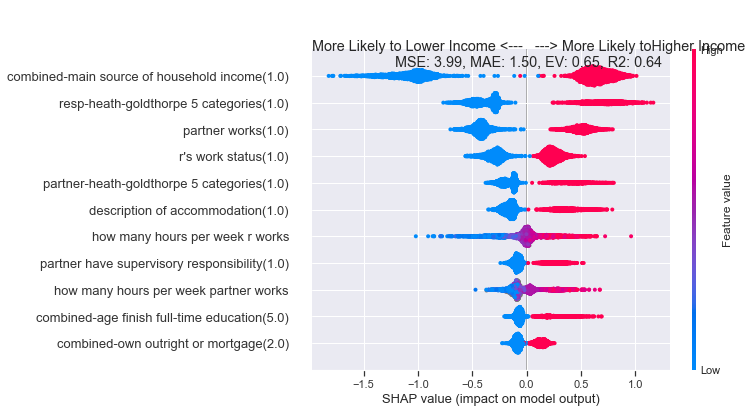

<Figure size 1152x720 with 0 Axes>

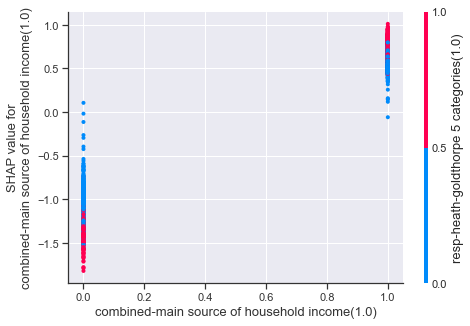

<Figure size 1152x720 with 0 Axes>

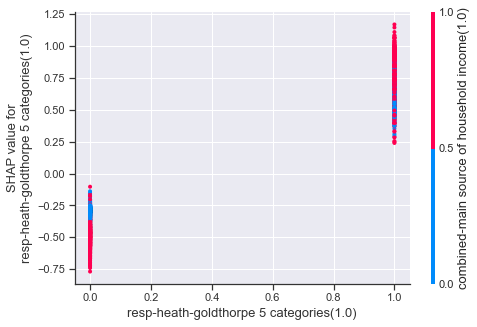

<Figure size 1152x720 with 0 Axes>

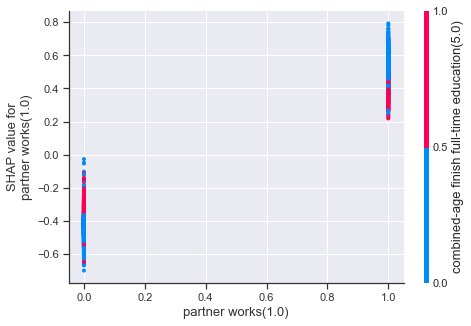

<Figure size 1152x720 with 0 Axes>

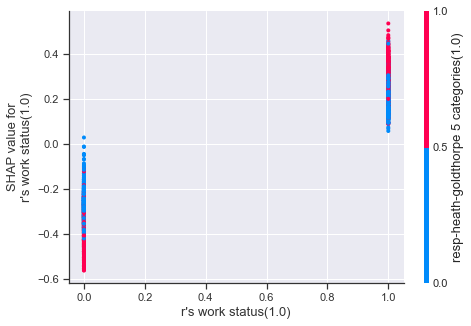

<Figure size 1152x720 with 0 Axes>

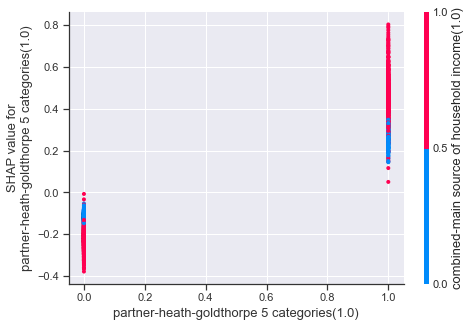

<Figure size 1152x720 with 0 Axes>

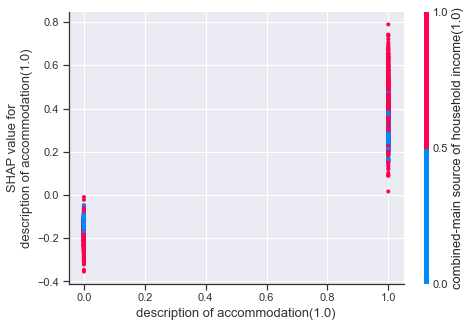

<Figure size 1152x720 with 0 Axes>

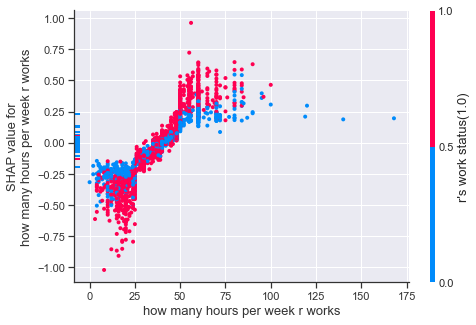

<Figure size 1152x720 with 0 Axes>

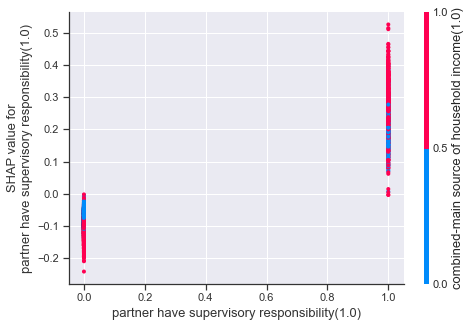

<Figure size 1152x720 with 0 Axes>

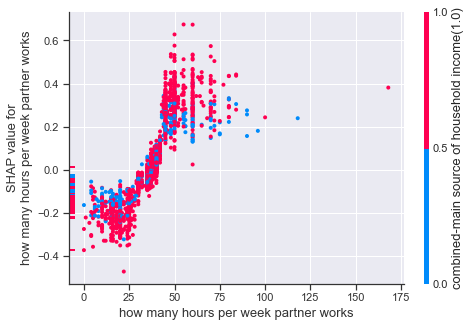

<Figure size 1152x720 with 0 Axes>

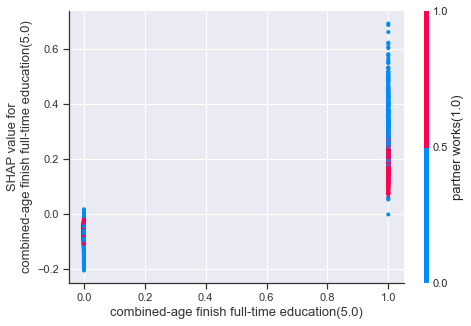

<Figure size 1152x720 with 0 Axes>

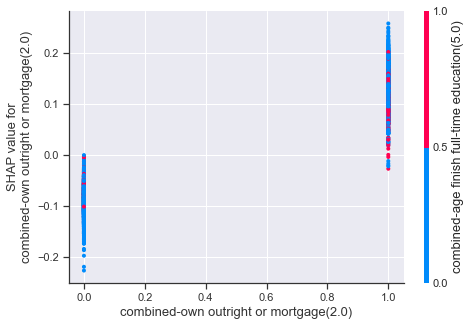

In [1980]:
ge = "2005"
harm_vars = ["wt","age","housing_det","vote_complete","inc_det"]
target_var = "inc_det"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "inc_det"
min_features = 10
drop_vars = ["aq55","bq84","tq84"]
drop_std_thresh = 0

alg = get_xgboost_alg(classification_problem=False)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False,alg=alg)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
# use fitted algorithm to predict values
inc_pred = pd.Series(alg.predict(df_pred[train_columns]),index=inc.index).round()
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

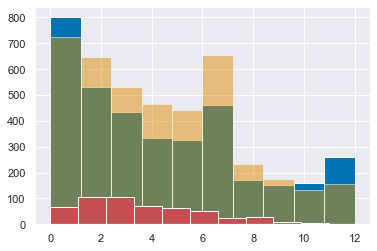

In [1981]:
inc.hist()
inc_pred.hist(alpha=.5)
inc_pred[mask].hist(color='r')

inc.loc[mask] = inc_pred.loc[mask]
f2f_harmonised.loc[f2f_harmonised["dataset"]=="2005","inc_det"] = inc

In [1464]:
vote_simple = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"].replace(simple_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete_simple"] = vote_simple
vote_simple.value_counts(dropna=False)

bloc_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete_simple"].replace(bloc_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"bloc_complete"] = bloc_complete
bloc_complete.value_counts(dropna=False)

turnout_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"].replace(turnout_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"turnout_complete"] = turnout_complete
turnout_complete.value_counts(dropna=False)

VOTED    3073
DNV      1088
Name: vote_complete, dtype: int64

In [1465]:
f2f_harmonised.to_pickle("E:\\BES_analysis_data\\Face_to_face\\f2f_harmonised.zip", compression='zip')
pickle.dump( BES_label_list, open( "E:\\BES_analysis_data\\Face_to_face\\BES_label_list.pickle", "wb" ) )
pickle.dump( BES_df_list, open( "E:\\BES_analysis_data\\Face_to_face\\BES_df_list.pickle", "wb" ) )

In [1485]:
## 2010
ge = "2010"

In [1494]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge].isnull().sum()
# age 9 mvals DONE
# wt 2014 missing values! DONE
# housing_det 21DKs, 40 NaNs
# vote DK      369 -> down to 100
# inc 797

dataset                    0
uid                        0
housing_det               35
housing                   35
inc                      680
vote                       0
year                       0
wt                         0
age                        7
vote_simple               11
bloc                       0
birth_year                 7
harmonised_voted           0
inc_det                 3075
vote_complete           3075
vote_complete_simple    3075
bloc_complete           3075
turnout_complete        3075
dtype: int64

In [1493]:
# BUGGED used wrong wt variable, correct one lines up with the post-election wave respondents

f2f_harmonised.loc[f2f_harmonised["dataset"]=="2010","wt"] = BES_df_list[ge]['postwgt']
drop_rows = f2f_harmonised.loc[f2f_harmonised["dataset"]=="2010","wt"].isnull()

temp_f2f = f2f_harmonised.reset_index().set_index("uid").copy()

# temp_f2f
temp_f2f = temp_f2f.drop(temp_f2f.loc[temp_f2f["dataset"]=="2010"].loc[drop_rows.values].index)

f2f_harmonised = temp_f2f.reset_index().set_index("index")[f2f_harmonised.columns]

BES_df_list[ge] = BES_df_list[ge].loc[f2f_harmonised.loc[f2f_harmonised["dataset"]=="2010"].index]


In [1498]:
postfixes = ["(2nd)","(3rd)","(4th)","(5th)","(6th)"]

label_dict = {}
for k,v in BES_label_list[ge].items():
    
    if v in label_dict.keys():
        BES_label_list[ge][k] = v+postfixes[label_dict[v]]
        label_dict[v] = label_dict[v]+1
        
    else:
        label_dict[v] = 1

In [1496]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote"].value_counts(dropna=False)

CON     815
LAB     731
DNV     678
LD      500
DK      117
SNP     105
UKIP     46
BNP      32
GP       24
PC       16
OTH      11
Name: vote, dtype: int64

In [ ]:
# 2010, age

MSE: 52.26, MAE: 5.67, EV: 0.83, R2: 0.83


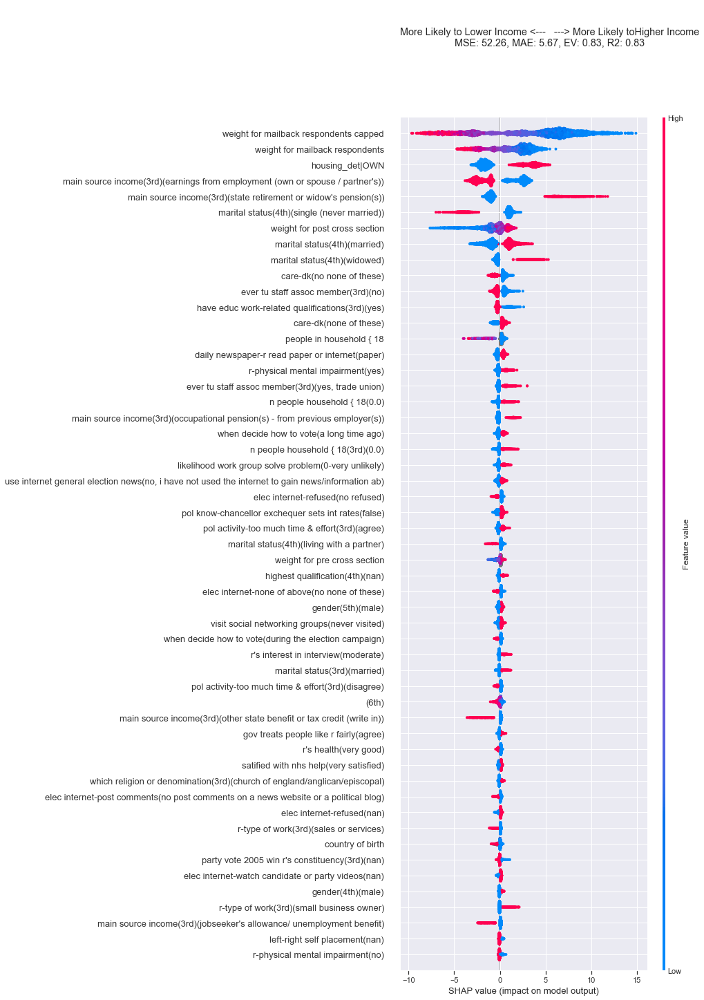

In [1499]:
ge = "2010"
age = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"].copy()
mask = age.isnull()

harm_vars = ["wt","age","housing_det","harmonised_voted","inc","vote"]
target_var = "age"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "age"
min_features = 10
drop_std_thresh = 0
drop_vars = ["aq63","bq89","cq42","zq89"]


alg = get_xgboost_alg(classification_problem=False)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=False,alg=alg)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
# use fitted algorithm to predict values
age_pred = pd.Series(alg.predict(df_pred[train_columns]),index=age.index).round()
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

0

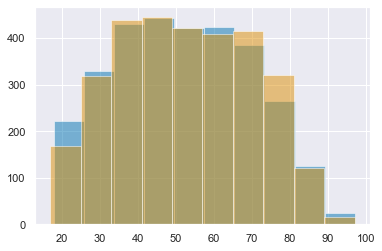

In [1503]:
age.hist(alpha=.5)
age_pred.hist(alpha=.5)
age_pred[mask]

age.loc[age.isnull()] = age_pred.loc[age.isnull()]
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"] = age
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"].isnull().sum()

In [ ]:
## 2010, housing

In [1504]:
housing = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing_det"].replace("DK",np.nan)
# housing.value_counts(dropna=False)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing_det"] = housing
# .replace("NA",np.nan).replace("OTH",np.nan)
mask = housing.isnull()

ACC: 0.74,  F1: 0.74


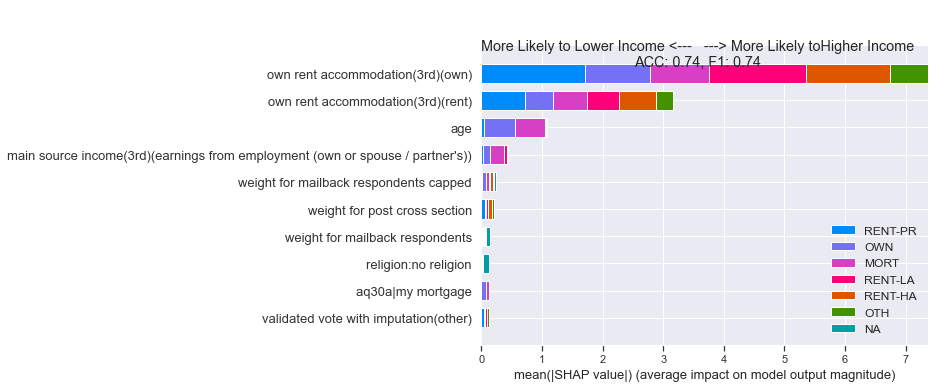

In [1516]:
ge = "2010"
harm_vars = ["wt","age","housing_det","harmonised_voted","inc_det","inc","vote"]#,"housing"
target_var = "housing_det"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "housing_det"
min_features = 10
drop_vars = ['aq65_1','aq65_2','aq65_3','bq93_1','bq93_2','bq93_3','zq93_2','zq93_3']
#'tq79a',
drop_thresh = 0
#  'aq65_1': 'own or rent',
#  'aq65_2': 'own outright or mortgage',
#  'aq65_3': 'rent from whom',
# 'bq93_1': 'own rent accommodation',
# 'bq93_2': 'own outright-mortgage',
# 'bq93_3': 'rent from?',

alg = get_xgboost_alg(classification_problem=True)


# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=False,alg=alg,multi_class_target=True)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
# use fitted algorithm to predict values
housing_pred = pd.Series(alg.predict(df_pred[train_columns]),index=housing.index)
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [1512]:
# {k:v for k,v in BES_label_list[ge].items() if "zq93" in k}

{'zq93_1': 'own rent accommodation(3rd)',
 'zq93_2': 'own outright-mortgage(3rd)',
 'zq93_3': 'rent from?(3rd)'}

In [1524]:
# BES_df_list[ge]["zq93_3"][mask]
housing.loc[mask] = housing_pred.loc[mask]
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing_det"] = housing.replace("OTH",np.nan).replace("NA",np.nan)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing_det"].isnull().sum()

39

In [ ]:
# 2010, votes

In [1526]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote"].value_counts(dropna=False)

CON     815
LAB     731
DNV     678
LD      500
DK      117
SNP     105
UKIP     46
BNP      32
GP       24
PC       16
OTH      11
Name: vote, dtype: int64

ACC: 0.92,  F1: 0.92


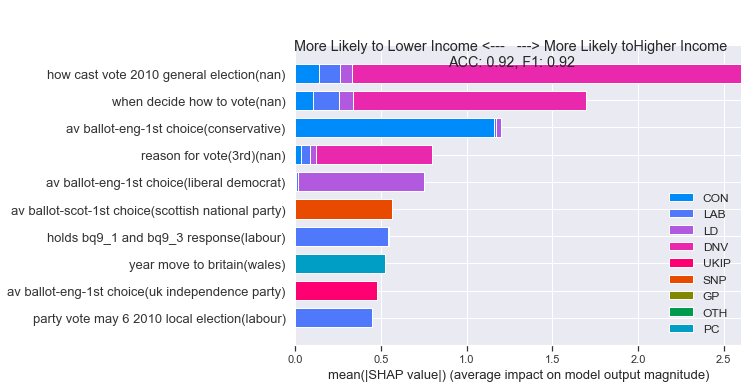

In [1535]:
vote_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote"].replace("DK",np.nan)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"] = vote_complete.replace("BNP",np.nan)
mask = vote_complete.isnull()

harm_vars = ["wt","age","housing_det","vote_complete","inc"]
target_var = "vote_complete"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "vote_complete"
min_features = 10
drop_std_thresh = 0
drop_vars = ["aq11_3","bq12_2","bq12_1"]
#     'v9a','v7a','v7b','v8','v9b','v10a','v10b',
#              'v7b_1','v7b_2','v7b_3','v7b_4','v7b_5','v7b_6','v7b_7','v7b_8','v7b_9','v7b_10','v7b_11','v7b_12','v7b_13']
             #,'v8a','v15a','v7','v6c']
#     'v8a','v6a','v15b1','v8b','v15b2','v9a','v6b1','v7','v15a','v8c','v6c']
#     'oct115','oct112', # basic vote vars
#              'oct115a','oct115b','oct115c', # vars for 'if you voted con/lab'
#              'oct119','oct119a','oct119b','oct119c','oct119d'] # same for 'voted for libs'
# drop_vars = drop_vars+[k for k,v in BES_label_list[ge].items() if re.search("v7b|what would be your 2nd choice",v.lower())]

alg = get_xgboost_alg(classification_problem=True)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=False,alg=alg,multi_class_target=True)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
# use fitted algorithm to predict values
vote_pred = pd.Series(alg.predict(df_pred[train_columns]),index=vote_complete.index)
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [1528]:
{k:v for k,v in BES_label_list[ge].items() if "how cast vote" in v.lower()}

{'bq13': 'how cast vote 2010 general election'}

In [1536]:
BES_df_list[ge]['bq13'][mask].value_counts(dropna=False)

in person                                     88
by post                                       23
NaN                                            5
do not want to answer                          1
by proxy (someone else voted on my behalf)     0
Name: bq13, dtype: int64

In [1537]:
vote_complete.value_counts(dropna=False)

CON     815
LAB     731
DNV     678
LD      500
NaN     117
SNP     105
UKIP     46
BNP      32
GP       24
PC       16
OTH      11
Name: vote, dtype: int64

In [1538]:
vote_pred.value_counts(dropna=False)

CON     885
LAB     778
DNV     684
LD      535
SNP     111
UKIP     48
GP       18
PC       14
OTH       2
dtype: int64

In [1539]:
vote_pred[mask].value_counts(dropna=False)

LAB     43
CON     29
LD      24
SNP      9
DNV      6
UKIP     4
GP       1
PC       1
dtype: int64

In [1540]:
vote_complete.loc[mask] = vote_pred.loc[mask]
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"] = vote_complete

In [ ]:
# 2010, inc

In [1629]:
ge = "2010"
# inc = BES_df_list[ge]["hhincqua"].cat.remove_categories(['refused', "don't   know", 'not     answered']).cat.codes.replace(-1,np.nan)
# inc = BES_df_list[ge]["hhincome"].cat.remove_categories(['form not completed','defaced ballot', 'refusal', "don't   know", 'not     answered']).cat.codes.replace(-1,np.nan)
# inc = BES_df_list[ge][['aq45','bq78','incomes']].replace("refused",np.nan).replace("don't know",np.nan).fillna(axis=1,method='ffill')["incomes"]
# replace_dict = {98:np.nan,99:np.nan,999:np.nan,9999:np.nan}
# inc = BES_df_list[ge][["aq55","bq84","tq84"]].replace(replace_dict).fillna(axis=1,method='ffill')["tq84"]
inc = BES_df_list[ge][["aq70","bq96","zq96"]].fillna(method='ffill',axis=1)["zq96"].cat.codes.replace(-1,np.nan)
# inc.cat.categories[-3:]
# inc = inc.cat.codes.replace(-1,np.nan).astype('float')
inc.value_counts(dropna=False)
mask = inc.isnull()
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"inc_det"] = inc.astype('float')

MSE: 7.17, MAE: 2.05, EV: 0.53, R2: 0.53


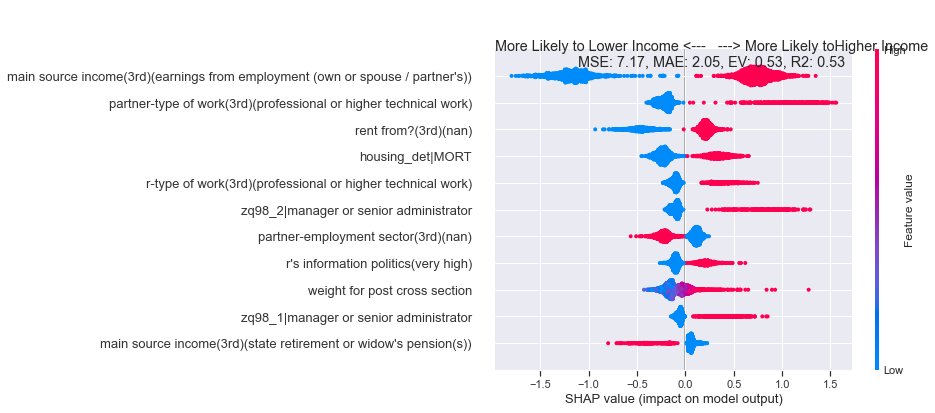

<Figure size 1152x720 with 0 Axes>

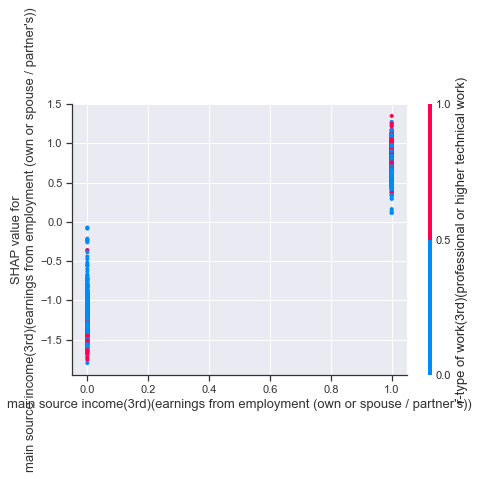

<Figure size 1152x720 with 0 Axes>

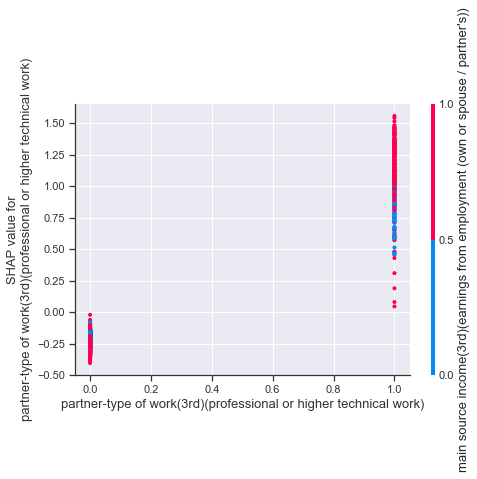

<Figure size 1152x720 with 0 Axes>

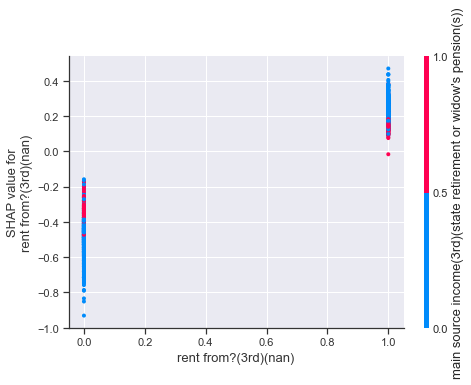

<Figure size 1152x720 with 0 Axes>

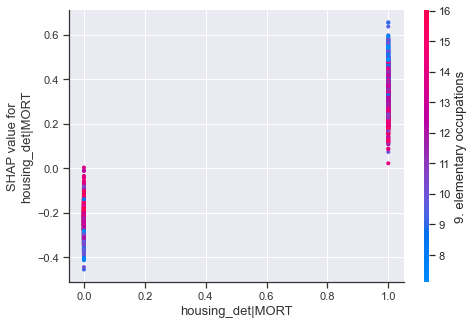

<Figure size 1152x720 with 0 Axes>

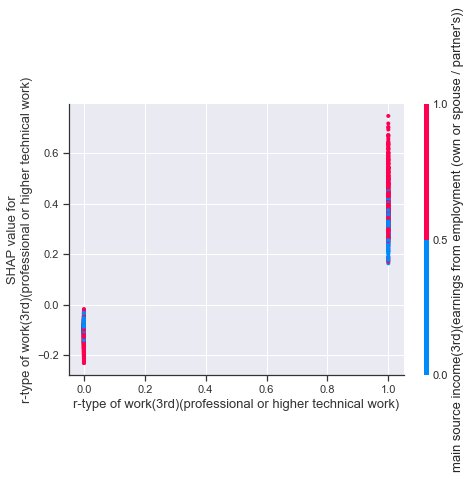

<Figure size 1152x720 with 0 Axes>

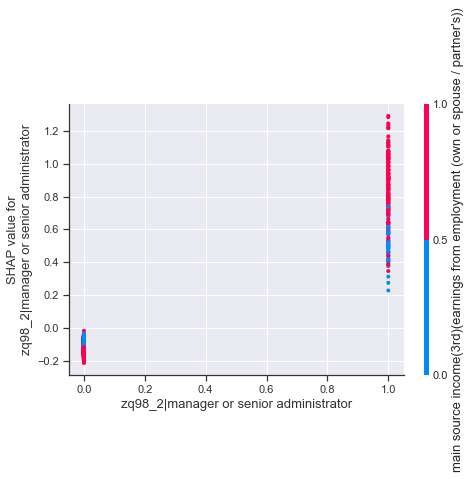

<Figure size 1152x720 with 0 Axes>

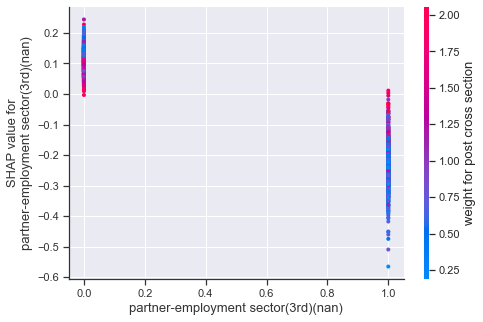

<Figure size 1152x720 with 0 Axes>

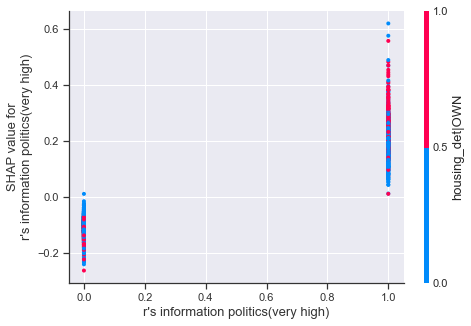

<Figure size 1152x720 with 0 Axes>

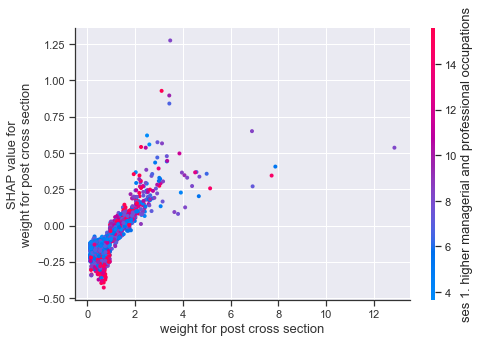

<Figure size 1152x720 with 0 Axes>

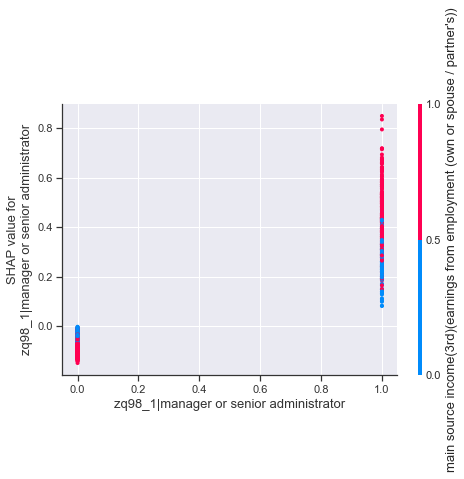

<Figure size 1152x720 with 0 Axes>

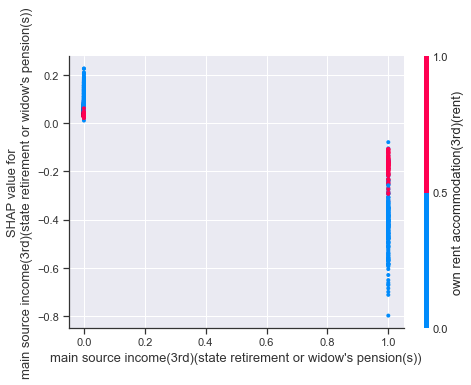

In [1630]:
ge = "2010"
harm_vars = ["wt","age","housing_det","vote_complete","inc_det"]
target_var = "inc_det"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "inc_det"
min_features = 10
drop_vars = ["aq70","bq96","zq96"]
drop_std_thresh = 0

alg = get_xgboost_alg(classification_problem=False)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False,alg=alg)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
# use fitted algorithm to predict values
inc_pred = pd.Series(alg.predict(df_pred[train_columns]),index=inc.index).round()
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

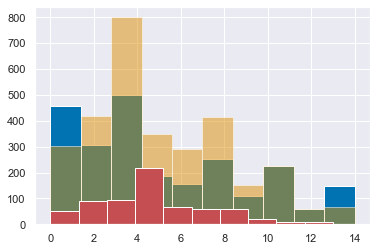

In [1631]:
inc.hist()
inc_pred.hist(alpha=.5)
inc_pred[mask].hist(color='r')

inc.loc[mask] = inc_pred.loc[mask]
f2f_harmonised.loc[f2f_harmonised["dataset"]=="2010","inc_det"] = inc

In [1632]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="2010","inc_det"].isnull().sum()

0

In [1633]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="2005","inc_det"].isnull().sum()

0

In [1549]:
vote_simple = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"].replace(simple_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete_simple"] = vote_simple
vote_simple.value_counts(dropna=False)

bloc_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete_simple"].replace(bloc_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"bloc_complete"] = bloc_complete
bloc_complete.value_counts(dropna=False)

turnout_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"].replace(turnout_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"turnout_complete"] = turnout_complete
turnout_complete.value_counts(dropna=False)

VOTED    2391
DNV       684
Name: vote_complete, dtype: int64

In [1554]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge].isnull().sum()

dataset                   0
uid                       0
housing_det              39
housing                  35
inc                     680
vote                      0
year                      0
wt                        0
age                       0
vote_simple              11
bloc                      0
birth_year                7
harmonised_voted          0
inc_det                   0
vote_complete             0
vote_complete_simple      0
bloc_complete            11
turnout_complete          0
dtype: int64

In [1559]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="2005"].isnull().sum()

dataset                   0
uid                       0
housing_det             101
housing                  57
inc                     527
vote                      0
year                      0
wt                        0
age                       0
vote_simple              36
bloc                      0
birth_year                1
harmonised_voted          0
inc_det                   0
vote_complete             0
vote_complete_simple      0
bloc_complete            36
turnout_complete          0
dtype: int64

In [1560]:
f2f_harmonised.loc[f2f_harmonised["dataset"]=="2010"].isnull().sum()

dataset                   0
uid                       0
housing_det              39
housing                  35
inc                     680
vote                      0
year                      0
wt                        0
age                       0
vote_simple              11
bloc                      0
birth_year                7
harmonised_voted          0
inc_det                   0
vote_complete             0
vote_complete_simple      0
bloc_complete            11
turnout_complete          0
dtype: int64

In [1561]:
f2f_harmonised.to_pickle("E:\\BES_analysis_data\\Face_to_face\\f2f_harmonised.zip", compression='zip')
pickle.dump( BES_label_list, open( "E:\\BES_analysis_data\\Face_to_face\\BES_label_list.pickle", "wb" ) )
pickle.dump( BES_df_list, open( "E:\\BES_analysis_data\\Face_to_face\\BES_df_list.pickle", "wb" ) )

In [1562]:
# 2015
ge = "2015"

In [1564]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge].isnull().sum()

# age 32 mvals
# wt 224 mvals?? hmm - real choice wt_vote for wt_demog ... leave as is so possible to change later
# housing_det DK = 21 DONE
# votes DK = 110 DONE
# inc 750

dataset                    0
uid                        0
housing_det                0
housing                    0
inc                      750
vote                       0
year                       0
wt                       224
age                       32
vote_simple               12
bloc                       0
birth_year                32
harmonised_voted           0
inc_det                 2987
vote_complete           2987
vote_complete_simple    2987
bloc_complete           2987
turnout_complete        2987
dtype: int64

In [1575]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing_det"].value_counts(dropna=False)

OWN        1086
MORT        846
RENT-PR     428
RENT-LA     361
RENT-HA     236
DK           29
NA            1
Name: housing_det, dtype: int64

In [1576]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing"].value_counts(dropna=False)

OWN     1932
RENT    1025
DK        29
NA         1
Name: housing, dtype: int64

In [ ]:
# 2015, age

MSE: 47.99, MAE: 5.48, EV: 0.86, R2: 0.86


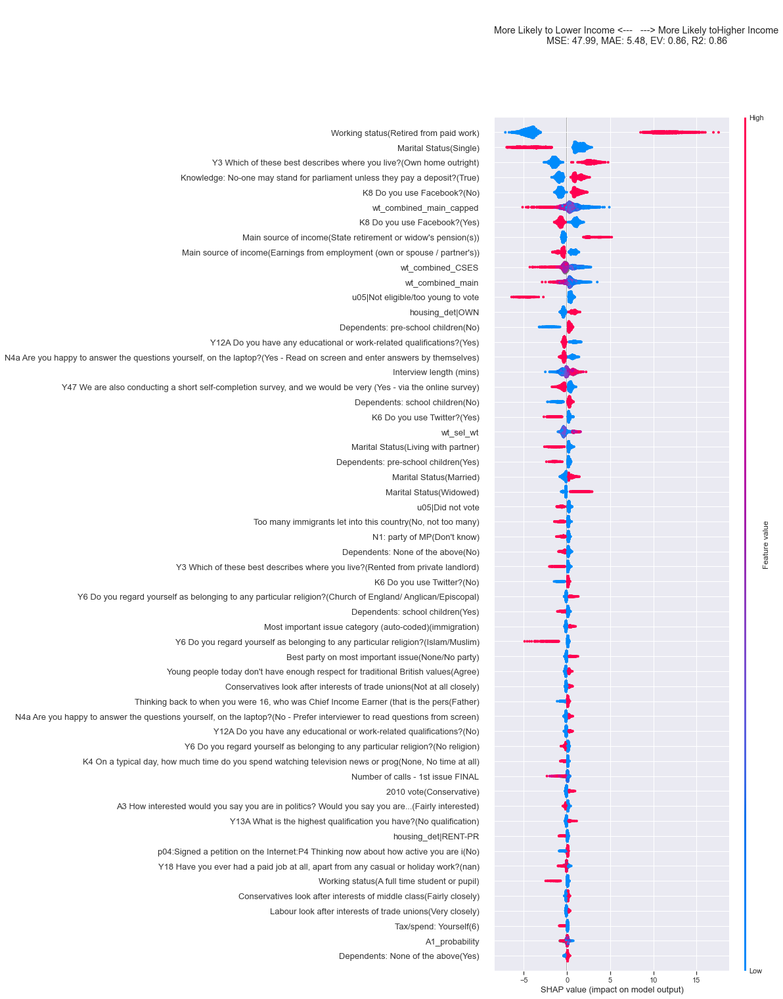

In [1577]:
ge = "2015"
age = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"].copy()
mask = age.isnull()

harm_vars = ["wt","age","housing_det","harmonised_voted","inc","vote"]
target_var = "age"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "age"
min_features = 10
drop_std_thresh = 0
drop_vars = ["Age"]


alg = get_xgboost_alg(classification_problem=False)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=False,alg=alg)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
# use fitted algorithm to predict values
age_pred = pd.Series(alg.predict(df_pred[train_columns]),index=age.index).round()
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

0

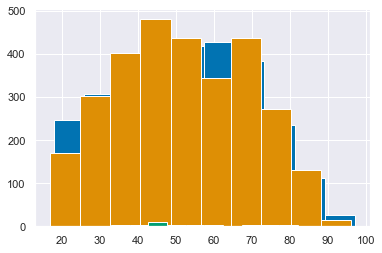

In [1579]:
age.hist()
age_pred.hist()
age_pred[mask].hist()

age.loc[age.isnull()] = age_pred.loc[age.isnull()]
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"] = age
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"].isnull().sum()

In [1582]:
# 2015, housing
ge

'2015'

In [1589]:
housing = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing_det"].replace("DK",np.nan)
# housing.value_counts(dropna=False)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing_det"] = housing.replace("NA",np.nan).astype('category')
# .replace("NA",np.nan).replace("OTH",np.nan)
mask = housing.isnull()

ACC: 0.61,  F1: 0.61


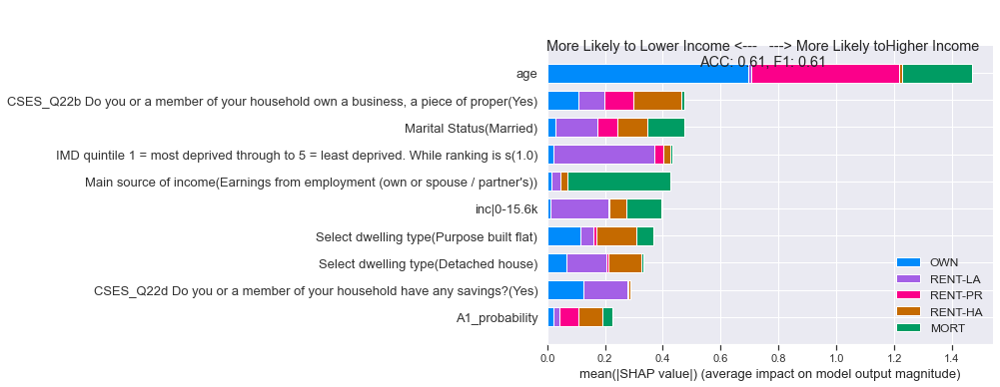

In [1597]:
ge = "2015"
harm_vars = ["wt","age","housing_det","harmonised_voted","inc_det","inc","vote"]#,"housing"
target_var = "housing_det"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "housing_det"
min_features = 10
drop_vars = ['y03','Int_fin_time']
#'tq79a',
drop_thresh = 0
#  'aq65_1': 'own or rent',
#  'aq65_2': 'own outright or mortgage',
#  'aq65_3': 'rent from whom',
# 'bq93_1': 'own rent accommodation',
# 'bq93_2': 'own outright-mortgage',
# 'bq93_3': 'rent from?',

alg = get_xgboost_alg(classification_problem=True)


# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=False,alg=alg,multi_class_target=True)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
# use fitted algorithm to predict values
housing_pred = pd.Series(alg.predict(df_pred[train_columns]),index=housing.index)
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [1602]:
# housing.value_counts()
# housing_pred.value_counts()
# housing_pred[mask].value_counts()
# housing.astype('category').value_counts()

housing.loc[mask] = housing_pred.loc[mask]
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing_det"] = housing

In [1603]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing_det"].isnull().sum()

0

In [1606]:
# 2015, votes

ACC: 0.88,  F1: 0.88


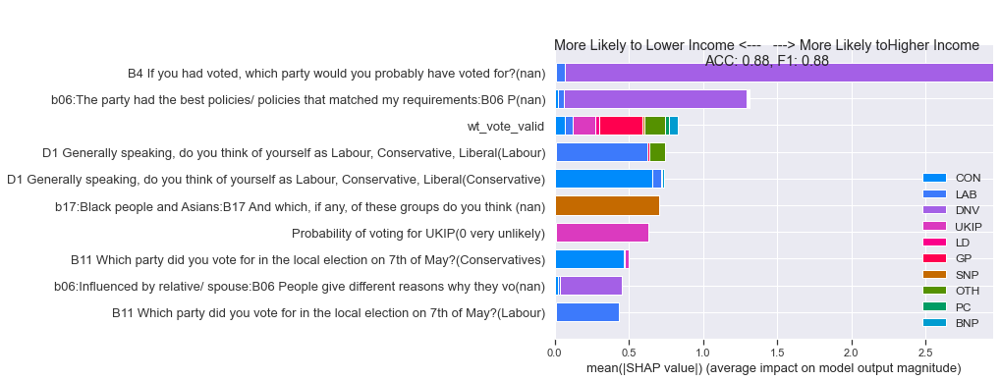

In [1608]:
ge="2015"
vote_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote"].replace("DK",np.nan)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"] = vote_complete
mask = vote_complete.isnull()

harm_vars = ["wt","age","housing_det","vote_complete","inc"]
target_var = "vote_complete"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "vote_complete"
min_features = 10
drop_std_thresh = 0
drop_vars = ["b02","b01","Int_fin_time"]
#     'v9a','v7a','v7b','v8','v9b','v10a','v10b',
#              'v7b_1','v7b_2','v7b_3','v7b_4','v7b_5','v7b_6','v7b_7','v7b_8','v7b_9','v7b_10','v7b_11','v7b_12','v7b_13']
             #,'v8a','v15a','v7','v6c']
#     'v8a','v6a','v15b1','v8b','v15b2','v9a','v6b1','v7','v15a','v8c','v6c']
#     'oct115','oct112', # basic vote vars
#              'oct115a','oct115b','oct115c', # vars for 'if you voted con/lab'
#              'oct119','oct119a','oct119b','oct119c','oct119d'] # same for 'voted for libs'
# drop_vars = drop_vars+[k for k,v in BES_label_list[ge].items() if re.search("v7b|what would be your 2nd choice",v.lower())]

alg = get_xgboost_alg(classification_problem=True)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=False,alg=alg,multi_class_target=True)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
# use fitted algorithm to predict values
vote_pred = pd.Series(alg.predict(df_pred[train_columns]),index=vote_complete.index)
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [1609]:
vote_complete.value_counts()

CON     836
DNV     780
LAB     677
UKIP    234
LD      158
SNP     101
GP       66
OTH      12
PC       10
BNP       3
Name: vote, dtype: int64

In [1610]:
vote_pred.value_counts()

CON     876
DNV     788
LAB     726
UKIP    249
LD      163
SNP     105
GP       66
PC        9
OTH       5
dtype: int64

In [1611]:
vote_pred[mask].value_counts()

LAB     39
CON     33
UKIP    14
DNV      8
LD       8
SNP      5
GP       3
dtype: int64

In [1612]:
vote_complete.loc[mask] = vote_pred.loc[mask]
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"] = vote_complete

In [ ]:
# 2015, inc

In [1690]:
ge = "2015"
# inc = BES_df_list[ge]["hhincqua"].cat.remove_categories(['refused', "don't   know", 'not     answered']).cat.codes.replace(-1,np.nan)
# inc = BES_df_list[ge]["hhincome"].cat.remove_categories(['form not completed','defaced ballot', 'refusal', "don't   know", 'not     answered']).cat.codes.replace(-1,np.nan)
# inc = BES_df_list[ge][['aq45','bq78','incomes']].replace("refused",np.nan).replace("don't know",np.nan).fillna(axis=1,method='ffill')["incomes"]
# replace_dict = {98:np.nan,99:np.nan,999:np.nan,9999:np.nan}
# inc = BES_df_list[ge][["aq55","bq84","tq84"]].replace(replace_dict).fillna(axis=1,method='ffill')["tq84"]
inc = BES_df_list[ge]["y01"].cat.remove_categories(["Refused","Don't know"]).cat.codes.replace(-1,np.nan)
# BES_df_list[ge][["aq70","bq96","zq96"]].fillna(method='ffill',axis=1)["zq96"].cat.codes.replace(-1,np.nan)
# inc.cat.categories[-3:]
# inc = inc.cat.codes.replace(-1,np.nan).astype('float')
inc.value_counts(dropna=False)
mask = inc.isnull()
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"inc_det"] = inc.astype('float')

MSE: 6.74, MAE: 2.03, EV: 0.55, R2: 0.55


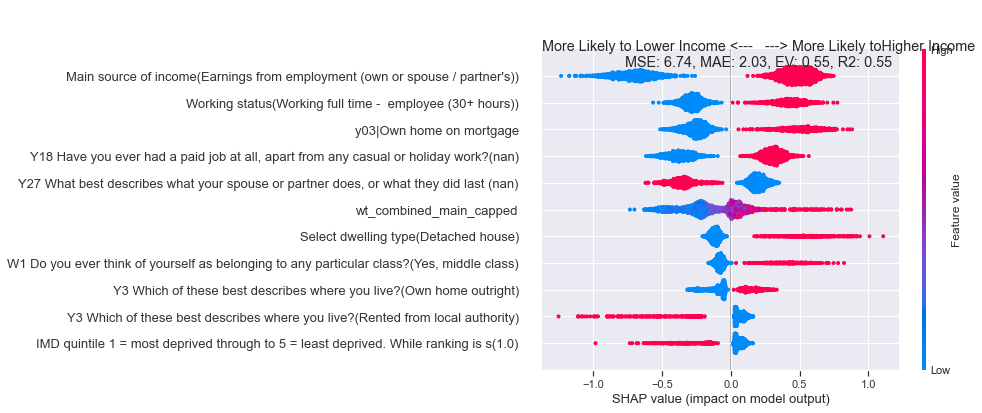

<Figure size 1152x720 with 0 Axes>

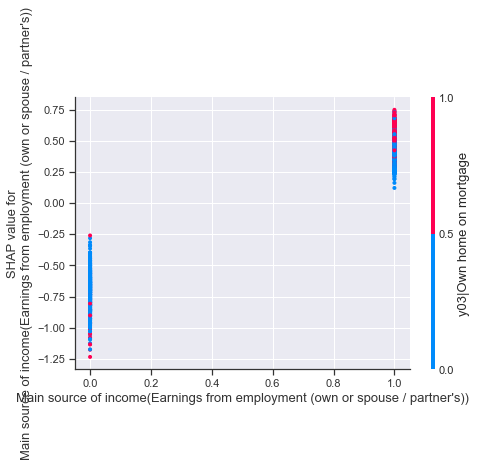

<Figure size 1152x720 with 0 Axes>

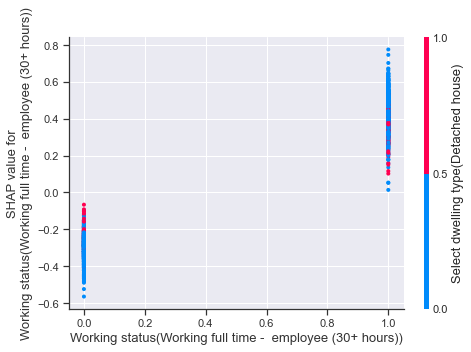

<Figure size 1152x720 with 0 Axes>

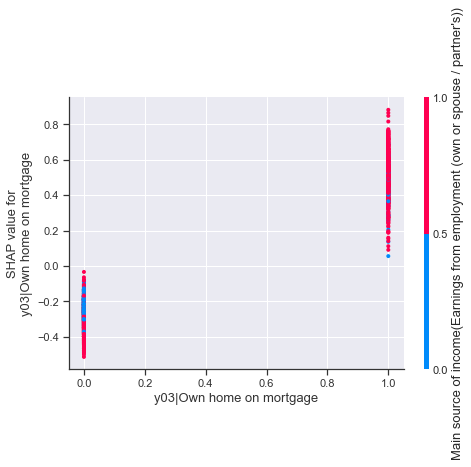

<Figure size 1152x720 with 0 Axes>

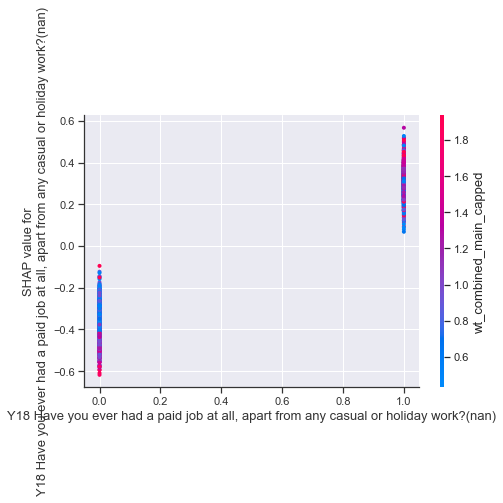

<Figure size 1152x720 with 0 Axes>

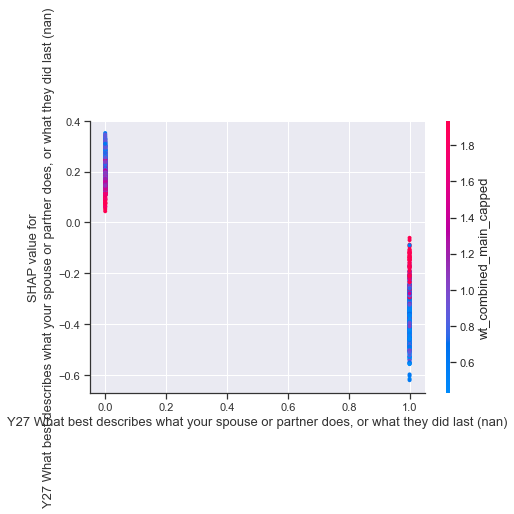

<Figure size 1152x720 with 0 Axes>

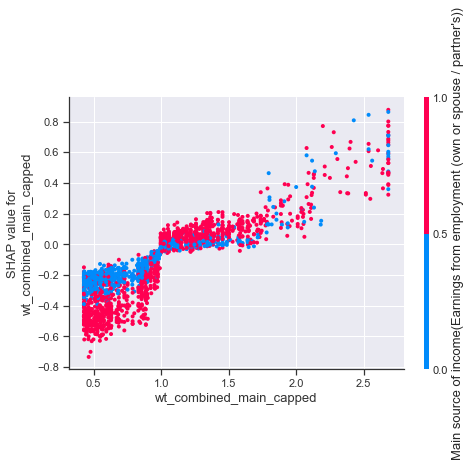

<Figure size 1152x720 with 0 Axes>

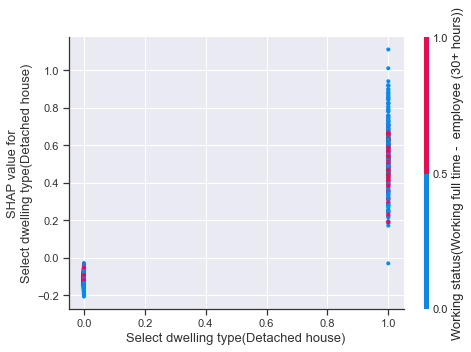

<Figure size 1152x720 with 0 Axes>

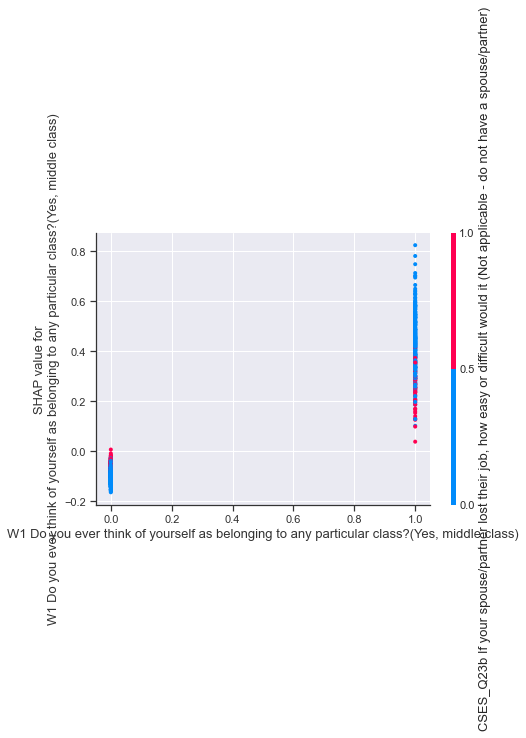

<Figure size 1152x720 with 0 Axes>

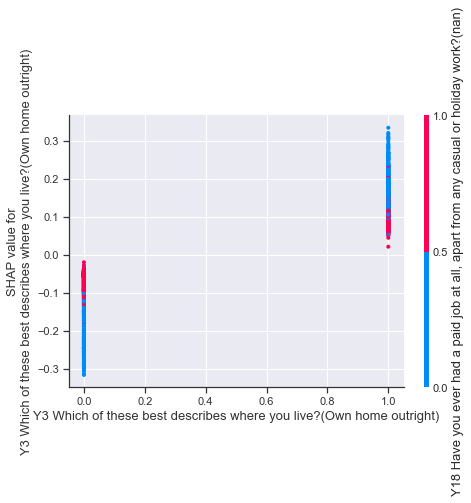

<Figure size 1152x720 with 0 Axes>

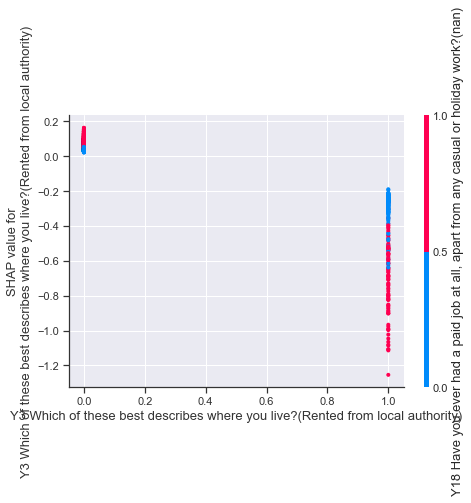

<Figure size 1152x720 with 0 Axes>

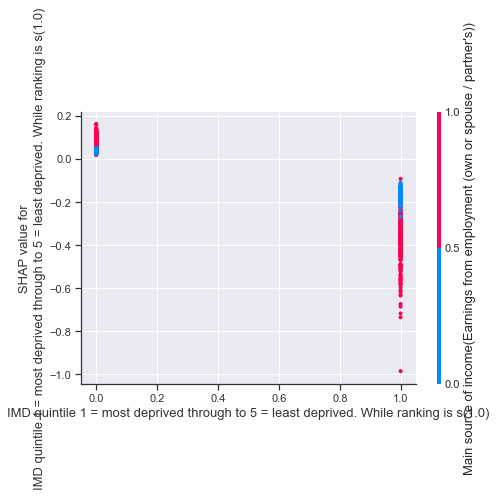

In [1691]:
ge = "2015"
harm_vars = ["wt","age","housing_det","vote_complete","inc_det"]
target_var = "inc_det"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "inc_det"
min_features = 10
drop_vars = ["y01","Int_fin_time"]
drop_std_thresh = 0

alg = get_xgboost_alg(classification_problem=False)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False,alg=alg)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
# use fitted algorithm to predict values
inc_pred = pd.Series(alg.predict(df_pred[train_columns]),index=inc.index).round()
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

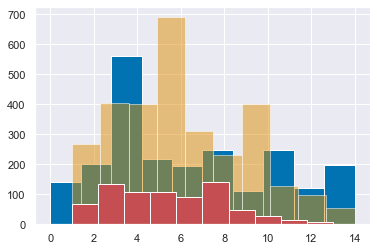

In [1692]:
inc.hist()
inc_pred.hist(alpha=.5)
inc_pred[mask].hist(color='r')

inc.loc[mask] = inc_pred.loc[mask]
f2f_harmonised.loc[f2f_harmonised["dataset"]=="2015","inc_det"] = inc

In [1622]:
vote_simple = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"].replace(simple_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete_simple"] = vote_simple
vote_simple.value_counts(dropna=False)

bloc_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete_simple"].replace(bloc_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"bloc_complete"] = bloc_complete
bloc_complete.value_counts(dropna=False)

turnout_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"].replace(turnout_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"turnout_complete"] = turnout_complete
turnout_complete.value_counts(dropna=False)

VOTED    2199
DNV       788
Name: vote_complete, dtype: int64

In [1635]:
ge="2015"
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge].isnull().sum()

dataset                   0
uid                       0
housing_det               0
housing                   0
inc                     750
vote                      0
year                      0
wt                      224
age                       0
vote_simple              12
bloc                      0
birth_year               32
harmonised_voted          0
inc_det                   0
vote_complete             0
vote_complete_simple      0
bloc_complete            12
turnout_complete          0
dtype: int64

In [1636]:
f2f_harmonised.to_pickle("E:\\BES_analysis_data\\Face_to_face\\f2f_harmonised.zip", compression='zip')
pickle.dump( BES_label_list, open( "E:\\BES_analysis_data\\Face_to_face\\BES_label_list.pickle", "wb" ) )
pickle.dump( BES_df_list, open( "E:\\BES_analysis_data\\Face_to_face\\BES_df_list.pickle", "wb" ) )

In [1637]:
## 2017
ge = "2017"

In [1638]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge].isnull().sum()

# age 19mvals DONE 
# wt 127 mvals wt_vote DONE
# housing_det DKs 13 DONE
# vote DKs 75 DONE
# inc 429 DONE

dataset                    0
uid                        0
housing_det                0
housing                    0
inc                      429
vote                       0
year                       0
wt                       127
age                       19
vote_simple                4
bloc                       0
birth_year                19
harmonised_voted           0
inc_det                 2194
vote_complete           2194
vote_complete_simple    2194
bloc_complete           2194
turnout_complete        2194
dtype: int64

In [1641]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote"].value_counts(dropna=False)

LAB     725
CON     671
DNV     462
LD      117
DK       75
SNP      49
UKIP     37
GP       31
PC       23
OTH       4
Name: vote, dtype: int64

MSE: 62.86, MAE: 6.23, EV: 0.81, R2: 0.81


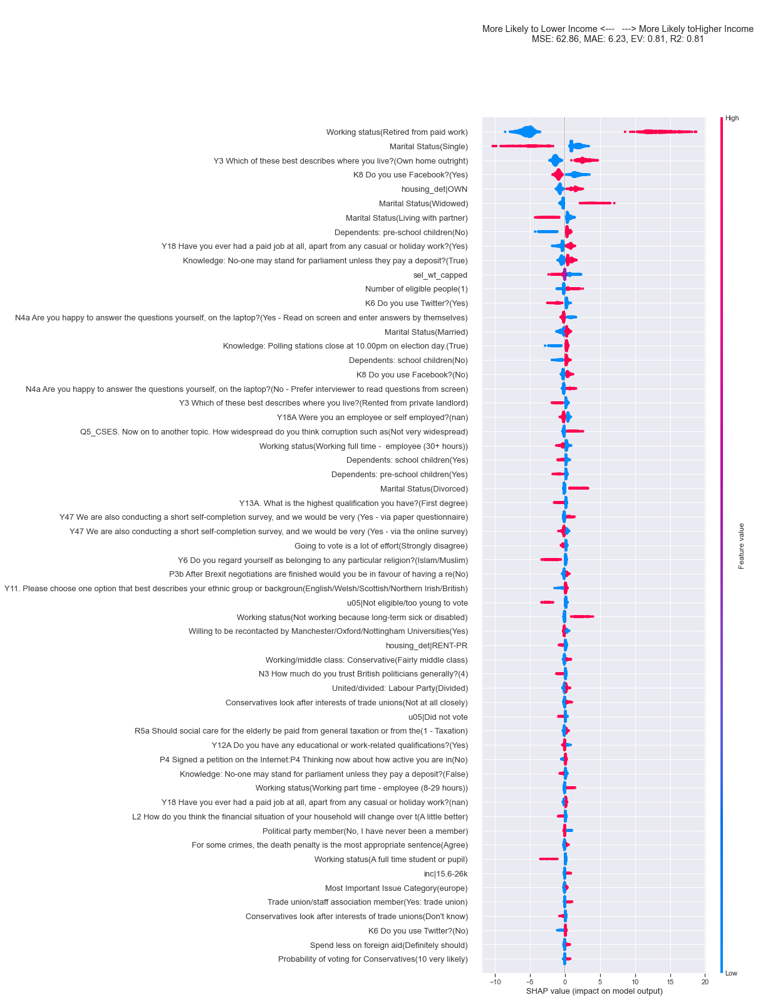

In [1650]:
ge = "2017"
age = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"].copy()
mask = age.isnull()

harm_vars = ["wt","age","housing_det","harmonised_voted","inc","vote"]
target_var = "age"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "age"
min_features = 10
drop_std_thresh = 0
drop_vars = ["y10_banded","Age"]


alg = get_xgboost_alg(classification_problem=False)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=False,alg=alg)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
# use fitted algorithm to predict values
age_pred = pd.Series(alg.predict(df_pred[train_columns]),index=age.index).round()
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

0

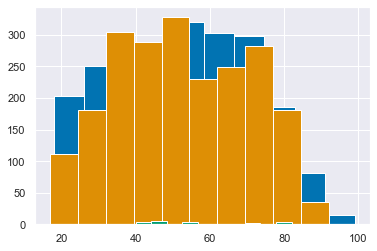

In [1663]:
age.hist()
age_pred.hist()
age_pred[mask].hist()

age.loc[age.isnull()] = age_pred.loc[age.isnull()]


age.loc[mask&BES_df_list[ge]['q25_cses'].notnull()] = BES_df_list[ge]['q25_cses'].loc[mask&BES_df_list[ge]['q25_cses'].notnull()]

#  BES_df_list[ge]['q25_cses'][mask]
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"] = age
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"].isnull().sum()

In [1646]:
# {k:v for k,v in BES_label_list[ge].items() if "birthday" in v.lower()}

{'y10_banded': 'Y10. Please can you tell me your age at your last birthday',
 'Age': 'Age at last birthday',
 'q25_cses': 'Q25_CSES. And what was your age last birthday? Enter years YY'}

In [ ]:
# 2017, housing

In [1666]:
ge = "2017"
housing = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing_det"].replace("DK",np.nan)
# housing.value_counts(dropna=False)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing_det"] = housing.replace("NA",np.nan).astype('category')
# .replace("NA",np.nan).replace("OTH",np.nan)
mask = housing.isnull()

ACC: 0.58,  F1: 0.58


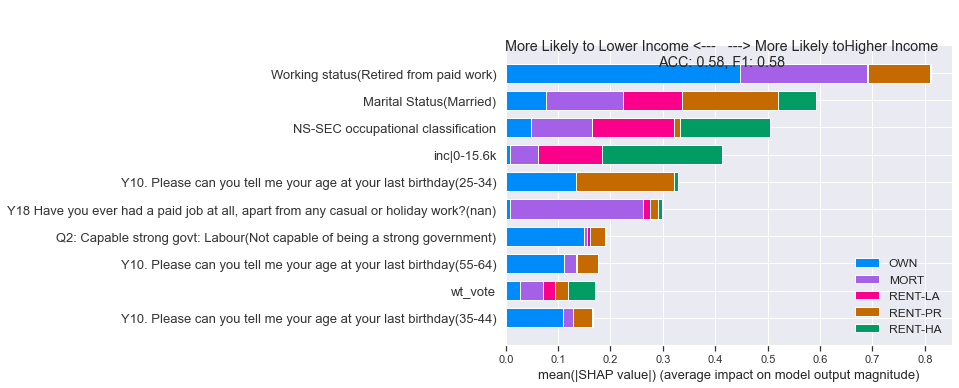

In [1667]:
ge = "2017"
harm_vars = ["wt","age","housing_det","harmonised_voted","inc_det","inc","vote"]#,"housing"
target_var = "housing_det"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "housing_det"
min_features = 10
drop_vars = ['y03','Int_fin_time']
#'tq79a',
drop_thresh = 0
#  'aq65_1': 'own or rent',
#  'aq65_2': 'own outright or mortgage',
#  'aq65_3': 'rent from whom',
# 'bq93_1': 'own rent accommodation',
# 'bq93_2': 'own outright-mortgage',
# 'bq93_3': 'rent from?',

alg = get_xgboost_alg(classification_problem=True)


# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=False,alg=alg,multi_class_target=True)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
# use fitted algorithm to predict values
housing_pred = pd.Series(alg.predict(df_pred[train_columns]),index=housing.index)
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [1668]:
housing.value_counts()

OWN        842
MORT       646
RENT-PR    314
RENT-LA    221
RENT-HA    158
Name: housing_det, dtype: int64

In [1669]:
housing_pred.value_counts()

OWN        941
MORT       697
RENT-PR    261
RENT-LA    196
RENT-HA     99
dtype: int64

In [1670]:
housing_pred[mask].value_counts()

MORT       7
OWN        4
RENT-PR    1
RENT-LA    1
dtype: int64

In [1671]:
housing.loc[mask] = housing_pred.loc[mask]
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing_det"] = housing

In [ ]:
# 2017, votes

ACC: 0.91,  F1: 0.91


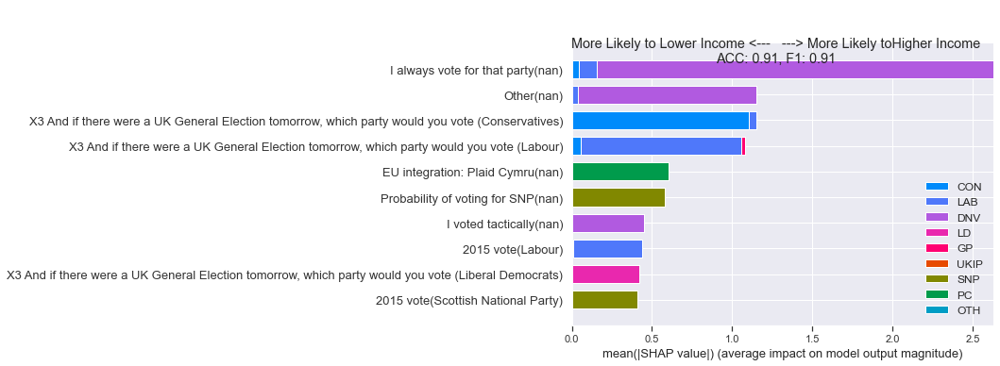

In [1674]:
ge="2017"
vote_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote"].replace("DK",np.nan)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"] = vote_complete
mask = vote_complete.isnull()

harm_vars = ["wt","age","housing_det","vote_complete","inc"]
target_var = "vote_complete"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "vote_complete"
min_features = 10
drop_std_thresh = 0
drop_vars = ["b02","b01","Int_fin_time"]
#     'v9a','v7a','v7b','v8','v9b','v10a','v10b',
#              'v7b_1','v7b_2','v7b_3','v7b_4','v7b_5','v7b_6','v7b_7','v7b_8','v7b_9','v7b_10','v7b_11','v7b_12','v7b_13']
             #,'v8a','v15a','v7','v6c']
#     'v8a','v6a','v15b1','v8b','v15b2','v9a','v6b1','v7','v15a','v8c','v6c']
#     'oct115','oct112', # basic vote vars
#              'oct115a','oct115b','oct115c', # vars for 'if you voted con/lab'
#              'oct119','oct119a','oct119b','oct119c','oct119d'] # same for 'voted for libs'
# drop_vars = drop_vars+[k for k,v in BES_label_list[ge].items() if re.search("v7b|what would be your 2nd choice",v.lower())]

alg = get_xgboost_alg(classification_problem=True)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=False,alg=alg,multi_class_target=True)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
# use fitted algorithm to predict values
vote_pred = pd.Series(alg.predict(df_pred[train_columns]),index=vote_complete.index)
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [1678]:
# vote_complete.value_counts()
# vote_pred.value_counts()
# vote_pred[mask].value_counts()

vote_complete.loc[mask] = vote_pred[mask]
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"] = vote_complete

In [ ]:
# 2017, inc

In [1683]:
ge = "2017"
# inc = BES_df_list[ge]["hhincqua"].cat.remove_categories(['refused', "don't   know", 'not     answered']).cat.codes.replace(-1,np.nan)
# inc = BES_df_list[ge]["hhincome"].cat.remove_categories(['form not completed','defaced ballot', 'refusal', "don't   know", 'not     answered']).cat.codes.replace(-1,np.nan)
# inc = BES_df_list[ge][['aq45','bq78','incomes']].replace("refused",np.nan).replace("don't know",np.nan).fillna(axis=1,method='ffill')["incomes"]
# replace_dict = {98:np.nan,99:np.nan,999:np.nan,9999:np.nan}
# inc = BES_df_list[ge][["aq55","bq84","tq84"]].replace(replace_dict).fillna(axis=1,method='ffill')["tq84"]
inc = BES_df_list[ge]["y01"].cat.remove_categories(["Refused",'Don`t know']).cat.codes.replace(-1,np.nan)
# BES_df_list[ge][["aq70","bq96","zq96"]].fillna(method='ffill',axis=1)["zq96"].cat.codes.replace(-1,np.nan)
# inc.cat.categories[-3:]
# inc = inc.cat.codes.replace(-1,np.nan).astype('float')
inc.value_counts(dropna=False)
mask = inc.isnull()
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"inc_det"] = inc.astype('float')

MSE: 8.46, MAE: 2.27, EV: 0.44, R2: 0.44


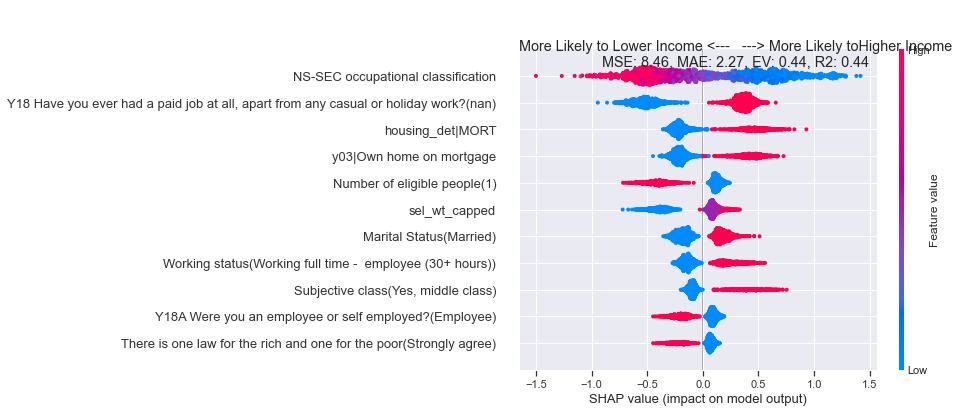

<Figure size 1152x720 with 0 Axes>

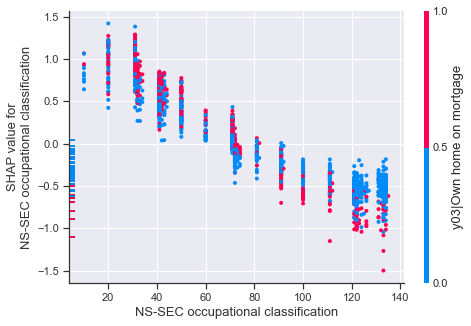

<Figure size 1152x720 with 0 Axes>

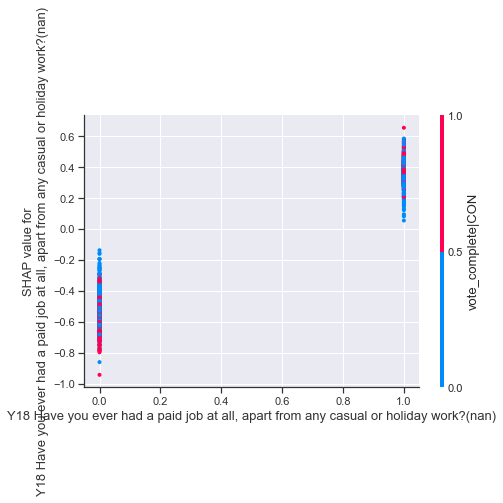

<Figure size 1152x720 with 0 Axes>

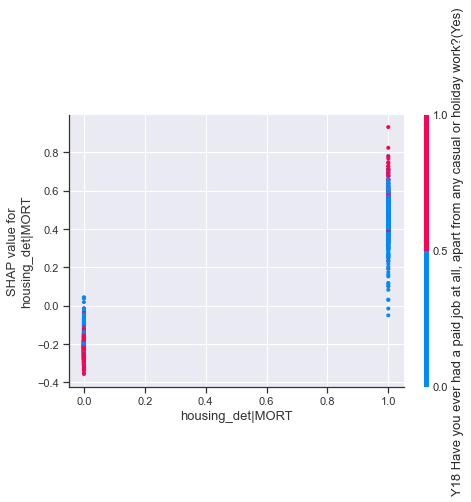

<Figure size 1152x720 with 0 Axes>

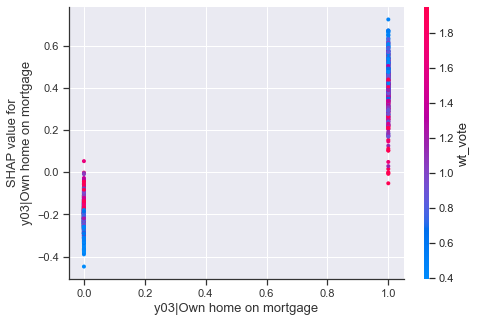

<Figure size 1152x720 with 0 Axes>

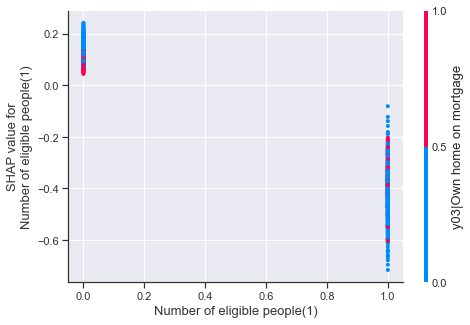

<Figure size 1152x720 with 0 Axes>

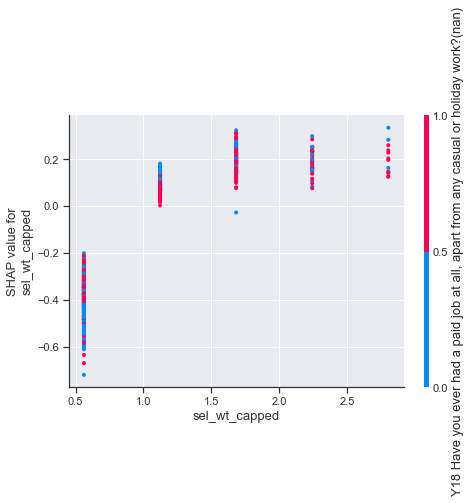

<Figure size 1152x720 with 0 Axes>

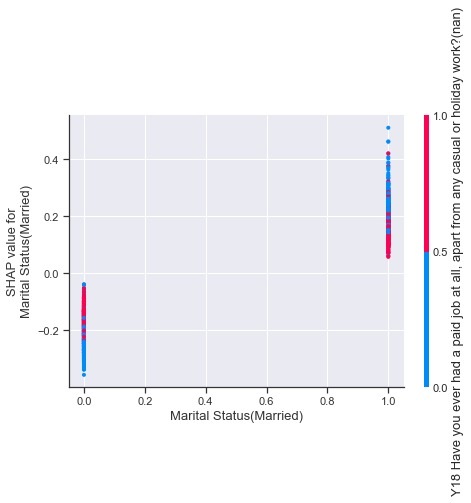

<Figure size 1152x720 with 0 Axes>

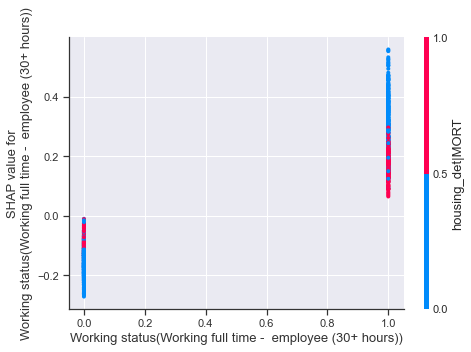

<Figure size 1152x720 with 0 Axes>

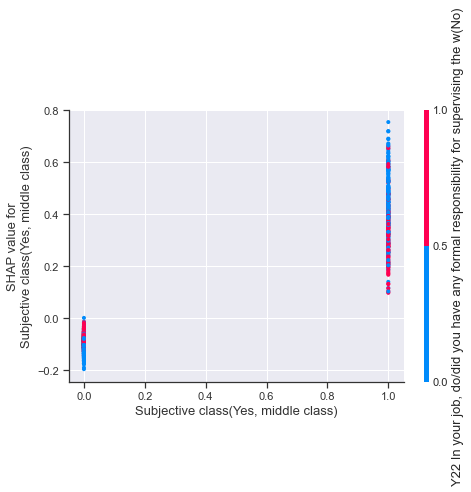

<Figure size 1152x720 with 0 Axes>

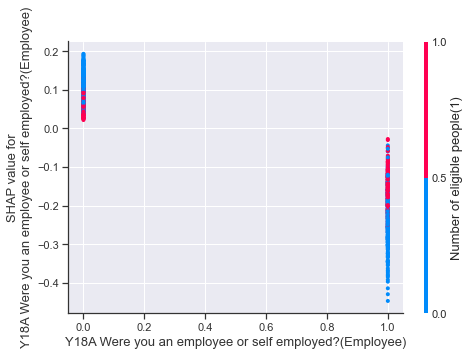

<Figure size 1152x720 with 0 Axes>

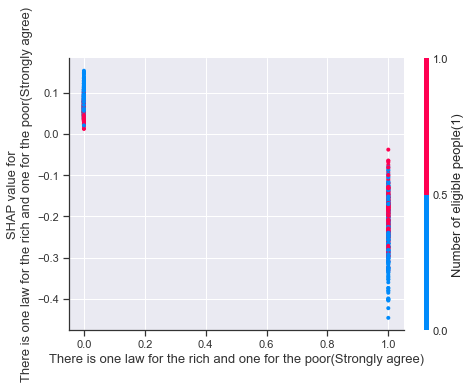

In [1684]:
ge = "2017"
harm_vars = ["wt","age","housing_det","vote_complete","inc_det"]
target_var = "inc_det"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "inc_det"
min_features = 10
drop_vars = ["y01","Int_fin_time"]
drop_std_thresh = 0

alg = get_xgboost_alg(classification_problem=False)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False,alg=alg)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
# use fitted algorithm to predict values
inc_pred = pd.Series(alg.predict(df_pred[train_columns]),index=inc.index).round()
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

0

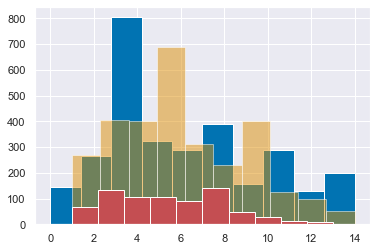

In [1695]:
ge="2017"
inc.hist()
inc_pred.hist(alpha=.5)
inc_pred[mask].hist(color='r')

inc.loc[mask] = inc_pred.loc[mask]
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"inc_det"] = inc
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"inc_det"].isnull().sum()

In [1696]:
vote_simple = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"].replace(simple_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete_simple"] = vote_simple
vote_simple.value_counts(dropna=False)

bloc_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete_simple"].replace(bloc_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"bloc_complete"] = bloc_complete
bloc_complete.value_counts(dropna=False)

turnout_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"].replace(turnout_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"turnout_complete"] = turnout_complete
turnout_complete.value_counts(dropna=False)

VOTED    1728
DNV       466
Name: vote_complete, dtype: int64

In [1699]:
# f2f_harmonised.loc[f2f_harmonised["dataset"]=="2015"].isnull().sum()

In [1700]:
f2f_harmonised.to_pickle("E:\\BES_analysis_data\\Face_to_face\\f2f_harmonised.zip", compression='zip')
pickle.dump( BES_label_list, open( "E:\\BES_analysis_data\\Face_to_face\\BES_label_list.pickle", "wb" ) )
pickle.dump( BES_df_list, open( "E:\\BES_analysis_data\\Face_to_face\\BES_df_list.pickle", "wb" ) )

In [1703]:
## 2019
ge = "2019"

In [1704]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge].isnull().sum()
# age 180 mvals !
# wt 444 mvals !! wt_vote
# housing_det DK 47
# votes DK 239
# inc 855

dataset                    0
uid                        0
housing_det                0
housing                    0
inc                      855
vote                       0
year                       0
wt                       444
age                      180
vote_simple               21
bloc                       0
birth_year               180
harmonised_voted           0
inc_det                 3946
vote_complete           3946
vote_complete_simple    3946
bloc_complete           3946
turnout_complete        3946
dtype: int64

In [1706]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote"].value_counts(dropna=False)

CON     1348
LAB      895
DNV      775
LD       384
DK       239
SNP      125
GP        98
BXP       43
OTH       21
PC        16
UKIP       2
Name: vote, dtype: int64

In [1708]:
BES_df_list[ge]["wt_vote"].isnull().sum()

444

In [ ]:
# 2019, age

In [1738]:
f2f_harmonised.loc[:,"age"] = f2f_harmonised.loc[:,"age"].astype(float)

MSE: 61.95, MAE: 6.28, EV: 0.81, R2: 0.81


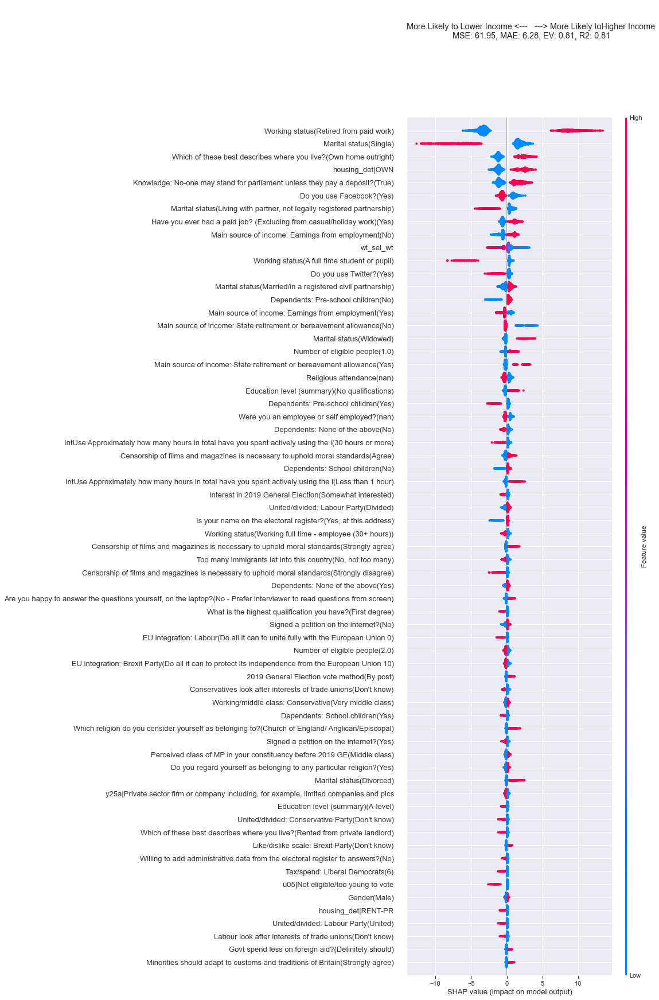

In [1766]:
ge = "2019"
age = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"].copy()
age_cses = BES_df_list[ge]["Q24_CSES"].replace(-999,np.nan).replace(-9,np.nan)
age.loc[age.isnull() & age_cses.notnull()] = age_cses.loc[age.isnull() & age_cses.notnull()]
# BES_df_list[ge]["Q24_CSES"][mask]

mask = age.isnull()

harm_vars = ["wt","age","housing_det","harmonised_voted","inc","vote"]
target_var = "age"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "age"
min_features = 10
drop_std_thresh = 0
drop_vars = ["y10_banded","Age","Q24_CSES"]


alg = get_xgboost_alg(classification_problem=False)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=False,alg=alg)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
# use fitted algorithm to predict values
age_pred = pd.Series(alg.predict(df_pred[train_columns]),index=age.index).round()
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

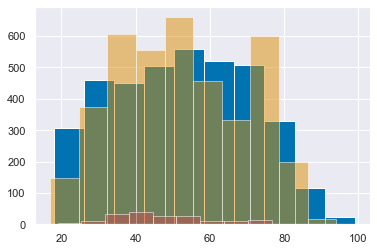

In [1772]:
age.hist()
age_pred.hist(alpha=.5)
age_pred[mask].hist(alpha=.5,color='r')

age.loc[mask] = age_pred.loc[mask]
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"] = age

In [ ]:
# 2019, housing

In [1779]:
ge = "2019"
housing = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing_det"].replace("DK",np.nan)
# housing.value_counts(dropna=False)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing_det"] = housing.replace("NA",np.nan).replace("OTH",np.nan).astype('category')
# .replace("NA",np.nan).replace("OTH",np.nan)
mask = housing.isnull()

ACC: 0.62,  F1: 0.62


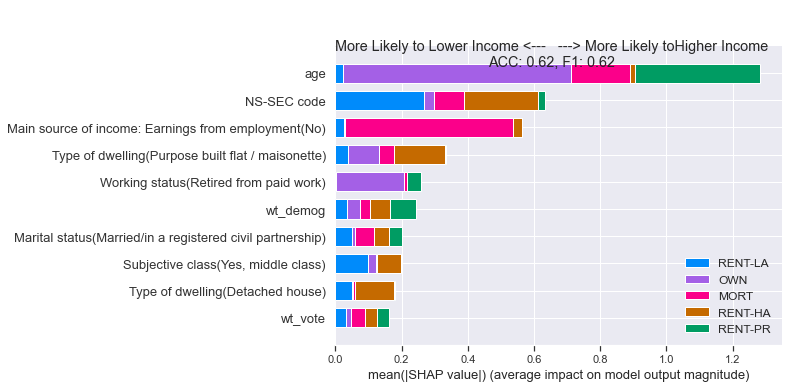

In [1790]:
ge = "2019"
harm_vars = ["wt","age","housing_det","harmonised_voted","inc_det","inc","vote"]#,"housing"
target_var = "housing_det"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "housing_det"
min_features = 10
drop_vars = ['y03','Int_fin_time','Interview_Date','Scan_Date','Q22_CSES']
#'tq79a',
drop_thresh = 0
#  'aq65_1': 'own or rent',
#  'aq65_2': 'own outright or mortgage',
#  'aq65_3': 'rent from whom',
# 'bq93_1': 'own rent accommodation',
# 'bq93_2': 'own outright-mortgage',
# 'bq93_3': 'rent from?',

alg = get_xgboost_alg(classification_problem=True)


# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=False,alg=alg,multi_class_target=True)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
# use fitted algorithm to predict values
housing_pred = pd.Series(alg.predict(df_pred[train_columns]),index=housing.index)
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [1791]:
# {k:v for k,v in BES_label_list[ge].items() if "what date did" in v.lower()}

In [1799]:
housing.value_counts(dropna=False)
housing_pred.value_counts(dropna=False)
housing_pred[mask].value_counts(dropna=False)

housing.loc[mask] = housing_pred[mask]
housing.value_counts()
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"housing_det"] = housing.replace("OTH",np.nan)

In [ ]:
#2019, votes

ACC: 0.86,  F1: 0.86


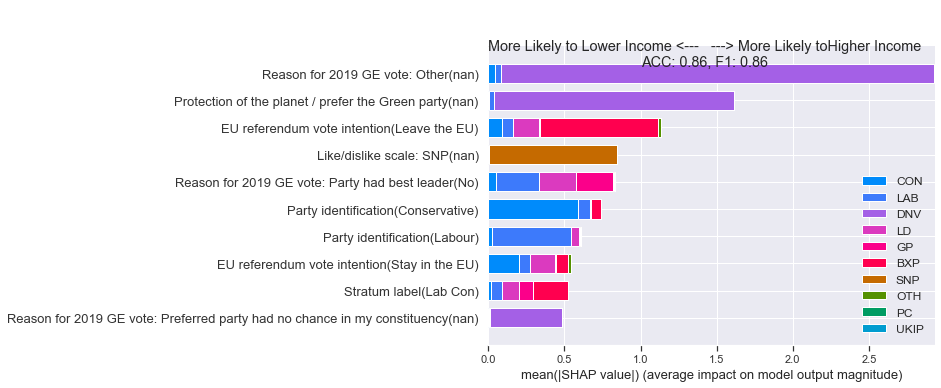

In [1801]:
ge="2019"
vote_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote"].replace("DK",np.nan)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"] = vote_complete
mask = vote_complete.isnull()

harm_vars = ["wt","age","housing_det","vote_complete","inc"]
target_var = "vote_complete"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "vote_complete"
min_features = 10
drop_std_thresh = 0
drop_vars = ["b02","b01","Int_fin_time",'Interview_Date','Scan_Date','Q22_CSES']
#     'v9a','v7a','v7b','v8','v9b','v10a','v10b',
#              'v7b_1','v7b_2','v7b_3','v7b_4','v7b_5','v7b_6','v7b_7','v7b_8','v7b_9','v7b_10','v7b_11','v7b_12','v7b_13']
             #,'v8a','v15a','v7','v6c']
#     'v8a','v6a','v15b1','v8b','v15b2','v9a','v6b1','v7','v15a','v8c','v6c']
#     'oct115','oct112', # basic vote vars
#              'oct115a','oct115b','oct115c', # vars for 'if you voted con/lab'
#              'oct119','oct119a','oct119b','oct119c','oct119d'] # same for 'voted for libs'
# drop_vars = drop_vars+[k for k,v in BES_label_list[ge].items() if re.search("v7b|what would be your 2nd choice",v.lower())]

alg = get_xgboost_alg(classification_problem=True)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=False,alg=alg,multi_class_target=True)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
# use fitted algorithm to predict values
vote_pred = pd.Series(alg.predict(df_pred[train_columns]),index=vote_complete.index)
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [1802]:
vote_complete.value_counts()

CON     1348
LAB      895
DNV      775
LD       384
SNP      125
GP        98
BXP       43
OTH       21
PC        16
UKIP       2
Name: vote, dtype: int64

In [1803]:
vote_pred.value_counts()

CON    1505
LAB    1000
DNV     816
LD      377
SNP     131
GP       59
BXP      35
PC       12
OTH      11
dtype: int64

In [1804]:
vote_pred[mask].value_counts()

CON    93
LAB    67
DNV    48
LD     25
SNP     6
dtype: int64

In [1806]:
vote_complete.loc[mask]=vote_pred.loc[mask]
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"]=vote_complete

In [1829]:
# 2019,inc
# BES_df_list[ge]["Y01_detailed"]

In [1853]:
ge = "2019"
# inc = BES_df_list[ge]["hhincqua"].cat.remove_categories(['refused', "don't   know", 'not     answered']).cat.codes.replace(-1,np.nan)
# inc = BES_df_list[ge]["hhincome"].cat.remove_categories(['form not completed','defaced ballot', 'refusal', "don't   know", 'not     answered']).cat.codes.replace(-1,np.nan)
# inc = BES_df_list[ge][['aq45','bq78','incomes']].replace("refused",np.nan).replace("don't know",np.nan).fillna(axis=1,method='ffill')["incomes"]
# replace_dict = {98:np.nan,99:np.nan,999:np.nan,9999:np.nan}
# inc = BES_df_list[ge][["aq55","bq84","tq84"]].replace(replace_dict).fillna(axis=1,method='ffill')["tq84"]
inc = BES_df_list[ge]["Y01_detailed"].cat.remove_categories(['Not stated', 'Prefer not to say', "Don't know"]).cat.codes.replace(-1,np.nan)
# BES_df_list[ge][["aq70","bq96","zq96"]].fillna(method='ffill',axis=1)["zq96"].cat.codes.replace(-1,np.nan)
# inc.cat.categories[-3:]
# inc = inc.cat.codes.replace(-1,np.nan).astype('float')
inc.value_counts(dropna=False)
mask = inc.isnull()
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"inc_det"] = inc.astype('float')

In [1854]:
monthly =BES_df_list[ge]["y01_Monthly"].cat.remove_categories(['Not stated', 'Prefer not to say', "Don't know"])
weekly =BES_df_list[ge]["y01_Weekly"].cat.remove_categories(['Not stated', 'Prefer not to say', "Don't know"])
yearly =BES_df_list[ge]["y01_Annual"].cat.remove_categories(['Not stated', 'Prefer not to say', "Don't know"])
mask = (mask&(monthly.notnull()|weekly.notnull()|yearly.notnull()))

MSE: 0.24, MAE: 0.46, EV: 0.98, R2: 0.98


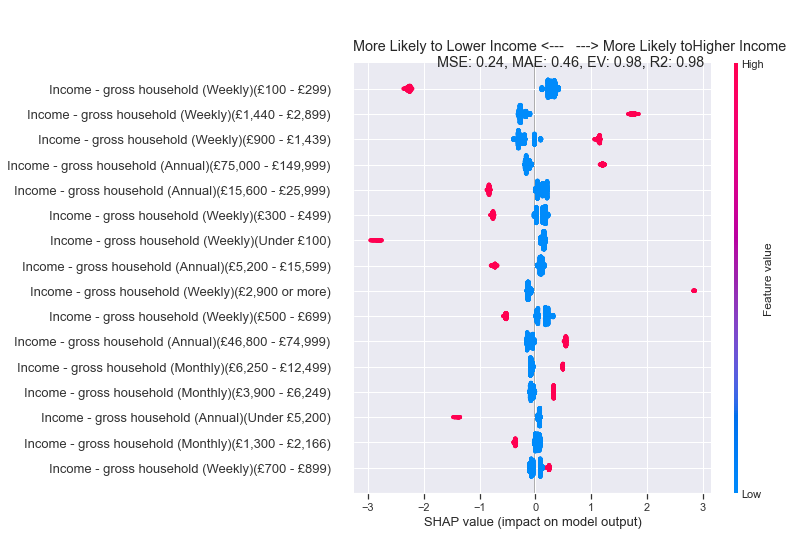

<Figure size 1152x720 with 0 Axes>

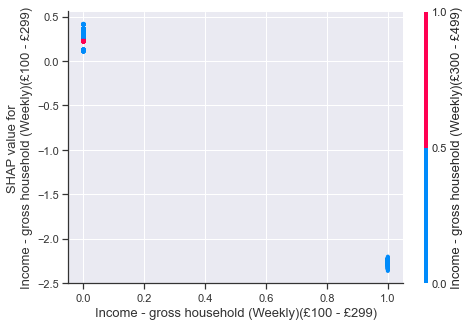

<Figure size 1152x720 with 0 Axes>

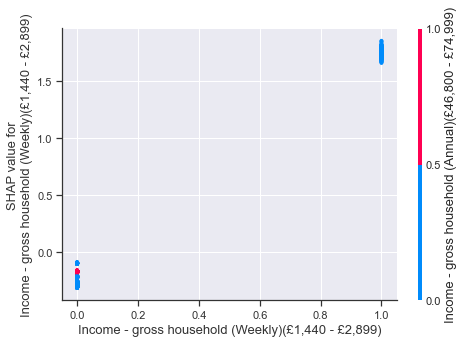

<Figure size 1152x720 with 0 Axes>

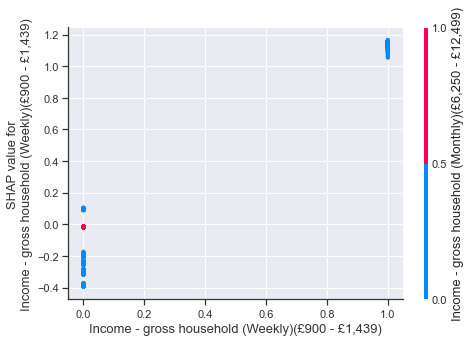

<Figure size 1152x720 with 0 Axes>

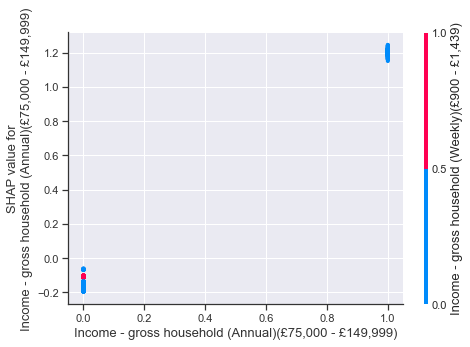

<Figure size 1152x720 with 0 Axes>

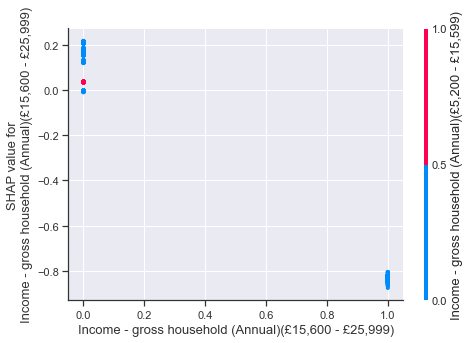

<Figure size 1152x720 with 0 Axes>

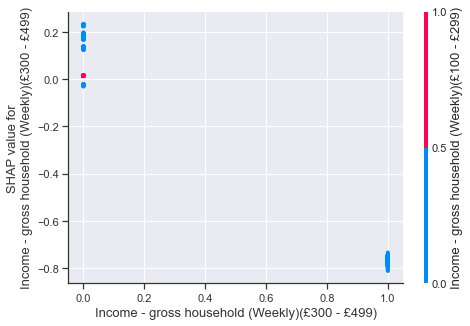

<Figure size 1152x720 with 0 Axes>

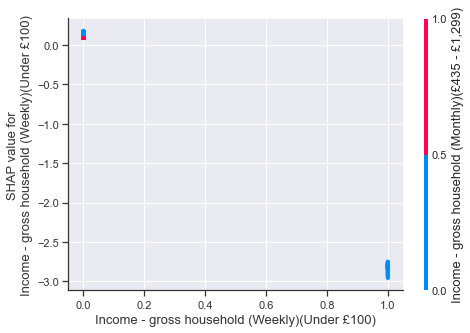

<Figure size 1152x720 with 0 Axes>

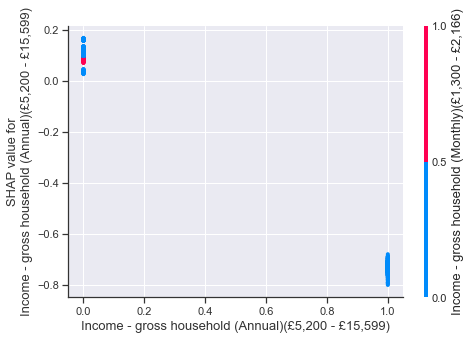

<Figure size 1152x720 with 0 Axes>

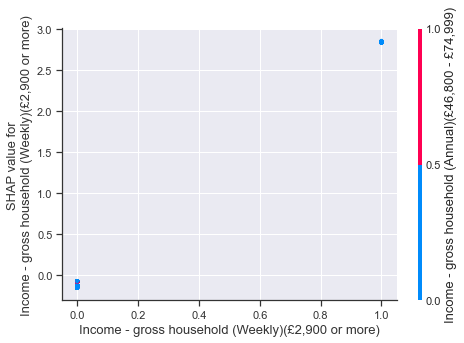

<Figure size 1152x720 with 0 Axes>

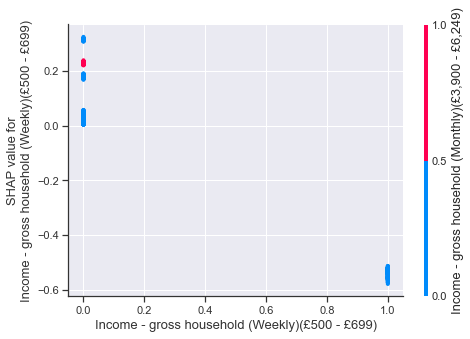

<Figure size 1152x720 with 0 Axes>

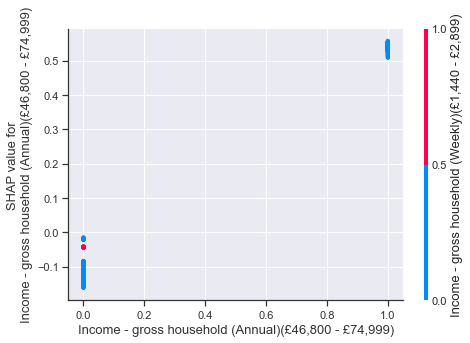

<Figure size 1152x720 with 0 Axes>

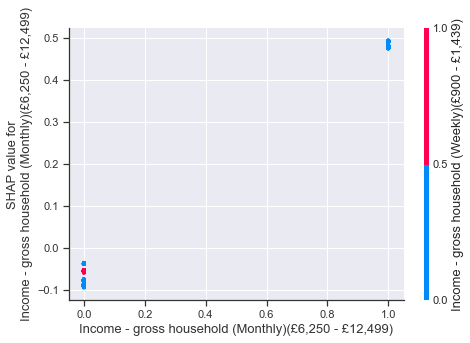

<Figure size 1152x720 with 0 Axes>

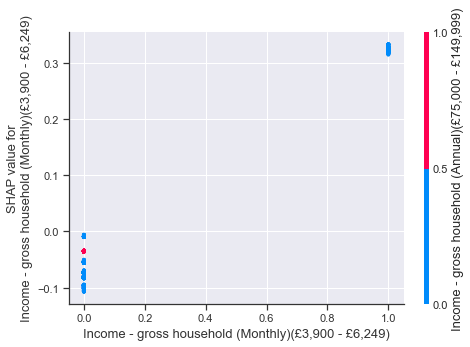

<Figure size 1152x720 with 0 Axes>

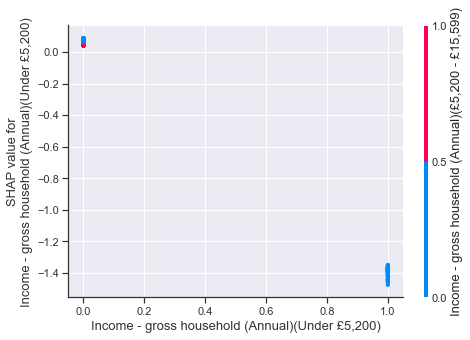

<Figure size 1152x720 with 0 Axes>

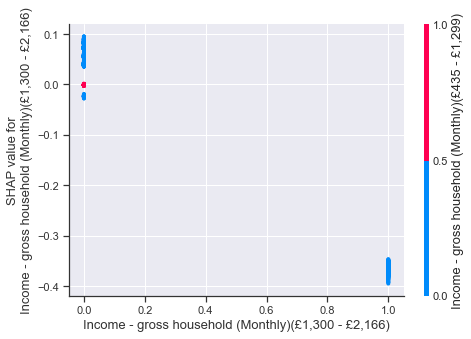

<Figure size 1152x720 with 0 Axes>

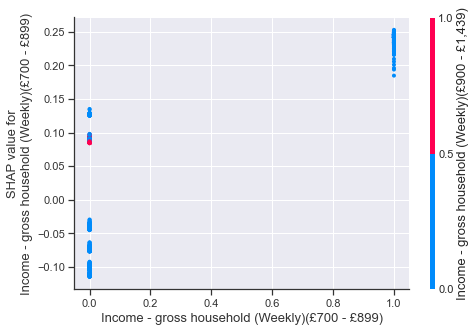

In [1855]:
ge = "2019"
harm_vars = ["wt","age","housing_det","vote_complete","inc_det"]
target_var = "inc_det"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "inc_det"
min_features = 10
drop_vars = ["Int_fin_time",'Interview_Date','Scan_Date','Q22_CSES','Y01_detailed']
#'y01_Weekly','y01_Monthly','y01_Annual',
drop_std_thresh = 0

alg = get_xgboost_alg(classification_problem=False)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False,alg=alg)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
# use fitted algorithm to predict values
inc_pred = pd.Series(alg.predict(df_pred[train_columns]),index=inc.index).round()
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

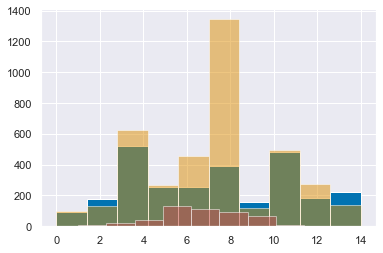

In [1856]:
inc.hist()
inc_pred.hist(alpha=.5)
inc_pred[mask].hist(alpha=.5,color='r')

In [1859]:
inc.loc[mask] = inc_pred.loc[mask]

In [1868]:
mask = inc.isnull()
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"inc_det"] = inc.astype(float)

MSE: 5.44, MAE: 1.78, EV: 0.55, R2: 0.55


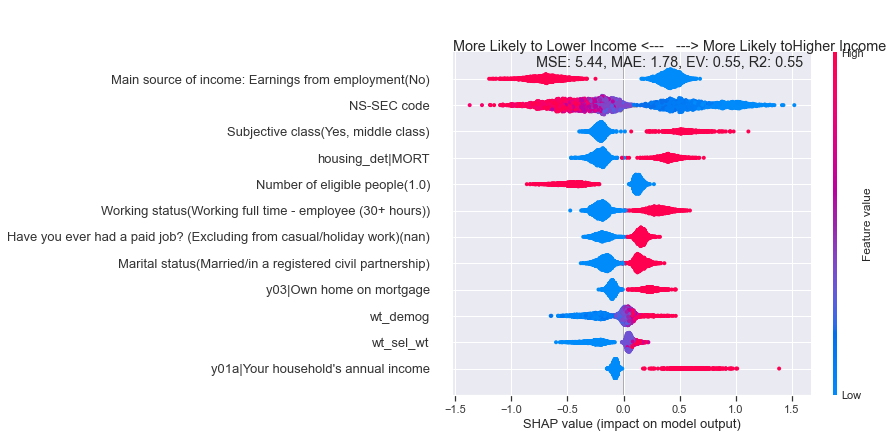

<Figure size 1152x720 with 0 Axes>

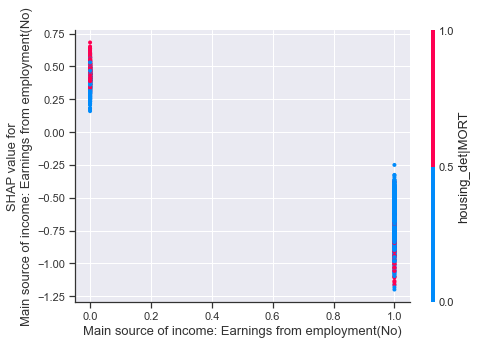

<Figure size 1152x720 with 0 Axes>

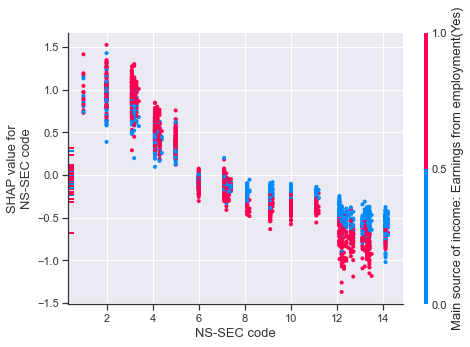

<Figure size 1152x720 with 0 Axes>

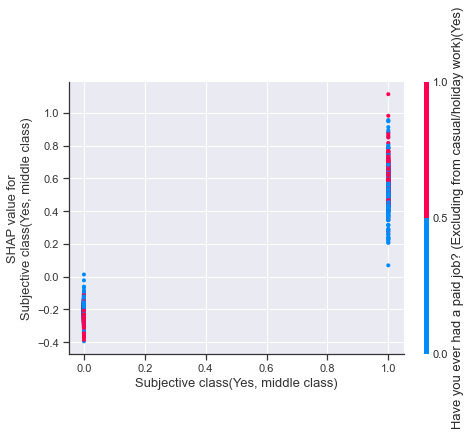

<Figure size 1152x720 with 0 Axes>

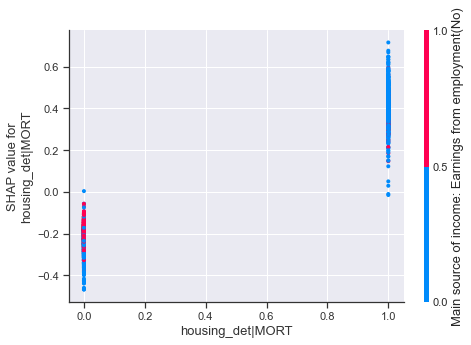

<Figure size 1152x720 with 0 Axes>

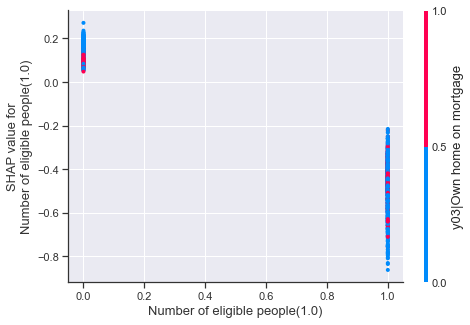

<Figure size 1152x720 with 0 Axes>

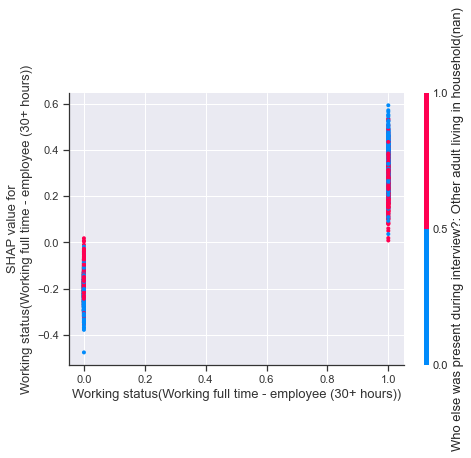

<Figure size 1152x720 with 0 Axes>

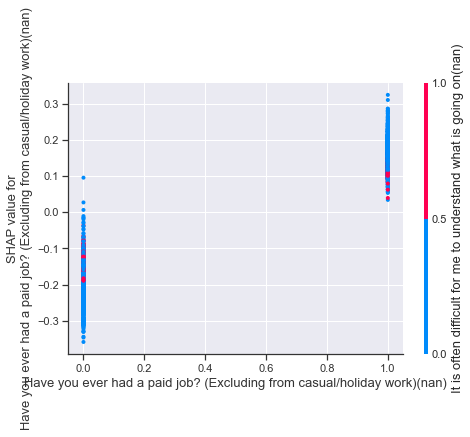

<Figure size 1152x720 with 0 Axes>

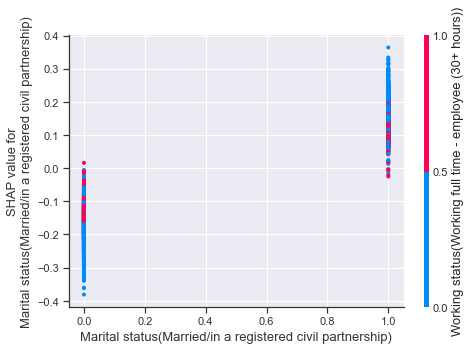

<Figure size 1152x720 with 0 Axes>

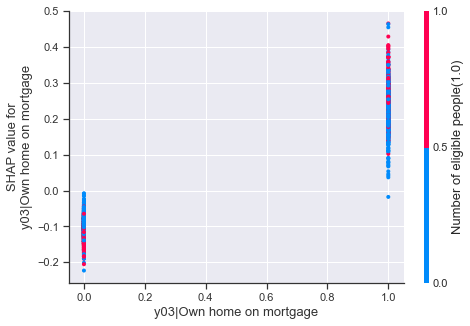

<Figure size 1152x720 with 0 Axes>

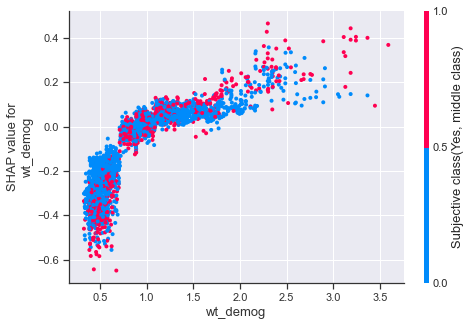

<Figure size 1152x720 with 0 Axes>

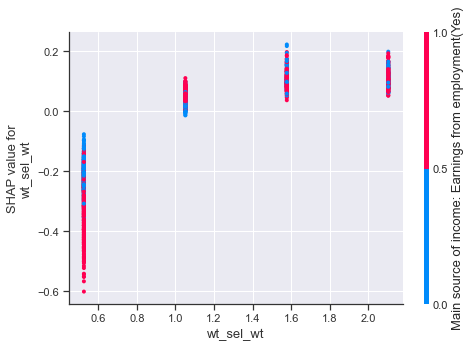

<Figure size 1152x720 with 0 Axes>

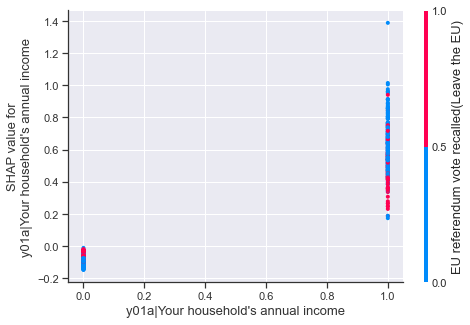

In [1869]:
ge = "2019"
harm_vars = ["wt","age","housing_det","vote_complete","inc_det"]
target_var = "inc_det"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "inc_det"
min_features = 10
drop_vars = ["Int_fin_time",'Interview_Date','Scan_Date','Q22_CSES','Y01_detailed','y01_Weekly','y01_Monthly','y01_Annual',]
#
drop_std_thresh = 0

alg = get_xgboost_alg(classification_problem=False)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False,alg=alg)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
# use fitted algorithm to predict values
inc_pred = pd.Series(alg.predict(df_pred[train_columns]),index=inc.index).round()
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

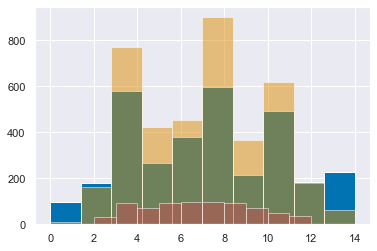

In [1866]:
inc.hist()
inc_pred.hist(alpha=.5)
inc_pred[mask].hist(alpha=.5,color='r')

inc.loc[mask] = inc_pred.loc[mask]
# fill in values with some other income variable coverage - then fill in last gaps

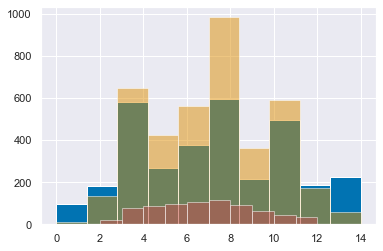

In [1870]:
inc.hist()
inc_pred.hist(alpha=.5)
inc_pred[mask].hist(alpha=.5,color='r')

inc.loc[mask] = inc_pred.loc[mask]

In [1871]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"inc_det"] = inc.astype(float)

In [1874]:
vote_simple = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"].replace(simple_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete_simple"] = vote_simple
vote_simple.value_counts(dropna=False)

bloc_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete_simple"].replace(bloc_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"bloc_complete"] = bloc_complete
bloc_complete.value_counts(dropna=False)

turnout_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"].replace(turnout_dict)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"turnout_complete"] = turnout_complete
turnout_complete.value_counts(dropna=False)

VOTED    3123
DNV       823
Name: vote_complete, dtype: int64

In [1876]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge].isnull().sum()

dataset                   0
uid                       0
housing_det              81
housing                   0
inc                     855
vote                      0
year                      0
wt                      444
age                       0
vote_simple              21
bloc                      0
birth_year              180
harmonised_voted          0
inc_det                   0
vote_complete             0
vote_complete_simple      0
bloc_complete            21
turnout_complete          0
dtype: int64

In [1943]:
f2f_harmonised.to_pickle("E:\\BES_analysis_data\\Face_to_face\\f2f_harmonised.zip", compression='zip')
pickle.dump( BES_label_list, open( "E:\\BES_analysis_data\\Face_to_face\\BES_label_list.pickle", "wb" ) )
pickle.dump( BES_df_list, open( "E:\\BES_analysis_data\\Face_to_face\\BES_df_list.pickle", "wb" ) )

In [ ]:
##

In [ ]:
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge].isnull().sum()

In [1877]:
f2f_harmonised.isnull().sum()

dataset                     0
uid                         0
housing_det               683
housing                  3324
inc                     12245
vote                       42
year                        0
wt                       4808
age                         0
vote_simple               793
bloc                      533
birth_year                413
harmonised_voted          450
inc_det                     0
vote_complete               0
vote_complete_simple        0
bloc_complete             651
turnout_complete           26
dtype: int64

In [1889]:
# wts
# double check them all
f2f_harmonised.groupby("dataset")["wt"].apply(lambda x: x.isnull().sum())

dataset
1959           0
1964        1153
1966        1048
1970        1567
1974_feb       0
1974_oct       0
1979           0
1983           0
1987           0
1992           0
1997         245
2001           0
2005           0
2010           0
2015         224
2017         127
2019         444
Name: wt, dtype: int64

In [1886]:
# housing_det
f2f_harmonised["housing_det"].value_counts(dropna=False)
# drop OTH/NA consistently
# think about how to deal with "RENT" and "OWN" that cover mult categories -> own special categories?

OWN        21408
MORT       11495
RENT-LA    10076
RENT-PR     6150
RENT-HA     1580
RENT         878
NaN          683
OTH          412
NA            49
Name: housing_det, dtype: int64

In [1966]:
f2f_harmonised.groupby('dataset')["housing_det"].apply(lambda x: sum(x=="OWN"))

# 2001 - RENT
# 59-70, 83-87 no MORT

f2f_harmonised.loc[f2f_harmonised["dataset"]=="2001","housing_det"] = f2f_harmonised.loc[f2f_harmonised["dataset"]=="2001","housing_det"].replace("RENT","RENT-ALL")
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1987","housing_det"] = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1987","housing_det"].replace("OWN","OWN-MORT")
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1983","housing_det"] = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1983","housing_det"].replace("OWN","OWN-MORT")
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1970","housing_det"] = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1970","housing_det"].replace("OWN","OWN-MORT")
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1966","housing_det"] = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1966","housing_det"].replace("OWN","OWN-MORT")
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1964","housing_det"] = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1964","housing_det"].replace("OWN","OWN-MORT")
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1959","housing_det"] = f2f_harmonised.loc[f2f_harmonised["dataset"]=="1959","housing_det"].replace("OWN","OWN-MORT")

f2f_harmonised["housing_det"] = f2f_harmonised["housing_det"].replace("OTH",np.nan).replace("NA",np.nan)
f2f_harmonised["housing_det"].value_counts(dropna=False)

MORT        11495
OWN-MORT    11128
OWN         10280
RENT-LA     10076
RENT-PR      6150
RENT-HA      1580
NaN          1144
RENT-ALL      878
Name: housing_det, dtype: int64

In [1880]:
# votes
f2f_harmonised["vote_complete"].value_counts()
# somewhere (1959) has DK values, also (1959) VOTED TODO
# also update turnout voted based on DK values

# Maybe COM -> OTH?

CON      17143
LAB      16384
DNV       9957
LD        4402
LIB       1456
SNP       1147
ALL        427
TY         424
UKIP       383
GP         281
PC         264
OTH        173
SD          94
REF         55
BNP         44
BXP         43
VOTED       27
DK          26
COM          1
Name: vote_complete, dtype: int64

In [1906]:
ge="1959"
vote_complete_backup = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"].copy()

ACC: 0.99,  F1: 0.99


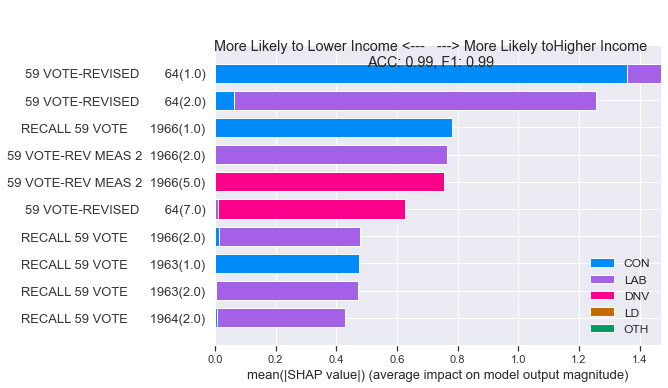

In [1926]:
ge="1959"
vote_complete = f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"].replace("DK",np.nan).replace("VOTED",np.nan)
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"] = vote_complete.replace("TY",np.nan)
mask = vote_complete.isnull()

harm_vars = ["wt","age","housing_det","vote_complete","inc","inc_det"]
target_var = "vote_complete"
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = ["Lower Income","Higher Income"]
var_stub = "vote_complete"
min_features = 10
drop_std_thresh = 0
drop_vars = ["v1153","v1155"]
#     'v9a','v7a','v7b','v8','v9b','v10a','v10b',
#              'v7b_1','v7b_2','v7b_3','v7b_4','v7b_5','v7b_6','v7b_7','v7b_8','v7b_9','v7b_10','v7b_11','v7b_12','v7b_13']
             #,'v8a','v15a','v7','v6c']
#     'v8a','v6a','v15b1','v8b','v15b2','v9a','v6b1','v7','v15a','v8c','v6c']
#     'oct115','oct112', # basic vote vars
#              'oct115a','oct115b','oct115c', # vars for 'if you voted con/lab'
#              'oct119','oct119a','oct119b','oct119c','oct119d'] # same for 'voted for libs'
# drop_vars = drop_vars+[k for k,v in BES_label_list[ge].items() if re.search("v7b|what would be your 2nd choice",v.lower())]

alg = get_xgboost_alg(classification_problem=True)

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
stds = df_pred[mask].std()
drop_vars = drop_vars + list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)
drop_vars = [x for x in drop_vars if x not in ["wt",var_stub]]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder) = prep_df(ge,target_var,target_var_replace_dict,
                                                                                     target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=False,drop_vars=drop_vars,demo_var_only=False,alg=alg,multi_class_target=True)

# setup df back up
df_pred = prep_df_only(ge,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,harm_vars,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False)
# use fitted algorithm to predict values
vote_pred = pd.Series(alg.predict(df_pred[train_columns]),index=vote_complete.index)
# income_var_df_sm.loc[income_var_df_sm[ge].isnull(),ge] = pd.Series(inc_pred,index=income_var_df_sm[ge].index).apply(round)[income_var_df_sm[ge].isnull()]

In [1932]:
# {k:v for k,v in BES_label_list[ge].items() if "59 VOTE-REVISED" in v}

In [1933]:
# BES_df_list[ge]['v1153'][mask].value_counts()

In [1934]:
# vote_pred.value_counts()

In [1935]:
# vote_pred[mask].value_counts()

In [1931]:
vote_complete.loc[mask] = vote_pred.loc[mask]
f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"vote_complete"] = vote_complete

In [1914]:
# {k:v for k,v in BES_label_list[ge].items() if "LOCAL ELECTION" in v}

In [1911]:
# 1959
# BUG label list
BES_label_list["1959"]['v1236'] = 'LOCAL ELECTION VOTE 1963(comb)'



In [1915]:
# vote_complete.value_counts()

CON    1007
LAB     975
TY      424
DNV     361
LD       99
OTH       3
Name: vote_complete, dtype: int64

In [1916]:
# vote_pred.value_counts()

CON    1021
LAB     985
DNV     424
TY      386
LD      102
OTH       4
dtype: int64

In [1917]:
# vote_pred[mask].value_counts()

DNV    37
CON     8
LAB     4
LD      2
TY      1
OTH     1
dtype: int64

In [1939]:
f2f_harmonised["vote_complete"] = f2f_harmonised["vote_complete"].replace("COM","OTH")
f2f_harmonised["vote_complete"].value_counts(dropna=False)
#.groupby("dataset")

CON     17150
LAB     16387
DNV      9997
LD       4404
LIB      1456
SNP      1147
ALL       427
TY        424
UKIP      383
GP        281
PC        264
OTH       175
SD         94
REF        55
BNP        44
BXP        43
Name: vote_complete, dtype: int64

In [1942]:
f2f_harmonised["vote_complete_simple"] = f2f_harmonised["vote_complete"].replace(simple_dict)
f2f_harmonised["vote_complete_simple"].value_counts(dropna=False)

f2f_harmonised["bloc_complete"] = f2f_harmonised["vote_complete_simple"].replace(bloc_dict)
f2f_harmonised["bloc_complete"].value_counts(dropna=False)

f2f_harmonised["turnout_complete"] = f2f_harmonised["vote_complete"].replace(turnout_dict)
f2f_harmonised["turnout_complete"].value_counts(dropna=False)

VOTED    42310
DNV       9997
CNV        424
Name: turnout_complete, dtype: int64

In [1902]:
# age
# looks perfect - update birth_year

year_list = {"2019":2019,
           "2017":2017,
           "2015":2015,
           "2010":2010,
           "2005":2005,
           "2001":2001,
           "1997":1997,
           "1992":1992,
           "1987":1987,
           "1983":1983,
           "1979":1979,
           "1974_feb":1974,
           "1974_oct":1974,
           "1970":1970,
           "1966":1966,
           "1964":1964,}

for ge in year_list.keys():
    f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"birth_year"] = year_list[ge] - f2f_harmonised.loc[f2f_harmonised["dataset"]==ge,"age"]
    
f2f_harmonised["birth_year"].isnull().sum()

0

In [1900]:
# inc
# inc_det - check each dataset for upper/lower bounds TODO
# no mvals, no weird entries

f2f_harmonised.loc[f2f_harmonised["dataset"]=="2005","inc_det"]=f2f_harmonised.loc[f2f_harmonised["dataset"]=="2005","inc_det"]-1
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1970","inc_det"]=f2f_harmonised.loc[f2f_harmonised["dataset"]=="1970","inc_det"]-1
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1966","inc_det"]=f2f_harmonised.loc[f2f_harmonised["dataset"]=="1966","inc_det"]-1
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1964","inc_det"]=f2f_harmonised.loc[f2f_harmonised["dataset"]=="1964","inc_det"]-1
f2f_harmonised.loc[f2f_harmonised["dataset"]=="1959","inc_det"]=f2f_harmonised.loc[f2f_harmonised["dataset"]=="1959","inc_det"]-1

f2f_harmonised.groupby('dataset')["inc_det"].min()

dataset
1959        0.0
1964        0.0
1966        0.0
1970        0.0
1974_feb    0.0
1974_oct    0.0
1979        0.0
1983        0.0
1987        0.0
1992        0.0
1997        0.0
2001        0.0
2005        0.0
2010        0.0
2015        0.0
2017        0.0
2019        0.0
Name: inc_det, dtype: float64

In [1973]:
f2f_harmonised.groupby("dataset")["inc_det"].apply(lambda x: x.isnull().sum())

dataset
1959          0
1964          0
1966          0
1970          0
1974_feb      0
1974_oct      0
1979          0
1983          0
1987          0
1992          0
1997          0
2001          0
2005        527
2010          0
2015          0
2017          0
2019          0
Name: inc_det, dtype: int64

In [1982]:
f2f_harmonised.isnull().sum()

dataset                     0
uid                         0
housing_det              1144
housing                  1144
inc                     12245
vote                       42
year                        0
wt                       4808
age                         0
vote_simple               793
bloc                      533
birth_year                  0
harmonised_voted          450
inc_det                     0
vote_complete               0
vote_complete_simple        0
bloc_complete             599
turnout_complete            0
dtype: int64

In [1969]:
f2f_harmonised["housing_det"].value_counts()

MORT        11495
OWN-MORT    11128
OWN         10280
RENT-LA     10076
RENT-PR      6150
RENT-HA      1580
RENT-ALL      878
Name: housing_det, dtype: int64

In [1971]:
f2f_harmonised["housing"] = f2f_harmonised["housing_det"].replace({"MORT":"OWN","OWN":"OWN","OWN-MORT":"OWN","RENT-LA":"RENT","RENT-PR":"RENT","RENT-HA":"RENT","RENT-ALL":"RENT"})

In [1983]:
f2f_harmonised.to_pickle("E:\\BES_analysis_data\\Face_to_face\\f2f_harmonised.zip", compression='zip')
pickle.dump( BES_label_list, open( "E:\\BES_analysis_data\\Face_to_face\\BES_label_list.pickle", "wb" ) )
pickle.dump( BES_df_list, open( "E:\\BES_analysis_data\\Face_to_face\\BES_df_list.pickle", "wb" ) )